# Benchmarking Field Transformations

### DONE - FT-HMC implemented for 8x8 2D QED (using SiLU as activation function).

- [x] Try to minimize size of the force in training. No significant improvements.
- [x]  Some test on ergodicity
- [x] (calculate the probablity of generating the configs obtained via conventional HMC).

### TODO

- [ ] Plot the force size distribution 
- [ ] Is the large force from the original action or Field-Transformation the determinant?
- [ ] If from the determinant, then the fermion force won't cause problem for HMC
- [ ] Use the same Field-Transformation for larger system (say 16x16, 32x32, 64x64, etc)
- [ ] Study how the delta H depends on the system size ( perhaps delta H ~ sqrt(volume) )
- [ ] Study the auto-correlation for observables, topo, plaq, flowed plaq, etc.
- [ ] Improving the Field-Transformation to reduce force.

## Setup, `import`'s, ..., etc

In [1]:
import os
import sys
import torch

from functools import reduce
from IPython.core.interactiveshell import InteractiveShell

%load_ext autoreload
%autoreload 2

%config InlineBackend.figure_format = 'retina'

InteractiveShell.ast_node_interactivity = "all"


project_dir = os.path.abspath('../../')
if project_dir not in sys.path:
    sys.path.append(project_dir)

In [2]:
import seaborn as sns
sns.set_style('ticks')
sns.set_palette('bright')

Duplicate key in file PosixPath('/home/foremans/.config/matplotlib/stylelib/dark_jupyter.mplstyle'), line 92 ('figure.facecolor: 474747')
Duplicate key in file PosixPath('/home/foremans/.config/matplotlib/stylelib/dark_jupyter.mplstyle'), line 93 ('figure.edgecolor: 0.50')
In /home/foremans/.config/matplotlib/stylelib/dark_jupyter.mplstyle: 
The savefig.jpeg_quality rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.


In [3]:
torch.manual_seed(9)

#torch.set_num_threads(param.nth)
#torch.set_num_interop_threads(param.nth_interop)
#os.environ["OMP_NUM_THREADS"] = str(param.nth)
#os.environ["KMP_BLOCKTIME"] = "0"
#os.environ["KMP_SETTINGS"] = "1"
#os.environ["KMP_AFFINITY"]= "granularity=fine,verbose,compact,1,0"

if torch.cuda.is_available():
    torch.set_default_tensor_type(torch.FloatTensor)
else: 
    torch.set_default_tensor_type(torch.DoubleTensor)

## Specify `Param` object

In [5]:
from fthmc.utils.param import Param
import fthmc.utils.io as io

logger = io.Logger()

param = {
    'L': 12,
    'tau': 0.5,
    'nrun': 5,
    'beta': 4.0,
    'nstep': 20,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
}

param = Param(**param)
logger.log(repr(param))

[16:50:46]  Param:                                                                           
            ----------------                                                                 
            beta=4.0                                                                         
            L=12                                                                             
            tau=0.5                                                                          
            nstep=20                                                                         
            ntraj=256                                                                        
            nrun=5                                                                           
            nprint=50                                                                        
            seed=1331                                                                        
            randinit=False                                                                   
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[12, 12]                                                                     
            nd=2                                                                             
            shape=[2, 12, 12]                                                                
            volume=144                                                                       
            dt=0.025

## Specify directories for saving model, etc

In [6]:
import datetime

from fthmc.train import run as hmc_run
from fthmc.config import LOGS_DIR

DAYSTR = io.get_timestamp('%Y-%m-%d')
NOW = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR = os.path.join(LOGS_DIR, param.uniquestr())
METRICS_DIR = os.path.join(PARAM_DIR, 'metrics')
MODEL_DIR = os.path.join(PARAM_DIR, 'models')
PLOTS_DIR = os.path.join(PARAM_DIR, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR)
io.check_else_make_dir(MODEL_DIR)
io.check_else_make_dir(METRICS_DIR)
io.check_else_make_dir(PLOTS_DIR)

TORCH DEVICE: cuda


[16:50:49]  Creating directory:                                                              
            /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n256_t0.5_s20

[16:50:49]  Creating directory:                                                              
            /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n256_t0.5_s20/models

[16:50:49]  Creating directory:                                                              
            /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n256_t0.5_s20/metrics

[16:50:49]  Creating directory:                                                              
            /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n256_t0.5_s20/plots

In [7]:
fields, metrics = hmc_run(param, logger=logger)

hmc_metrics_dir = os.path.join(METRICS_DIR, 'hmc')
metrics_file = os.path.join(hmc_metrics_dir, f'hmc_metrics_{NOW}.z')
io.savez(metrics, metrics_file)

[16:50:52]  Param:                                                                           
            ----------------                                                                 
            beta=4.0                                                                         
            L=12                                                                             
            tau=0.5                                                                          
            nstep=20                                                                         
            ntraj=256                                                                        
            nrun=5                                                                           
            nprint=50                                                                        
            seed=1331                                                                        
            randinit=False                                                                   
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[12, 12]                                                                     
            nd=2                                                                             
            shape=[2, 12, 12]                                                                
            volume=144                                                                       
            dt=0.025

            action=1.000 plaq=0.000 charge=0.000

            dt=0.011 traj=2 accept=True dH=-0.051 expdH=1.053 dq=0.000

            dt=0.011 traj=7 accept=True dH=0.022 expdH=0.978 dq=0.000

            dt=0.011 traj=12 accept=True dH=0.011 expdH=0.989 dq=0.000

            dt=0.011 traj=17 accept=True dH=0.005 expdH=0.995 dq=0.000

            dt=0.011 traj=22 accept=True dH=-0.021 expdH=1.021 dq=0.000

            dt=0.011 traj=27 accept=True dH=0.019 expdH=0.981 dq=0.000

            dt=0.011 traj=32 accept=True dH=-0.021 expdH=1.021 dq=0.000

            dt=0.011 traj=37 accept=True dH=-0.000 expdH=1.000 dq=0.000

            dt=0.011 traj=42 accept=True dH=0.035 expdH=0.966 dq=0.000

            dt=0.011 traj=47 accept=True dH=-0.013 expdH=1.013 dq=0.000

            dt=0.011 traj=52 accept=True dH=-0.004 expdH=1.004 dq=0.000

            dt=0.011 traj=57 accept=True dH=0.023 expdH=0.978 dq=0.000

[16:50:53]  dt=0.011 traj=62 accept=True dH=-0.014 expdH=1.014 dq=0.000

            dt=0.011 traj=67 accept=True dH=0.032 expdH=0.969 dq=0.000

            dt=0.011 traj=72 accept=True dH=-0.016 expdH=1.016 dq=0.000

            dt=0.011 traj=77 accept=True dH=0.008 expdH=0.992 dq=0.000

            dt=0.011 traj=82 accept=True dH=-0.011 expdH=1.011 dq=0.000

            dt=0.011 traj=87 accept=True dH=0.004 expdH=0.996 dq=0.000

            dt=0.011 traj=92 accept=True dH=-0.002 expdH=1.002 dq=0.000

            dt=0.011 traj=97 accept=True dH=-0.021 expdH=1.022 dq=0.000

            dt=0.011 traj=102 accept=True dH=0.008 expdH=0.992 dq=0.000

            dt=0.011 traj=107 accept=True dH=0.023 expdH=0.977 dq=0.000

            dt=0.011 traj=112 accept=True dH=0.004 expdH=0.996 dq=0.000

            dt=0.011 traj=117 accept=True dH=-0.017 expdH=1.017 dq=0.000

            dt=0.011 traj=122 accept=True dH=0.020 expdH=0.980 dq=0.000

            dt=0.011 traj=127 accept=True dH=-0.007 expdH=1.007 dq=0.000

            dt=0.011 traj=132 accept=True dH=-0.041 expdH=1.042 dq=0.000

            dt=0.011 traj=137 accept=True dH=0.026 expdH=0.974 dq=0.000

[16:50:54]  dt=0.011 traj=142 accept=True dH=-0.012 expdH=1.012 dq=0.000

            dt=0.011 traj=147 accept=True dH=0.002 expdH=0.998 dq=0.000

            dt=0.011 traj=152 accept=True dH=0.018 expdH=0.982 dq=0.000

            dt=0.011 traj=157 accept=True dH=0.001 expdH=0.999 dq=0.000

            dt=0.011 traj=162 accept=True dH=-0.015 expdH=1.015 dq=0.000

            dt=0.011 traj=167 accept=False dH=0.008 expdH=0.992 dq=0.000

            dt=0.011 traj=172 accept=True dH=-0.004 expdH=1.004 dq=0.000

            dt=0.014 traj=177 accept=True dH=-0.014 expdH=1.014 dq=0.000

            dt=0.011 traj=182 accept=True dH=0.037 expdH=0.964 dq=0.000

            dt=0.011 traj=187 accept=True dH=-0.008 expdH=1.008 dq=0.000

            dt=0.011 traj=192 accept=True dH=-0.006 expdH=1.006 dq=0.000

            dt=0.011 traj=197 accept=True dH=-0.003 expdH=1.003 dq=0.000

            dt=0.011 traj=202 accept=True dH=0.021 expdH=0.979 dq=0.000

            dt=0.011 traj=207 accept=True dH=-0.026 expdH=1.026 dq=0.000

            dt=0.011 traj=212 accept=True dH=0.036 expdH=0.964 dq=0.000

            dt=0.011 traj=217 accept=True dH=0.004 expdH=0.996 dq=0.000

            dt=0.011 traj=222 accept=True dH=-0.007 expdH=1.007 dq=1.000

[16:50:55]  dt=0.011 traj=227 accept=True dH=-0.017 expdH=1.017 dq=0.000

            dt=0.011 traj=232 accept=True dH=-0.024 expdH=1.024 dq=0.000

            dt=0.011 traj=237 accept=True dH=-0.013 expdH=1.013 dq=0.000

            dt=0.011 traj=242 accept=True dH=0.001 expdH=0.999 dq=0.000

            dt=0.011 traj=247 accept=True dH=-0.009 expdH=1.009 dq=0.000

            dt=0.011 traj=252 accept=True dH=0.016 expdH=0.984 dq=0.000

            dt=0.011 traj=258 accept=True dH=-0.023 expdH=1.023 dq=0.000

            dt=0.011 traj=263 accept=True dH=-0.045 expdH=1.046 dq=0.000

            dt=0.011 traj=268 accept=True dH=-0.012 expdH=1.012 dq=0.000

            dt=0.011 traj=273 accept=True dH=0.010 expdH=0.990 dq=0.000

            dt=0.013 traj=278 accept=True dH=0.021 expdH=0.979 dq=0.000

            dt=0.013 traj=283 accept=True dH=0.015 expdH=0.985 dq=0.000

            dt=0.012 traj=288 accept=True dH=0.019 expdH=0.982 dq=0.000

            dt=0.012 traj=293 accept=True dH=-0.006 expdH=1.006 dq=0.000

            dt=0.013 traj=298 accept=True dH=-0.011 expdH=1.011 dq=0.000

[16:50:56]  dt=0.013 traj=303 accept=True dH=0.025 expdH=0.975 dq=0.000

            dt=0.013 traj=308 accept=True dH=0.008 expdH=0.992 dq=0.000

            dt=0.013 traj=313 accept=True dH=-0.028 expdH=1.029 dq=0.000

            dt=0.013 traj=318 accept=True dH=-0.029 expdH=1.030 dq=0.000

            dt=0.013 traj=323 accept=True dH=0.025 expdH=0.976 dq=0.000

            dt=0.013 traj=328 accept=True dH=-0.062 expdH=1.064 dq=0.000

            dt=0.013 traj=333 accept=True dH=-0.008 expdH=1.008 dq=0.000

            dt=0.013 traj=338 accept=True dH=-0.024 expdH=1.024 dq=0.000

            dt=0.013 traj=343 accept=True dH=-0.013 expdH=1.013 dq=0.000

            dt=0.012 traj=348 accept=True dH=0.020 expdH=0.980 dq=0.000

            dt=0.013 traj=353 accept=True dH=0.046 expdH=0.955 dq=0.000

            dt=0.013 traj=358 accept=True dH=-0.050 expdH=1.051 dq=0.000

            dt=0.013 traj=363 accept=True dH=-0.024 expdH=1.024 dq=0.000

            dt=0.013 traj=368 accept=True dH=0.018 expdH=0.982 dq=0.000

[16:50:57]  dt=0.013 traj=373 accept=True dH=0.041 expdH=0.960 dq=0.000

            dt=0.013 traj=378 accept=True dH=-0.003 expdH=1.003 dq=0.000

            dt=0.013 traj=383 accept=True dH=-0.026 expdH=1.026 dq=0.000

            dt=0.013 traj=388 accept=True dH=-0.015 expdH=1.015 dq=0.000

            dt=0.013 traj=393 accept=True dH=0.002 expdH=0.998 dq=0.000

            dt=0.013 traj=398 accept=True dH=0.005 expdH=0.995 dq=0.000

            dt=0.013 traj=403 accept=True dH=0.001 expdH=0.999 dq=0.000

            dt=0.013 traj=408 accept=True dH=-0.017 expdH=1.017 dq=0.000

            dt=0.013 traj=413 accept=True dH=0.011 expdH=0.989 dq=0.000

            dt=0.013 traj=418 accept=True dH=-0.009 expdH=1.009 dq=0.000

            dt=0.012 traj=423 accept=True dH=-0.000 expdH=1.000 dq=0.000

            dt=0.013 traj=428 accept=True dH=-0.017 expdH=1.017 dq=0.000

            dt=0.013 traj=433 accept=True dH=-0.004 expdH=1.004 dq=0.000

            dt=0.013 traj=438 accept=True dH=0.016 expdH=0.984 dq=1.000

            dt=0.013 traj=443 accept=True dH=-0.007 expdH=1.007 dq=0.000

[16:50:58]  dt=0.013 traj=448 accept=True dH=-0.010 expdH=1.010 dq=0.000

            dt=0.013 traj=453 accept=True dH=0.011 expdH=0.989 dq=0.000

            dt=0.013 traj=458 accept=True dH=0.008 expdH=0.992 dq=0.000

            dt=0.013 traj=463 accept=True dH=-0.006 expdH=1.006 dq=0.000

            dt=0.013 traj=468 accept=True dH=-0.002 expdH=1.002 dq=0.000

            dt=0.013 traj=473 accept=True dH=0.003 expdH=0.997 dq=0.000

            dt=0.013 traj=478 accept=True dH=-0.044 expdH=1.044 dq=0.000

            dt=0.013 traj=483 accept=True dH=-0.027 expdH=1.027 dq=0.000

            dt=0.013 traj=488 accept=True dH=-0.019 expdH=1.019 dq=0.000

            dt=0.013 traj=493 accept=True dH=-0.029 expdH=1.029 dq=0.000

            dt=0.013 traj=498 accept=True dH=-0.036 expdH=1.037 dq=0.000

            dt=0.013 traj=503 accept=True dH=0.003 expdH=0.997 dq=0.000

            dt=0.013 traj=508 accept=True dH=0.041 expdH=0.960 dq=0.000

            dt=0.013 traj=514 accept=True dH=-0.027 expdH=1.028 dq=0.000

[16:50:59]  dt=0.013 traj=519 accept=True dH=-0.001 expdH=1.001 dq=0.000

            dt=0.013 traj=524 accept=True dH=0.026 expdH=0.975 dq=0.000

            dt=0.013 traj=529 accept=True dH=-0.019 expdH=1.019 dq=0.000

            dt=0.013 traj=534 accept=True dH=0.002 expdH=0.998 dq=0.000

            dt=0.013 traj=539 accept=True dH=-0.010 expdH=1.010 dq=0.000

            dt=0.013 traj=544 accept=True dH=-0.009 expdH=1.009 dq=0.000

            dt=0.013 traj=549 accept=True dH=-0.012 expdH=1.012 dq=0.000

            dt=0.013 traj=554 accept=True dH=0.015 expdH=0.985 dq=0.000

            dt=0.013 traj=559 accept=True dH=-0.016 expdH=1.016 dq=0.000

            dt=0.013 traj=564 accept=True dH=0.011 expdH=0.989 dq=0.000

            dt=0.013 traj=569 accept=True dH=0.024 expdH=0.976 dq=1.000

            dt=0.013 traj=574 accept=True dH=0.031 expdH=0.969 dq=0.000

            dt=0.013 traj=579 accept=True dH=0.014 expdH=0.986 dq=0.000

            dt=0.013 traj=584 accept=True dH=-0.007 expdH=1.007 dq=0.000

[16:51:00]  dt=0.013 traj=589 accept=True dH=0.010 expdH=0.990 dq=0.000

            dt=0.013 traj=594 accept=True dH=-0.031 expdH=1.032 dq=0.000

            dt=0.013 traj=599 accept=True dH=0.029 expdH=0.971 dq=0.000

            dt=0.013 traj=604 accept=True dH=0.003 expdH=0.997 dq=0.000

            dt=0.013 traj=609 accept=True dH=0.022 expdH=0.978 dq=0.000

            dt=0.013 traj=614 accept=True dH=0.004 expdH=0.996 dq=0.000

            dt=0.012 traj=619 accept=True dH=-0.006 expdH=1.006 dq=0.000

            dt=0.013 traj=624 accept=True dH=-0.004 expdH=1.004 dq=0.000

            dt=0.013 traj=629 accept=True dH=-0.015 expdH=1.015 dq=0.000

            dt=0.013 traj=634 accept=True dH=-0.002 expdH=1.002 dq=0.000

            dt=0.013 traj=639 accept=True dH=0.012 expdH=0.988 dq=0.000

            dt=0.013 traj=644 accept=True dH=0.018 expdH=0.982 dq=0.000

            dt=0.013 traj=649 accept=True dH=-0.001 expdH=1.001 dq=0.000

            dt=0.013 traj=654 accept=True dH=0.028 expdH=0.973 dq=0.000

            dt=0.012 traj=659 accept=True dH=-0.004 expdH=1.004 dq=0.000

[16:51:01]  dt=0.013 traj=664 accept=True dH=0.034 expdH=0.967 dq=0.000

            dt=0.012 traj=669 accept=True dH=-0.025 expdH=1.026 dq=0.000

            dt=0.013 traj=674 accept=True dH=-0.029 expdH=1.029 dq=0.000

            dt=0.013 traj=679 accept=True dH=-0.003 expdH=1.003 dq=0.000

            dt=0.013 traj=684 accept=True dH=0.013 expdH=0.987 dq=0.000

            dt=0.013 traj=689 accept=True dH=-0.016 expdH=1.016 dq=0.000

            dt=0.013 traj=694 accept=True dH=0.016 expdH=0.984 dq=0.000

            dt=0.013 traj=699 accept=True dH=0.059 expdH=0.942 dq=0.000

            dt=0.013 traj=704 accept=True dH=0.002 expdH=0.998 dq=0.000

            dt=0.013 traj=709 accept=True dH=-0.004 expdH=1.004 dq=0.000

            dt=0.013 traj=714 accept=True dH=0.002 expdH=0.998 dq=0.000

            dt=0.012 traj=719 accept=True dH=-0.025 expdH=1.025 dq=0.000

            dt=0.013 traj=724 accept=True dH=0.005 expdH=0.995 dq=0.000

            dt=0.012 traj=729 accept=True dH=-0.038 expdH=1.039 dq=0.000

[16:51:02]  dt=0.013 traj=734 accept=True dH=0.007 expdH=0.993 dq=0.000

            dt=0.013 traj=739 accept=True dH=-0.046 expdH=1.047 dq=0.000

            dt=0.012 traj=744 accept=True dH=-0.019 expdH=1.019 dq=0.000

            dt=0.013 traj=749 accept=True dH=0.041 expdH=0.960 dq=0.000

            dt=0.013 traj=754 accept=True dH=0.034 expdH=0.967 dq=0.000

            dt=0.013 traj=759 accept=True dH=-0.004 expdH=1.004 dq=0.000

            dt=0.013 traj=764 accept=True dH=-0.002 expdH=1.002 dq=0.000

            dt=0.013 traj=770 accept=True dH=-0.017 expdH=1.017 dq=0.000

            dt=0.013 traj=775 accept=True dH=-0.009 expdH=1.009 dq=0.000

            dt=0.013 traj=780 accept=True dH=-0.015 expdH=1.015 dq=0.000

            dt=0.013 traj=785 accept=True dH=0.000 expdH=1.000 dq=0.000

            dt=0.013 traj=790 accept=True dH=0.005 expdH=0.995 dq=0.000

            dt=0.012 traj=795 accept=True dH=-0.012 expdH=1.012 dq=0.000

            dt=0.013 traj=800 accept=True dH=0.014 expdH=0.987 dq=0.000

[16:51:03]  dt=0.013 traj=805 accept=True dH=-0.004 expdH=1.004 dq=0.000

            dt=0.013 traj=810 accept=True dH=-0.025 expdH=1.025 dq=1.000

            dt=0.013 traj=815 accept=True dH=-0.005 expdH=1.005 dq=0.000

            dt=0.013 traj=820 accept=True dH=-0.008 expdH=1.009 dq=0.000

            dt=0.012 traj=825 accept=True dH=-0.026 expdH=1.026 dq=0.000

            dt=0.013 traj=830 accept=True dH=-0.008 expdH=1.008 dq=0.000

            dt=0.013 traj=835 accept=True dH=0.012 expdH=0.988 dq=0.000

            dt=0.013 traj=840 accept=True dH=-0.022 expdH=1.022 dq=0.000

            dt=0.012 traj=845 accept=True dH=-0.037 expdH=1.038 dq=0.000

            dt=0.013 traj=850 accept=True dH=0.006 expdH=0.994 dq=0.000

            dt=0.013 traj=855 accept=True dH=0.002 expdH=0.998 dq=0.000

            dt=0.013 traj=860 accept=True dH=0.034 expdH=0.967 dq=0.000

            dt=0.013 traj=865 accept=True dH=0.003 expdH=0.997 dq=0.000

            dt=0.013 traj=870 accept=True dH=0.000 expdH=1.000 dq=0.000

            dt=0.013 traj=875 accept=True dH=-0.008 expdH=1.008 dq=0.000

[16:51:04]  dt=0.012 traj=880 accept=True dH=0.011 expdH=0.989 dq=0.000

            dt=0.013 traj=885 accept=True dH=-0.051 expdH=1.052 dq=0.000

            dt=0.013 traj=890 accept=True dH=0.001 expdH=0.999 dq=0.000

            dt=0.012 traj=895 accept=True dH=-0.025 expdH=1.025 dq=0.000

            dt=0.013 traj=900 accept=True dH=0.024 expdH=0.976 dq=0.000

            dt=0.013 traj=905 accept=True dH=0.027 expdH=0.973 dq=0.000

            dt=0.013 traj=910 accept=True dH=0.019 expdH=0.982 dq=0.000

            dt=0.013 traj=915 accept=True dH=0.006 expdH=0.994 dq=0.000

            dt=0.013 traj=920 accept=True dH=-0.016 expdH=1.016 dq=0.000

            dt=0.013 traj=925 accept=True dH=0.010 expdH=0.990 dq=0.000

            dt=0.013 traj=930 accept=True dH=-0.010 expdH=1.010 dq=0.000

            dt=0.013 traj=935 accept=True dH=0.001 expdH=0.999 dq=0.000

            dt=0.013 traj=940 accept=True dH=-0.047 expdH=1.048 dq=0.000

            dt=0.013 traj=945 accept=True dH=-0.029 expdH=1.029 dq=0.000

[16:51:05]  dt=0.012 traj=950 accept=True dH=0.019 expdH=0.981 dq=0.000

            dt=0.013 traj=955 accept=True dH=0.020 expdH=0.980 dq=0.000

            dt=0.012 traj=960 accept=True dH=0.005 expdH=0.995 dq=0.000

            dt=0.012 traj=965 accept=True dH=-0.024 expdH=1.025 dq=0.000

            dt=0.013 traj=970 accept=True dH=-0.016 expdH=1.016 dq=0.000

            dt=0.013 traj=975 accept=True dH=-0.008 expdH=1.008 dq=0.000

            dt=0.013 traj=980 accept=True dH=0.008 expdH=0.992 dq=0.000

            dt=0.013 traj=985 accept=True dH=-0.015 expdH=1.015 dq=0.000

            dt=0.013 traj=990 accept=True dH=0.014 expdH=0.986 dq=0.000

            dt=0.012 traj=995 accept=True dH=-0.038 expdH=1.039 dq=0.000

            dt=0.013 traj=1000 accept=True dH=0.031 expdH=0.969 dq=0.000

            dt=0.013 traj=1005 accept=True dH=0.018 expdH=0.982 dq=0.000

            dt=0.013 traj=1010 accept=True dH=-0.029 expdH=1.030 dq=0.000

            dt=0.012 traj=1015 accept=True dH=-0.017 expdH=1.017 dq=0.000

            dt=0.013 traj=1020 accept=False dH=0.040 expdH=0.961 dq=0.000

[16:51:06]  dt=0.013 traj=1026 accept=True dH=0.010 expdH=0.990 dq=0.000

            dt=0.013 traj=1031 accept=True dH=-0.020 expdH=1.020 dq=0.000

            dt=0.012 traj=1036 accept=True dH=-0.018 expdH=1.018 dq=0.000

            dt=0.013 traj=1041 accept=True dH=-0.006 expdH=1.006 dq=0.000

            dt=0.013 traj=1046 accept=True dH=0.010 expdH=0.990 dq=0.000

            dt=0.016 traj=1051 accept=True dH=-0.005 expdH=1.005 dq=0.000

            dt=0.013 traj=1056 accept=True dH=0.028 expdH=0.973 dq=0.000

            dt=0.013 traj=1061 accept=True dH=-0.018 expdH=1.018 dq=0.000

            dt=0.013 traj=1066 accept=True dH=-0.006 expdH=1.006 dq=0.000

            dt=0.013 traj=1071 accept=True dH=-0.035 expdH=1.036 dq=0.000

            dt=0.013 traj=1076 accept=True dH=-0.012 expdH=1.012 dq=0.000

            dt=0.013 traj=1081 accept=True dH=0.002 expdH=0.998 dq=0.000

            dt=0.013 traj=1086 accept=True dH=0.015 expdH=0.985 dq=0.000

            dt=0.013 traj=1091 accept=True dH=-0.001 expdH=1.001 dq=0.000

[16:51:07]  dt=0.013 traj=1096 accept=True dH=-0.031 expdH=1.032 dq=0.000

            dt=0.013 traj=1101 accept=True dH=0.005 expdH=0.995 dq=0.000

            dt=0.013 traj=1106 accept=True dH=0.018 expdH=0.982 dq=0.000

            dt=0.013 traj=1111 accept=True dH=-0.035 expdH=1.035 dq=0.000

            dt=0.013 traj=1116 accept=True dH=0.012 expdH=0.988 dq=0.000

            dt=0.013 traj=1121 accept=True dH=0.019 expdH=0.982 dq=0.000

            dt=0.013 traj=1126 accept=True dH=0.026 expdH=0.974 dq=0.000

            dt=0.013 traj=1131 accept=True dH=-0.025 expdH=1.026 dq=0.000

            dt=0.013 traj=1136 accept=True dH=0.040 expdH=0.960 dq=0.000

            dt=0.013 traj=1141 accept=True dH=-0.026 expdH=1.026 dq=0.000

            dt=0.013 traj=1146 accept=True dH=0.040 expdH=0.961 dq=0.000

            dt=0.013 traj=1151 accept=True dH=0.002 expdH=0.998 dq=1.000

            dt=0.013 traj=1156 accept=True dH=-0.006 expdH=1.006 dq=0.000

            dt=0.013 traj=1161 accept=True dH=-0.012 expdH=1.012 dq=0.000

[16:51:08]  dt=0.013 traj=1166 accept=True dH=-0.017 expdH=1.017 dq=0.000

            dt=0.013 traj=1171 accept=True dH=-0.012 expdH=1.013 dq=0.000

            dt=0.013 traj=1176 accept=True dH=0.027 expdH=0.974 dq=0.000

            dt=0.013 traj=1181 accept=True dH=-0.017 expdH=1.018 dq=0.000

            dt=0.013 traj=1186 accept=True dH=0.000 expdH=1.000 dq=0.000

            dt=0.013 traj=1191 accept=True dH=0.024 expdH=0.976 dq=0.000

            dt=0.014 traj=1196 accept=True dH=-0.010 expdH=1.010 dq=0.000

            dt=0.013 traj=1201 accept=True dH=-0.003 expdH=1.003 dq=0.000

            dt=0.013 traj=1206 accept=True dH=0.005 expdH=0.995 dq=0.000

            dt=0.013 traj=1211 accept=True dH=0.007 expdH=0.993 dq=0.000

            dt=0.013 traj=1216 accept=True dH=-0.007 expdH=1.007 dq=0.000

            dt=0.013 traj=1221 accept=True dH=0.015 expdH=0.985 dq=0.000

            dt=0.013 traj=1226 accept=True dH=0.010 expdH=0.990 dq=0.000

            dt=0.013 traj=1231 accept=True dH=-0.003 expdH=1.003 dq=0.000

[16:51:09]  dt=0.013 traj=1236 accept=True dH=-0.003 expdH=1.003 dq=0.000

            dt=0.013 traj=1241 accept=True dH=0.025 expdH=0.975 dq=0.000

            dt=0.013 traj=1246 accept=True dH=0.014 expdH=0.986 dq=0.000

            dt=0.013 traj=1251 accept=True dH=0.014 expdH=0.987 dq=0.000

            dt=0.013 traj=1256 accept=True dH=-0.032 expdH=1.032 dq=0.000

            dt=0.013 traj=1261 accept=True dH=-0.060 expdH=1.062 dq=0.000

            dt=0.013 traj=1266 accept=True dH=-0.026 expdH=1.026 dq=0.000

            dt=0.013 traj=1271 accept=True dH=0.021 expdH=0.979 dq=0.000

            dt=0.013 traj=1276 accept=True dH=-0.004 expdH=1.004 dq=0.000

            Run times: [0.010758, 3.102079, 0.012638, 3.548603, 0.012533, 3.553388, 0.012587,
            3.556072, 0.01264, 3.571718]

            Per trajectory: [4.2e-05, 0.012117, 4.9e-05, 0.013862, 4.9e-05, 0.01388, 4.9e-05,
            0.013891, 4.9e-05, 0.013952]

[16:51:09]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n
            256_t0.5_s20/metrics/hmc

[16:51:09]  Saving <class 'dict'> to /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b
            4.0_n256_t0.5_s20/metrics/hmc/hmc_metrics_2021-05-25-165049.z.

## Specify `TrainConfig` object for training our model

Note, we train the `pre_flow_model` using the Kullback-Leibler divergence:

$$
D_{\mathrm{KL}} = \left(P\|Q\right) = \sum_{x\in\mathcal{X}} P(x)\log\left(\frac{P(x)}{Q(x)}\right)
$$

We can compute the expected action exactly. For $\beta \in [1, 10]$, we have:
```python
beta: 1.0, action: 0.44638996589653457
beta: 2.0, action: 0.6977746579640083
beta: 3.0, action: 0.8099852939565045
beta: 4.0, action: 0.8635226110245504
beta: 5.0, action: 0.8933831370440858
beta: 6.0, action: 0.9123593043529149
beta: 7.0, action: 0.9255322107941522
beta: 8.0, action: 0.9352354935294382
beta: 9.0, action: 0.9426899237397045
```


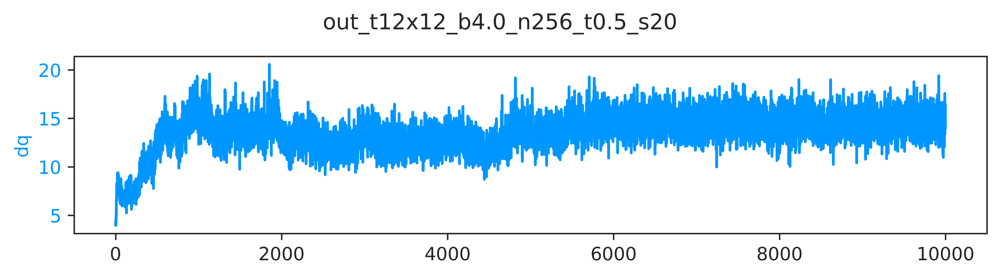

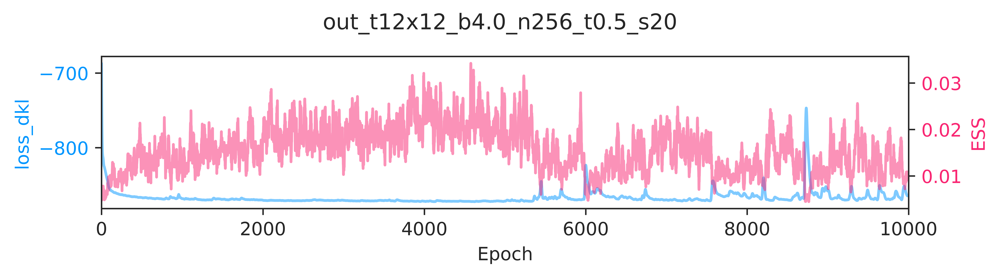

[17:33:29]  ---------------------------------------                                          
            ERA=0, last took: 0 min 0 s                                                      
            ---------------------------------------

[17:33:35]  epoch=47.000 step=0.000 dt=0.126 loss=-827.895 dq=7.50625 ess=0.00552013         
            plaq=0.71958 loss_dkl=-827.895 logp=414.478 logq=-413.417

[17:33:43]  epoch=97.000 step=0.000 dt=0.126 loss=-853.274 dq=6.66016 ess=0.0103828          
            plaq=0.794052 loss_dkl=-853.274 logp=457.374 logq=-395.9

[17:33:51]  epoch=147.000 step=0.000 dt=0.126 loss=-859.034 dq=7.29844 ess=0.0157515         
            plaq=0.813945 loss_dkl=-859.034 logp=468.833 logq=-390.202

[17:33:59]  epoch=197.000 step=0.000 dt=0.127 loss=-861.343 dq=6.83828 ess=0.00959589        
            plaq=0.819966 loss_dkl=-861.343 logp=472.3 logq=-389.043

[17:34:07]  epoch=247.000 step=0.000 dt=0.126 loss=-862.962 dq=7.40938 ess=0.0114306         
            plaq=0.826299 loss_dkl=-862.962 logp=475.948 logq=-387.014

[17:34:15]  epoch=297.000 step=0.000 dt=0.125 loss=-863.724 dq=9.27188 ess=0.0115503         
            plaq=0.825524 loss_dkl=-863.724 logp=475.502 logq=-388.222

[17:34:23]  epoch=347.000 step=0.000 dt=0.126 loss=-864.949 dq=10.132 ess=0.0151344          
            plaq=0.828126 loss_dkl=-864.949 logp=477.001 logq=-387.948

[17:34:31]  epoch=397.000 step=0.000 dt=0.127 loss=-865.74 dq=10.0086 ess=0.0102832          
            plaq=0.831792 loss_dkl=-865.74 logp=479.112 logq=-386.628

[17:34:39]  epoch=447.000 step=0.000 dt=0.125 loss=-866.082 dq=10.1852 ess=0.0125205         
            plaq=0.829287 loss_dkl=-866.082 logp=477.67 logq=-388.412

[17:34:47]  epoch=497.000 step=0.000 dt=0.124 loss=-866.763 dq=13.0391 ess=0.0112382         
            plaq=0.830568 loss_dkl=-866.763 logp=478.407 logq=-388.356

[17:34:55]  epoch=547.000 step=0.000 dt=0.124 loss=-866.785 dq=12.3391 ess=0.0118733         
            plaq=0.832716 loss_dkl=-866.785 logp=479.644 logq=-387.14

[17:35:03]  epoch=597.000 step=0.000 dt=0.126 loss=-867.552 dq=14.4312 ess=0.0133781         
            plaq=0.839061 loss_dkl=-867.552 logp=483.299 logq=-384.253

[17:35:11]  epoch=647.000 step=0.000 dt=0.125 loss=-868.247 dq=12.8594 ess=0.0149442         
            plaq=0.838033 loss_dkl=-868.247 logp=482.707 logq=-385.54

[17:35:19]  epoch=697.000 step=0.000 dt=0.124 loss=-867.953 dq=13.5375 ess=0.0176583         
            plaq=0.837415 loss_dkl=-867.953 logp=482.351 logq=-385.602

[17:35:27]  epoch=747.000 step=0.000 dt=0.125 loss=-868.093 dq=12.1727 ess=0.0197179         
            plaq=0.83541 loss_dkl=-868.093 logp=481.196 logq=-386.897

[17:35:35]  epoch=797.000 step=0.000 dt=0.125 loss=-868.763 dq=12.5539 ess=0.0128834         
            plaq=0.835684 loss_dkl=-868.763 logp=481.354 logq=-387.408

[17:35:43]  epoch=847.000 step=0.000 dt=0.124 loss=-868.614 dq=13.7164 ess=0.0115441         
            plaq=0.839579 loss_dkl=-868.614 logp=483.597 logq=-385.017

[17:35:51]  epoch=897.000 step=0.000 dt=0.124 loss=-866.658 dq=15.9641 ess=0.0144116         
            plaq=0.834609 loss_dkl=-866.658 logp=480.735 logq=-385.923

[17:35:59]  epoch=947.000 step=0.000 dt=0.125 loss=-867.339 dq=15.6172 ess=0.00703345        
            plaq=0.83628 loss_dkl=-867.339 logp=481.697 logq=-385.642

[17:36:07]  epoch=997.000 step=0.000 dt=0.124 loss=-867.84 dq=15.7664 ess=0.0171164          
            plaq=0.83996 loss_dkl=-867.84 logp=483.817 logq=-384.023

[17:36:09]  ---------------------------------------                                          
            ERA=1, last took: 2 min 40.15 s                                                  
            ---------------------------------------

[17:36:15]  epoch=47.000 step=47.000 dt=0.124 loss=-868.165 dq=15.0813 ess=0.0121642         
            plaq=0.838896 loss_dkl=-868.165 logp=483.204 logq=-384.961

[17:36:23]  epoch=97.000 step=97.000 dt=0.124 loss=-868.969 dq=15.3922 ess=0.0151721         
            plaq=0.842838 loss_dkl=-868.969 logp=485.475 logq=-383.494

[17:36:31]  epoch=147.000 step=147.000 dt=0.124 loss=-869.165 dq=15.3656 ess=0.0170632       
            plaq=0.837568 loss_dkl=-869.165 logp=482.439 logq=-386.725

[17:36:39]  epoch=197.000 step=197.000 dt=0.124 loss=-869.243 dq=12.643 ess=0.018413         
            plaq=0.835904 loss_dkl=-869.243 logp=481.48 logq=-387.763

[17:36:47]  epoch=247.000 step=247.000 dt=0.124 loss=-870.109 dq=14.1156 ess=0.0171391       
            plaq=0.840356 loss_dkl=-870.109 logp=484.045 logq=-386.064

[17:36:55]  epoch=297.000 step=297.000 dt=0.125 loss=-870.295 dq=13.1164 ess=0.017234        
            plaq=0.842198 loss_dkl=-870.295 logp=485.106 logq=-385.189

[17:37:03]  epoch=347.000 step=347.000 dt=0.126 loss=-869.753 dq=14.2148 ess=0.0164724       
            plaq=0.84086 loss_dkl=-869.753 logp=484.335 logq=-385.417

[17:37:11]  epoch=397.000 step=397.000 dt=0.125 loss=-867.545 dq=13.782 ess=0.0129173        
            plaq=0.84046 loss_dkl=-867.545 logp=484.105 logq=-383.44

[17:37:19]  epoch=447.000 step=447.000 dt=0.125 loss=-868.585 dq=15.4203 ess=0.0138198       
            plaq=0.837442 loss_dkl=-868.585 logp=482.367 logq=-386.219

[17:37:27]  epoch=497.000 step=497.000 dt=0.125 loss=-869.519 dq=12.5742 ess=0.020748        
            plaq=0.842407 loss_dkl=-869.519 logp=485.227 logq=-384.292

[17:37:35]  epoch=547.000 step=547.000 dt=0.125 loss=-869.719 dq=13.8727 ess=0.0112252       
            plaq=0.841324 loss_dkl=-869.719 logp=484.603 logq=-385.116

[17:37:43]  epoch=597.000 step=597.000 dt=0.124 loss=-869.601 dq=12.9055 ess=0.017278        
            plaq=0.841201 loss_dkl=-869.601 logp=484.532 logq=-385.069

[17:37:51]  epoch=647.000 step=647.000 dt=0.124 loss=-869.227 dq=14.0594 ess=0.0249238       
            plaq=0.838529 loss_dkl=-869.227 logp=482.993 logq=-386.234

[17:38:00]  epoch=697.000 step=697.000 dt=0.130 loss=-869.394 dq=15.3758 ess=0.0241718       
            plaq=0.842678 loss_dkl=-869.394 logp=485.383 logq=-384.011

[17:38:08]  epoch=747.000 step=747.000 dt=0.128 loss=-867.639 dq=13.6656 ess=0.0173581       
            plaq=0.840099 loss_dkl=-867.639 logp=483.897 logq=-383.742

[17:38:16]  epoch=797.000 step=797.000 dt=0.125 loss=-869.495 dq=13.6906 ess=0.00855774      
            plaq=0.838996 loss_dkl=-869.495 logp=483.262 logq=-386.233

[17:38:24]  epoch=847.000 step=847.000 dt=0.126 loss=-869.946 dq=14.7633 ess=0.0303831       
            plaq=0.842073 loss_dkl=-869.946 logp=485.034 logq=-384.913

[17:38:32]  epoch=897.000 step=897.000 dt=0.126 loss=-869.475 dq=15.1164 ess=0.0119063       
            plaq=0.84248 loss_dkl=-869.475 logp=485.268 logq=-384.207

[17:38:40]  epoch=947.000 step=947.000 dt=0.124 loss=-870.014 dq=15.5742 ess=0.0181354       
            plaq=0.84109 loss_dkl=-870.014 logp=484.468 logq=-385.546

[17:38:48]  epoch=997.000 step=997.000 dt=0.124 loss=-870.196 dq=12.8594 ess=0.0108165       
            plaq=0.841884 loss_dkl=-870.196 logp=484.925 logq=-385.271

[17:38:50]  ---------------------------------------                                          
            ERA=2, last took: 2 min 41.14 s                                                  
            ---------------------------------------

[17:38:56]  epoch=47.000 step=94.000 dt=0.124 loss=-870.839 dq=13.3859 ess=0.0160657         
            plaq=0.842542 loss_dkl=-870.839 logp=485.304 logq=-385.535

[17:39:04]  epoch=97.000 step=194.000 dt=0.126 loss=-870.438 dq=12.0469 ess=0.0224419        
            plaq=0.842003 loss_dkl=-870.438 logp=484.994 logq=-385.444

[17:39:13]  epoch=147.000 step=294.000 dt=0.135 loss=-870.845 dq=12.5039 ess=0.017716        
            plaq=0.845184 loss_dkl=-870.845 logp=486.826 logq=-384.019

[17:39:21]  epoch=197.000 step=394.000 dt=0.127 loss=-870.752 dq=13.4789 ess=0.0140486       
            plaq=0.844101 loss_dkl=-870.752 logp=486.202 logq=-384.55

[17:39:29]  epoch=247.000 step=494.000 dt=0.129 loss=-870.792 dq=13.2422 ess=0.0154511       
            plaq=0.84364 loss_dkl=-870.792 logp=485.937 logq=-384.855

[17:39:37]  epoch=297.000 step=594.000 dt=0.124 loss=-870.958 dq=11.6789 ess=0.00878958      
            plaq=0.842291 loss_dkl=-870.958 logp=485.159 logq=-385.798

[17:39:45]  epoch=347.000 step=694.000 dt=0.130 loss=-870.749 dq=12.8055 ess=0.0229959       
            plaq=0.843761 loss_dkl=-870.749 logp=486.006 logq=-384.743

[17:39:54]  epoch=397.000 step=794.000 dt=0.131 loss=-871.139 dq=13.1695 ess=0.0364104       
            plaq=0.843314 loss_dkl=-871.139 logp=485.749 logq=-385.39

[17:40:02]  epoch=447.000 step=894.000 dt=0.126 loss=-871.057 dq=12.5008 ess=0.0134234       
            plaq=0.84562 loss_dkl=-871.057 logp=487.077 logq=-383.98

[17:40:10]  epoch=497.000 step=994.000 dt=0.129 loss=-871.148 dq=13.2727 ess=0.0178246       
            plaq=0.839456 loss_dkl=-871.148 logp=483.527 logq=-387.621

[17:40:18]  epoch=547.000 step=1094.000 dt=0.127 loss=-870.728 dq=12.5297 ess=0.0201444      
            plaq=0.841019 loss_dkl=-870.728 logp=484.427 logq=-386.302

[17:40:27]  epoch=597.000 step=1194.000 dt=0.127 loss=-870.664 dq=11.5734 ess=0.0214929      
            plaq=0.839667 loss_dkl=-870.664 logp=483.648 logq=-387.015

[17:40:35]  epoch=647.000 step=1294.000 dt=0.125 loss=-869.671 dq=11.9305 ess=0.0184993      
            plaq=0.842419 loss_dkl=-869.671 logp=485.233 logq=-384.438

[17:40:43]  epoch=697.000 step=1394.000 dt=0.128 loss=-870.372 dq=12.1578 ess=0.0158025      
            plaq=0.844503 loss_dkl=-870.372 logp=486.434 logq=-383.938

[17:40:51]  epoch=747.000 step=1494.000 dt=0.125 loss=-870.402 dq=11.2094 ess=0.0233614      
            plaq=0.842695 loss_dkl=-870.402 logp=485.393 logq=-385.01

[17:40:59]  epoch=797.000 step=1594.000 dt=0.125 loss=-870.895 dq=12.2211 ess=0.0237401      
            plaq=0.843312 loss_dkl=-870.895 logp=485.748 logq=-385.147

[17:41:07]  epoch=847.000 step=1694.000 dt=0.125 loss=-870.815 dq=12.2055 ess=0.0133611      
            plaq=0.846084 loss_dkl=-870.815 logp=487.345 logq=-383.47

[17:41:16]  epoch=897.000 step=1794.000 dt=0.126 loss=-870.932 dq=12.493 ess=0.0209766       
            plaq=0.846715 loss_dkl=-870.932 logp=487.708 logq=-383.225

[17:41:24]  epoch=947.000 step=1894.000 dt=0.127 loss=-870.632 dq=13.625 ess=0.021331        
            plaq=0.844288 loss_dkl=-870.632 logp=486.31 logq=-384.322

[17:41:32]  epoch=997.000 step=1994.000 dt=0.126 loss=-870.491 dq=14.3109 ess=0.0143628      
            plaq=0.843433 loss_dkl=-870.491 logp=485.817 logq=-384.673

[17:41:34]  ---------------------------------------                                          
            ERA=3, last took: 2 min 43.63 s                                                  
            ---------------------------------------

[17:41:40]  epoch=47.000 step=141.000 dt=0.125 loss=-870.914 dq=13.5742 ess=0.0238588        
            plaq=0.840051 loss_dkl=-870.914 logp=483.87 logq=-387.044

[17:41:49]  epoch=97.000 step=291.000 dt=0.128 loss=-871.241 dq=13.6008 ess=0.0196972        
            plaq=0.846077 loss_dkl=-871.241 logp=487.34 logq=-383.9

[17:41:57]  epoch=147.000 step=441.000 dt=0.126 loss=-871.187 dq=13.5539 ess=0.0221546       
            plaq=0.844123 loss_dkl=-871.187 logp=486.215 logq=-384.972

[17:42:05]  epoch=197.000 step=591.000 dt=0.127 loss=-871.635 dq=12.0734 ess=0.0126918       
            plaq=0.845267 loss_dkl=-871.635 logp=486.874 logq=-384.761

[17:42:13]  epoch=247.000 step=741.000 dt=0.125 loss=-870.866 dq=13.0086 ess=0.0199043       
            plaq=0.842897 loss_dkl=-870.866 logp=485.508 logq=-385.358

[17:42:21]  epoch=297.000 step=891.000 dt=0.127 loss=-871.197 dq=12.0352 ess=0.0227387       
            plaq=0.842636 loss_dkl=-871.197 logp=485.358 logq=-385.839

[17:42:30]  epoch=347.000 step=1041.000 dt=0.130 loss=-871.351 dq=11.875 ess=0.0138796       
            plaq=0.841991 loss_dkl=-871.351 logp=484.987 logq=-386.364

[17:42:38]  epoch=397.000 step=1191.000 dt=0.126 loss=-871.25 dq=11.7688 ess=0.0150302       
            plaq=0.846875 loss_dkl=-871.25 logp=487.8 logq=-383.45

[17:42:46]  epoch=447.000 step=1341.000 dt=0.125 loss=-870.752 dq=12.7 ess=0.0219771         
            plaq=0.843707 loss_dkl=-870.752 logp=485.975 logq=-384.777

[17:42:54]  epoch=497.000 step=1491.000 dt=0.125 loss=-870.988 dq=12.207 ess=0.0187747       
            plaq=0.844424 loss_dkl=-870.988 logp=486.388 logq=-384.6

[17:43:02]  epoch=547.000 step=1641.000 dt=0.125 loss=-870.649 dq=13.6414 ess=0.0222174      
            plaq=0.843095 loss_dkl=-870.649 logp=485.623 logq=-385.026

[17:43:10]  epoch=597.000 step=1791.000 dt=0.125 loss=-871.24 dq=12.7258 ess=0.0246052       
            plaq=0.847545 loss_dkl=-871.24 logp=488.186 logq=-383.054

[17:43:19]  epoch=647.000 step=1941.000 dt=0.126 loss=-871.545 dq=12.6438 ess=0.0206384      
            plaq=0.844165 loss_dkl=-871.545 logp=486.239 logq=-385.306

[17:43:27]  epoch=697.000 step=2091.000 dt=0.126 loss=-870.752 dq=12.4812 ess=0.0212262      
            plaq=0.841818 loss_dkl=-870.752 logp=484.887 logq=-385.865

[17:43:36]  epoch=747.000 step=2241.000 dt=0.129 loss=-871.827 dq=12.6695 ess=0.0226213      
            plaq=0.847792 loss_dkl=-871.827 logp=488.328 logq=-383.499

[17:43:44]  epoch=797.000 step=2391.000 dt=0.128 loss=-871.53 dq=12.8891 ess=0.0271027       
            plaq=0.846719 loss_dkl=-871.53 logp=487.71 logq=-383.82

[17:43:52]  epoch=847.000 step=2541.000 dt=0.126 loss=-871.459 dq=12.3164 ess=0.0275808      
            plaq=0.844829 loss_dkl=-871.459 logp=486.622 logq=-384.837

[17:44:00]  epoch=897.000 step=2691.000 dt=0.126 loss=-871.974 dq=13.0492 ess=0.0218023      
            plaq=0.847712 loss_dkl=-871.974 logp=488.282 logq=-383.692

[17:44:09]  epoch=947.000 step=2841.000 dt=0.126 loss=-871.962 dq=12.3734 ess=0.0256303      
            plaq=0.84776 loss_dkl=-871.962 logp=488.31 logq=-383.653

[17:44:17]  epoch=997.000 step=2991.000 dt=0.126 loss=-871.62 dq=13.2992 ess=0.0321556       
            plaq=0.84707 loss_dkl=-871.62 logp=487.912 logq=-383.707

[17:44:19]  ---------------------------------------                                          
            ERA=4, last took: 2 min 45.08 s                                                  
            ---------------------------------------

[17:44:25]  epoch=47.000 step=188.000 dt=0.129 loss=-871.717 dq=11.8156 ess=0.026774         
            plaq=0.844967 loss_dkl=-871.717 logp=486.701 logq=-385.016

[17:44:34]  epoch=97.000 step=388.000 dt=0.136 loss=-872.121 dq=13.175 ess=0.0207213         
            plaq=0.848759 loss_dkl=-872.121 logp=488.885 logq=-383.235

[17:44:42]  epoch=147.000 step=588.000 dt=0.127 loss=-872.305 dq=12.6445 ess=0.0385621       
            plaq=0.849682 loss_dkl=-872.305 logp=489.417 logq=-382.888

[17:44:50]  epoch=197.000 step=788.000 dt=0.127 loss=-871.332 dq=12.2211 ess=0.0102572       
            plaq=0.842629 loss_dkl=-871.332 logp=485.354 logq=-385.978

[17:44:59]  epoch=247.000 step=988.000 dt=0.127 loss=-871.86 dq=13.1898 ess=0.0151498        
            plaq=0.845398 loss_dkl=-871.86 logp=486.949 logq=-384.911

[17:45:07]  epoch=297.000 step=1188.000 dt=0.126 loss=-871.74 dq=11.4406 ess=0.0121322       
            plaq=0.844087 loss_dkl=-871.74 logp=486.194 logq=-385.546

[17:45:15]  epoch=347.000 step=1388.000 dt=0.127 loss=-872.038 dq=12.6133 ess=0.0166851      
            plaq=0.84902 loss_dkl=-872.038 logp=489.036 logq=-383.002

[17:45:23]  epoch=397.000 step=1588.000 dt=0.132 loss=-872.012 dq=12.4734 ess=0.0190709      
            plaq=0.848032 loss_dkl=-872.012 logp=488.466 logq=-383.545

[17:45:32]  epoch=447.000 step=1788.000 dt=0.127 loss=-871.524 dq=10.6672 ess=0.020794       
            plaq=0.843879 loss_dkl=-871.524 logp=486.074 logq=-385.45

[17:45:40]  epoch=497.000 step=1988.000 dt=0.130 loss=-871.987 dq=11.4648 ess=0.011407       
            plaq=0.846692 loss_dkl=-871.987 logp=487.695 logq=-384.293

[17:45:49]  epoch=547.000 step=2188.000 dt=0.126 loss=-872.13 dq=11.7961 ess=0.0159075       
            plaq=0.848041 loss_dkl=-872.13 logp=488.472 logq=-383.659

[17:45:57]  epoch=597.000 step=2388.000 dt=0.127 loss=-872.143 dq=12.0094 ess=0.0196158      
            plaq=0.845751 loss_dkl=-872.143 logp=487.153 logq=-384.991

[17:46:05]  epoch=647.000 step=2588.000 dt=0.127 loss=-871.814 dq=13.4383 ess=0.0200041      
            plaq=0.847664 loss_dkl=-871.814 logp=488.254 logq=-383.56

[17:46:13]  epoch=697.000 step=2788.000 dt=0.126 loss=-871.762 dq=13.3133 ess=0.0301862      
            plaq=0.846651 loss_dkl=-871.762 logp=487.671 logq=-384.09

[17:46:22]  epoch=747.000 step=2988.000 dt=0.128 loss=-871.44 dq=13.1023 ess=0.0243337       
            plaq=0.844035 loss_dkl=-871.44 logp=486.164 logq=-385.276

[17:46:31]  epoch=797.000 step=3188.000 dt=0.132 loss=-871.927 dq=14.0977 ess=0.0204275      
            plaq=0.848003 loss_dkl=-871.927 logp=488.45 logq=-383.477

[17:46:39]  epoch=847.000 step=3388.000 dt=0.136 loss=-871.896 dq=14.8078 ess=0.0245724      
            plaq=0.84763 loss_dkl=-871.896 logp=488.235 logq=-383.662

[17:46:48]  epoch=897.000 step=3588.000 dt=0.131 loss=-871.292 dq=14.307 ess=0.0294307       
            plaq=0.847963 loss_dkl=-871.292 logp=488.427 logq=-382.866

[17:46:56]  epoch=947.000 step=3788.000 dt=0.131 loss=-871.645 dq=13.4508 ess=0.0159582      
            plaq=0.847888 loss_dkl=-871.645 logp=488.384 logq=-383.262

[17:47:05]  epoch=997.000 step=3988.000 dt=0.132 loss=-871.614 dq=14.9555 ess=0.0311736      
            plaq=0.846094 loss_dkl=-871.614 logp=487.35 logq=-384.264

[17:47:07]  ---------------------------------------                                          
            ERA=5, last took: 2 min 47.8 s                                                   
            ---------------------------------------

[17:47:13]  epoch=47.000 step=235.000 dt=0.130 loss=-870.581 dq=12.6031 ess=0.0187264        
            plaq=0.848933 loss_dkl=-870.581 logp=488.985 logq=-381.595

[17:47:22]  epoch=97.000 step=485.000 dt=0.130 loss=-870.193 dq=13.4898 ess=0.0247494        
            plaq=0.847294 loss_dkl=-870.193 logp=488.041 logq=-382.152

[17:47:30]  epoch=147.000 step=735.000 dt=0.133 loss=-871.528 dq=13.993 ess=0.0191719        
            plaq=0.843067 loss_dkl=-871.528 logp=485.607 logq=-385.921

[17:47:39]  epoch=197.000 step=985.000 dt=0.131 loss=-871.195 dq=13.3945 ess=0.0346465       
            plaq=0.845832 loss_dkl=-871.195 logp=487.2 logq=-383.995

[17:47:47]  epoch=247.000 step=1235.000 dt=0.130 loss=-871.908 dq=13.95 ess=0.0248629        
            plaq=0.850788 loss_dkl=-871.908 logp=490.054 logq=-381.853

[17:47:56]  epoch=297.000 step=1485.000 dt=0.130 loss=-871.77 dq=12.8414 ess=0.0147501       
            plaq=0.848773 loss_dkl=-871.77 logp=488.893 logq=-382.877

[17:48:04]  epoch=347.000 step=1735.000 dt=0.129 loss=-871.659 dq=13.4688 ess=0.013185       
            plaq=0.846561 loss_dkl=-871.659 logp=487.619 logq=-384.04

[17:48:13]  epoch=397.000 step=1985.000 dt=0.129 loss=-868.224 dq=13.5312 ess=0.0204431      
            plaq=0.849092 loss_dkl=-868.224 logp=489.077 logq=-379.147

[17:48:21]  epoch=447.000 step=2235.000 dt=0.129 loss=-853.238 dq=14.4141 ess=0.00735298     
            plaq=0.840422 loss_dkl=-853.238 logp=484.083 logq=-369.155

[17:48:30]  epoch=497.000 step=2485.000 dt=0.130 loss=-867.524 dq=13.9391 ess=0.0184685      
            plaq=0.846979 loss_dkl=-867.524 logp=487.86 logq=-379.664

[17:48:38]  epoch=547.000 step=2735.000 dt=0.130 loss=-867.954 dq=13.0867 ess=0.00586804     
            plaq=0.843617 loss_dkl=-867.954 logp=485.924 logq=-382.03

[17:48:47]  epoch=597.000 step=2985.000 dt=0.130 loss=-867.103 dq=15.8047 ess=0.0233021      
            plaq=0.846911 loss_dkl=-867.103 logp=487.821 logq=-379.282

[17:48:55]  epoch=647.000 step=3235.000 dt=0.129 loss=-869.135 dq=13.7359 ess=0.0108463      
            plaq=0.84759 loss_dkl=-869.135 logp=488.212 logq=-380.923

[17:49:04]  epoch=697.000 step=3485.000 dt=0.130 loss=-855.711 dq=13.9195 ess=0.011107       
            plaq=0.829764 loss_dkl=-855.711 logp=477.944 logq=-377.767

[17:49:13]  epoch=747.000 step=3735.000 dt=0.129 loss=-865.424 dq=15.4203 ess=0.011305       
            plaq=0.842671 loss_dkl=-865.424 logp=485.378 logq=-380.046

[17:49:22]  epoch=797.000 step=3985.000 dt=0.129 loss=-868.973 dq=14.1086 ess=0.0138966      
            plaq=0.844273 loss_dkl=-868.973 logp=486.301 logq=-382.672

[17:49:31]  epoch=847.000 step=4235.000 dt=0.129 loss=-869.222 dq=14.8711 ess=0.0117933      
            plaq=0.846021 loss_dkl=-869.222 logp=487.308 logq=-381.914

[17:49:39]  epoch=897.000 step=4485.000 dt=0.129 loss=-870.068 dq=14.5297 ess=0.0125268      
            plaq=0.846536 loss_dkl=-870.068 logp=487.605 logq=-382.463

[17:49:48]  epoch=947.000 step=4735.000 dt=0.129 loss=-870.022 dq=14.8281 ess=0.0246538      
            plaq=0.846904 loss_dkl=-870.022 logp=487.817 logq=-382.205

[17:49:56]  epoch=997.000 step=4985.000 dt=0.130 loss=-844.238 dq=15.1828 ess=0.00610007     
            plaq=0.845605 loss_dkl=-844.238 logp=487.069 logq=-357.169

[17:49:58]  ---------------------------------------                                          
            ERA=6, last took: 2 min 51.41 s                                                  
            ---------------------------------------

[17:50:05]  epoch=47.000 step=282.000 dt=0.129 loss=-852.378 dq=14.1625 ess=0.00762324       
            plaq=0.847206 loss_dkl=-852.378 logp=487.991 logq=-364.387

[17:50:13]  epoch=97.000 step=582.000 dt=0.129 loss=-858.643 dq=14.7609 ess=0.0102953        
            plaq=0.846883 loss_dkl=-858.643 logp=487.805 logq=-370.838

[17:50:21]  epoch=147.000 step=882.000 dt=0.126 loss=-854.696 dq=12.4031 ess=0.00791753      
            plaq=0.844738 loss_dkl=-854.696 logp=486.569 logq=-368.126

[17:50:30]  epoch=197.000 step=1182.000 dt=0.127 loss=-858.513 dq=14.0813 ess=0.0107145      
            plaq=0.845984 loss_dkl=-858.513 logp=487.287 logq=-371.226

[17:50:38]  epoch=247.000 step=1482.000 dt=0.127 loss=-864.762 dq=15.425 ess=0.0103306       
            plaq=0.846034 loss_dkl=-864.762 logp=487.316 logq=-377.447

[17:50:47]  epoch=297.000 step=1782.000 dt=0.127 loss=-866.188 dq=14.0633 ess=0.00995106     
            plaq=0.848825 loss_dkl=-866.188 logp=488.923 logq=-377.265

[17:50:55]  epoch=347.000 step=2082.000 dt=0.128 loss=-865.151 dq=14.7102 ess=0.011955       
            plaq=0.84866 loss_dkl=-865.151 logp=488.828 logq=-376.323

[17:51:03]  epoch=397.000 step=2382.000 dt=0.126 loss=-868.368 dq=14.9422 ess=0.0252845      
            plaq=0.84863 loss_dkl=-868.368 logp=488.811 logq=-379.558

[17:51:12]  epoch=447.000 step=2682.000 dt=0.127 loss=-865.126 dq=14.3367 ess=0.00743582     
            plaq=0.846397 loss_dkl=-865.126 logp=487.525 logq=-377.601

[17:51:20]  epoch=497.000 step=2982.000 dt=0.127 loss=-866.06 dq=12.9781 ess=0.00884034      
            plaq=0.848963 loss_dkl=-866.06 logp=489.003 logq=-377.058

[17:51:28]  epoch=547.000 step=3282.000 dt=0.126 loss=-865.971 dq=15.2117 ess=0.0152095      
            plaq=0.846775 loss_dkl=-865.971 logp=487.742 logq=-378.229

[17:51:37]  epoch=597.000 step=3582.000 dt=0.126 loss=-869.243 dq=14.6016 ess=0.0290806      
            plaq=0.846264 loss_dkl=-869.243 logp=487.448 logq=-381.795

[17:51:45]  epoch=647.000 step=3882.000 dt=0.126 loss=-869.545 dq=15.4023 ess=0.0120504      
            plaq=0.849521 loss_dkl=-869.545 logp=489.324 logq=-380.221

[17:51:53]  epoch=697.000 step=4182.000 dt=0.126 loss=-869.999 dq=14.4805 ess=0.0251999      
            plaq=0.847818 loss_dkl=-869.999 logp=488.343 logq=-381.656

[17:52:02]  epoch=747.000 step=4482.000 dt=0.127 loss=-854.811 dq=14.5188 ess=0.00560854     
            plaq=0.834047 loss_dkl=-854.811 logp=480.411 logq=-374.4

[17:52:10]  epoch=797.000 step=4782.000 dt=0.128 loss=-867.506 dq=14.6391 ess=0.0101263      
            plaq=0.845131 loss_dkl=-867.506 logp=486.795 logq=-380.711

[17:52:19]  epoch=847.000 step=5082.000 dt=0.126 loss=-869.342 dq=14.6398 ess=0.0219189      
            plaq=0.846815 loss_dkl=-869.342 logp=487.766 logq=-381.576

[17:52:27]  epoch=897.000 step=5382.000 dt=0.126 loss=-869.666 dq=13.9922 ess=0.014816       
            plaq=0.846291 loss_dkl=-869.666 logp=487.464 logq=-382.202

[17:52:35]  epoch=947.000 step=5682.000 dt=0.126 loss=-869.518 dq=14.1422 ess=0.0132376      
            plaq=0.844811 loss_dkl=-869.518 logp=486.611 logq=-382.907

[17:52:44]  epoch=997.000 step=5982.000 dt=0.126 loss=-870.005 dq=13.832 ess=0.022266        
            plaq=0.847308 loss_dkl=-870.005 logp=488.049 logq=-381.956

[17:52:46]  ---------------------------------------                                          
            ERA=7, last took: 2 min 48.14 s                                                  
            ---------------------------------------

[17:52:52]  epoch=47.000 step=329.000 dt=0.126 loss=-869.855 dq=13.5984 ess=0.0276286        
            plaq=0.846969 loss_dkl=-869.855 logp=487.854 logq=-382

[17:53:01]  epoch=97.000 step=679.000 dt=0.126 loss=-869.495 dq=15.1578 ess=0.0160658        
            plaq=0.847543 loss_dkl=-869.495 logp=488.185 logq=-381.31

[17:53:10]  epoch=147.000 step=1029.000 dt=0.136 loss=-871.13 dq=14.5125 ess=0.0202011       
            plaq=0.849203 loss_dkl=-871.13 logp=489.141 logq=-381.99

[17:53:18]  epoch=197.000 step=1379.000 dt=0.127 loss=-871.616 dq=13.8133 ess=0.011114       
            plaq=0.846768 loss_dkl=-871.616 logp=487.739 logq=-383.877

[17:53:27]  epoch=247.000 step=1729.000 dt=0.128 loss=-871.101 dq=14.5445 ess=0.0173084      
            plaq=0.849899 loss_dkl=-871.101 logp=489.542 logq=-381.559

[17:53:35]  epoch=297.000 step=2079.000 dt=0.130 loss=-868.162 dq=14.4336 ess=0.012084       
            plaq=0.849365 loss_dkl=-868.162 logp=489.234 logq=-378.927

[17:53:44]  epoch=347.000 step=2429.000 dt=0.128 loss=-869.641 dq=14.6438 ess=0.0235394      
            plaq=0.846348 loss_dkl=-869.641 logp=487.496 logq=-382.145

[17:53:52]  epoch=397.000 step=2779.000 dt=0.129 loss=-868.77 dq=15.1852 ess=0.0239501       
            plaq=0.844807 loss_dkl=-868.77 logp=486.609 logq=-382.161

[17:54:01]  epoch=447.000 step=3129.000 dt=0.129 loss=-870.708 dq=15.95 ess=0.0176005        
            plaq=0.847621 loss_dkl=-870.708 logp=488.23 logq=-382.478

[17:54:10]  epoch=497.000 step=3479.000 dt=0.131 loss=-870.288 dq=14.6703 ess=0.0154827      
            plaq=0.84856 loss_dkl=-870.288 logp=488.77 logq=-381.517

[17:54:18]  epoch=547.000 step=3829.000 dt=0.131 loss=-871.335 dq=14.6711 ess=0.0141013      
            plaq=0.849365 loss_dkl=-871.335 logp=489.234 logq=-382.101

[17:54:27]  epoch=597.000 step=4179.000 dt=0.129 loss=-847.955 dq=14.6289 ess=0.00827211     
            plaq=0.844366 loss_dkl=-847.955 logp=486.355 logq=-361.6

[17:54:35]  epoch=647.000 step=4529.000 dt=0.128 loss=-862.141 dq=13.2922 ess=0.0118855      
            plaq=0.847887 loss_dkl=-862.141 logp=488.383 logq=-373.758

[17:54:44]  epoch=697.000 step=4879.000 dt=0.128 loss=-864.745 dq=13.4547 ess=0.0148623      
            plaq=0.845786 loss_dkl=-864.745 logp=487.173 logq=-377.572

[17:54:52]  epoch=747.000 step=5229.000 dt=0.128 loss=-864.648 dq=14.7133 ess=0.0104968      
            plaq=0.847683 loss_dkl=-864.648 logp=488.266 logq=-376.382

[17:55:01]  epoch=797.000 step=5579.000 dt=0.128 loss=-858.014 dq=14.7969 ess=0.0086819      
            plaq=0.842181 loss_dkl=-858.014 logp=485.096 logq=-372.918

[17:55:10]  epoch=847.000 step=5929.000 dt=0.130 loss=-861.266 dq=14.4695 ess=0.00743966     
            plaq=0.84569 loss_dkl=-861.266 logp=487.118 logq=-374.148

[17:55:18]  epoch=897.000 step=6279.000 dt=0.130 loss=-861.085 dq=14.85 ess=0.00897998       
            plaq=0.846198 loss_dkl=-861.085 logp=487.41 logq=-373.675

[17:55:27]  epoch=947.000 step=6629.000 dt=0.127 loss=-865.055 dq=13.6391 ess=0.0137235      
            plaq=0.848876 loss_dkl=-865.055 logp=488.952 logq=-376.102

[17:55:36]  epoch=997.000 step=6979.000 dt=0.128 loss=-865.065 dq=14.5141 ess=0.0135745      
            plaq=0.84594 loss_dkl=-865.065 logp=487.262 logq=-377.804

[17:55:39]  ---------------------------------------                                          
            ERA=8, last took: 2 min 53.32 s                                                  
            ---------------------------------------

[17:55:46]  epoch=47.000 step=376.000 dt=0.128 loss=-866.518 dq=14.8797 ess=0.00782997       
            plaq=0.841931 loss_dkl=-866.518 logp=484.952 logq=-381.566

[17:55:54]  epoch=97.000 step=776.000 dt=0.130 loss=-865.263 dq=16.1727 ess=0.0162356        
            plaq=0.848628 loss_dkl=-865.263 logp=488.81 logq=-376.454

[17:56:03]  epoch=147.000 step=1176.000 dt=0.132 loss=-866.192 dq=14.907 ess=0.00849695      
            plaq=0.847689 loss_dkl=-866.192 logp=488.269 logq=-377.923

[17:56:12]  epoch=197.000 step=1576.000 dt=0.131 loss=-859.477 dq=13.7336 ess=0.00698821     
            plaq=0.850421 loss_dkl=-859.477 logp=489.843 logq=-369.635

[17:56:20]  epoch=247.000 step=1976.000 dt=0.128 loss=-869.932 dq=14.1633 ess=0.0159895      
            plaq=0.845592 loss_dkl=-869.932 logp=487.061 logq=-382.871

[17:56:29]  epoch=297.000 step=2376.000 dt=0.128 loss=-870.689 dq=15.6031 ess=0.0156102      
            plaq=0.848864 loss_dkl=-870.689 logp=488.945 logq=-381.744

[17:56:37]  epoch=347.000 step=2776.000 dt=0.127 loss=-866.177 dq=14.6664 ess=0.0168332      
            plaq=0.843982 loss_dkl=-866.177 logp=486.134 logq=-380.043

[17:56:46]  epoch=397.000 step=3176.000 dt=0.130 loss=-868.861 dq=14.157 ess=0.0159843       
            plaq=0.846035 loss_dkl=-868.861 logp=487.316 logq=-381.544

[17:56:55]  epoch=447.000 step=3576.000 dt=0.130 loss=-869.357 dq=14.6984 ess=0.019976       
            plaq=0.844255 loss_dkl=-869.357 logp=486.291 logq=-383.066

[17:57:03]  epoch=497.000 step=3976.000 dt=0.128 loss=-869.693 dq=13.8539 ess=0.0203484      
            plaq=0.847263 loss_dkl=-869.693 logp=488.023 logq=-381.67

[17:57:12]  epoch=547.000 step=4376.000 dt=0.128 loss=-870.65 dq=13.5437 ess=0.0291039       
            plaq=0.849011 loss_dkl=-870.65 logp=489.03 logq=-381.62

[17:57:21]  epoch=597.000 step=4776.000 dt=0.132 loss=-864.711 dq=15.45 ess=0.00790045       
            plaq=0.847209 loss_dkl=-864.711 logp=487.993 logq=-376.719

[17:57:29]  epoch=647.000 step=5176.000 dt=0.142 loss=-866.018 dq=14.4641 ess=0.00929868     
            plaq=0.84755 loss_dkl=-866.018 logp=488.189 logq=-377.829

[17:57:38]  epoch=697.000 step=5576.000 dt=0.129 loss=-866.546 dq=15.4586 ess=0.00967649     
            plaq=0.848445 loss_dkl=-866.546 logp=488.704 logq=-377.841

[17:57:47]  epoch=747.000 step=5976.000 dt=0.130 loss=-759.973 dq=14.0719 ess=0.00631513     
            plaq=0.849819 loss_dkl=-759.973 logp=489.496 logq=-270.477

[17:57:56]  epoch=797.000 step=6376.000 dt=0.130 loss=-853.281 dq=14.0414 ess=0.0079612      
            plaq=0.85064 loss_dkl=-853.281 logp=489.968 logq=-363.313

[17:58:04]  epoch=847.000 step=6776.000 dt=0.133 loss=-859.831 dq=14.5766 ess=0.00837604     
            plaq=0.850749 loss_dkl=-859.831 logp=490.031 logq=-369.799

[17:58:13]  epoch=897.000 step=7176.000 dt=0.129 loss=-866.711 dq=14.5352 ess=0.0156065      
            plaq=0.849868 loss_dkl=-866.711 logp=489.524 logq=-377.187

[17:58:22]  epoch=947.000 step=7576.000 dt=0.128 loss=-855.55 dq=14.3703 ess=0.0106052       
            plaq=0.846503 loss_dkl=-855.55 logp=487.586 logq=-367.965

[17:58:30]  epoch=997.000 step=7976.000 dt=0.144 loss=-856.7 dq=14.8047 ess=0.0117622        
            plaq=0.848313 loss_dkl=-856.7 logp=488.628 logq=-368.071

[17:58:33]  ---------------------------------------                                          
            ERA=9, last took: 2 min 53.15 s                                                  
            ---------------------------------------

[17:58:40]  epoch=47.000 step=423.000 dt=0.144 loss=-868.754 dq=15.1914 ess=0.0211702        
            plaq=0.851633 loss_dkl=-868.754 logp=490.541 logq=-378.213

[17:58:49]  epoch=97.000 step=873.000 dt=0.132 loss=-867.167 dq=14.8328 ess=0.00985122       
            plaq=0.848646 loss_dkl=-867.167 logp=488.82 logq=-378.347

[17:58:58]  epoch=147.000 step=1323.000 dt=0.129 loss=-864.757 dq=15.2602 ess=0.0110384      
            plaq=0.848097 loss_dkl=-864.757 logp=488.504 logq=-376.253

[17:59:06]  epoch=197.000 step=1773.000 dt=0.130 loss=-869.707 dq=14.3406 ess=0.0109359      
            plaq=0.847342 loss_dkl=-869.707 logp=488.069 logq=-381.638

[17:59:15]  epoch=247.000 step=2223.000 dt=0.132 loss=-869.931 dq=13.5562 ess=0.0119091      
            plaq=0.849154 loss_dkl=-869.931 logp=489.113 logq=-380.818

[17:59:24]  epoch=297.000 step=2673.000 dt=0.129 loss=-851.481 dq=14.5477 ess=0.00617449     
            plaq=0.84664 loss_dkl=-851.481 logp=487.664 logq=-363.816

[17:59:32]  epoch=347.000 step=3123.000 dt=0.129 loss=-869.323 dq=13.9328 ess=0.0121975      
            plaq=0.850232 loss_dkl=-869.323 logp=489.734 logq=-379.589

[17:59:41]  epoch=397.000 step=3573.000 dt=0.130 loss=-867.816 dq=14.0984 ess=0.0151583      
            plaq=0.850145 loss_dkl=-867.816 logp=489.683 logq=-378.133

[17:59:50]  epoch=447.000 step=4023.000 dt=0.129 loss=-867.402 dq=15.0766 ess=0.00695259     
            plaq=0.850067 loss_dkl=-867.402 logp=489.639 logq=-377.764

[17:59:58]  epoch=497.000 step=4473.000 dt=0.129 loss=-856.215 dq=14.1266 ess=0.0062756      
            plaq=0.848659 loss_dkl=-856.215 logp=488.828 logq=-367.388

[18:00:07]  epoch=547.000 step=4923.000 dt=0.129 loss=-868.734 dq=15.4 ess=0.00914431        
            plaq=0.849098 loss_dkl=-868.734 logp=489.081 logq=-379.653

[18:00:16]  epoch=597.000 step=5373.000 dt=0.129 loss=-867.66 dq=14.3734 ess=0.0102727       
            plaq=0.849448 loss_dkl=-867.66 logp=489.282 logq=-378.378

[18:00:24]  epoch=647.000 step=5823.000 dt=0.129 loss=-849.587 dq=15.0375 ess=0.00611059     
            plaq=0.851384 loss_dkl=-849.587 logp=490.397 logq=-359.19

[18:00:33]  epoch=697.000 step=6273.000 dt=0.130 loss=-860.286 dq=14.6281 ess=0.0126434      
            plaq=0.850868 loss_dkl=-860.286 logp=490.1 logq=-370.186

[18:00:42]  epoch=747.000 step=6723.000 dt=0.129 loss=-868.698 dq=14.5539 ess=0.0141672      
            plaq=0.849943 loss_dkl=-868.698 logp=489.567 logq=-379.132

[18:00:50]  epoch=797.000 step=7173.000 dt=0.129 loss=-868.245 dq=14.5836 ess=0.00950148     
            plaq=0.84747 loss_dkl=-868.245 logp=488.143 logq=-380.102

[18:00:59]  epoch=847.000 step=7623.000 dt=0.130 loss=-858.035 dq=14.7648 ess=0.00966332     
            plaq=0.847882 loss_dkl=-858.035 logp=488.38 logq=-369.655

[18:01:08]  epoch=897.000 step=8073.000 dt=0.129 loss=-867.359 dq=14.5148 ess=0.0121226      
            plaq=0.847027 loss_dkl=-867.359 logp=487.887 logq=-379.472

[18:01:16]  epoch=947.000 step=8523.000 dt=0.129 loss=-851.681 dq=14.4297 ess=0.00752567     
            plaq=0.852207 loss_dkl=-851.681 logp=490.871 logq=-360.81

[18:01:25]  epoch=997.000 step=8973.000 dt=0.129 loss=-865.312 dq=14.6672 ess=0.00886533     
            plaq=0.85131 loss_dkl=-865.312 logp=490.355 logq=-374.958

[18:01:27]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n
            256_t0.5_s20/models/pre_flow_model/2021-05-25-1650

[18:01:27]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0
            _n256_t0.5_s20/models/pre_flow_model/2021-05-25-1650/pre_flow_model.tar

NameError: name 'save_live_plots' is not defined

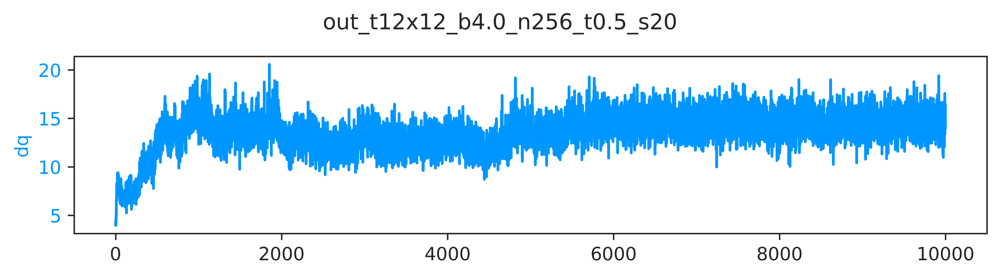

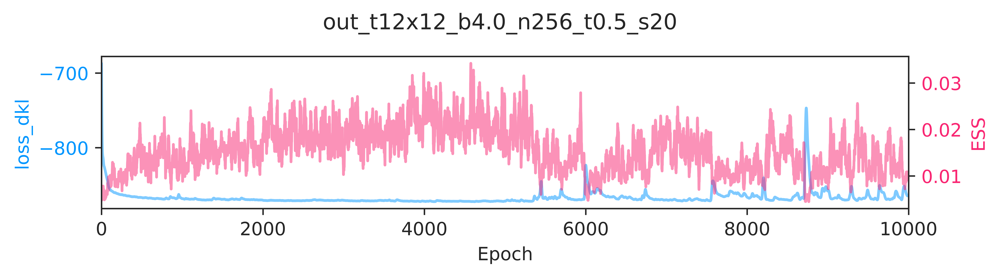

In [9]:
import matplotlib as mpl
from fthmc.config import TrainConfig

# (EXACT) action(2) = 0.69777477

from fthmc.train import train
train_config = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 1000,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [12, 12],
    'kernel_size': 3,
    'batch_size': 256,
    'print_freq': 50,
    'plot_freq': 50,
})

mpl.rcParams['text.usetex'] = False

train_outputs = train(param,
                      train_config,
                      pre_model=None,
                      logger=logger,
                      figsize=(7.5, 2))

pre_flow_plots = train_outputs['plots']
pre_flow_history = train_outputs['history']
flow_act = train_outputs['action']

pre_flow_model = train_outputs['model']
pre_flow_optimizer = train_outputs['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step = train_config.n_era * train_config.n_epoch

outfile = os.path.join(MODEL_DIR, 'pre_flow_model', TSTAMP, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step,
    outfile=outfile,
    model=train_outputs['model']['layers'],
    optimizer=pre_flow_optimizer,
    history=train_outputs['history'],
    overwrite=True,
)

#dq = (qnew - qold) ** 2
#avg = dq[-10:, :]

plots = train_outputs['plots']
outdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', TSTAMP)

save_live_plots(plots, outdir)

TORCH DEVICE: cuda


[19:03:26]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n
            256_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650

[19:03:26]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n
            256_t0.5_s20/metrics/training/pre_flow_model/2021-05-25-1650

[19:03:26]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n25
            6_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/step.pdf

[19:03:28]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n25
            6_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/dt.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n25
            6_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/loss.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n25
            6_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/q.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n25
            6_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/dq.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n25
            6_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/ess.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n25
            6_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/plaq.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n25
            6_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/loss_dkl.pdf

[19:03:29]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n25
            6_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/logp.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n25
            6_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/logq.pdf

[19:03:29]  Saving train_metrics to /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4
            .0_n256_t0.5_s20/metrics/training/pre_flow_model/2021-05-25-1650/train_metrics.z.

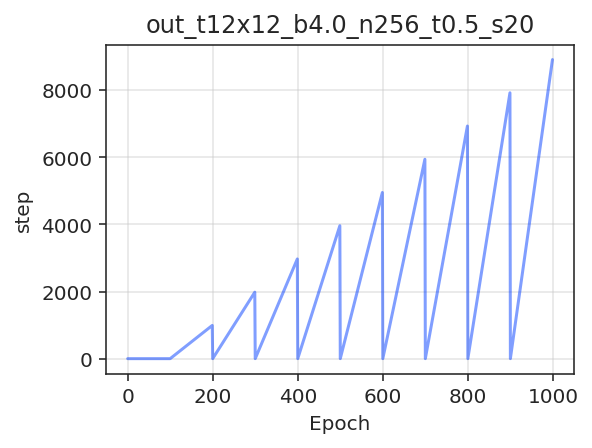

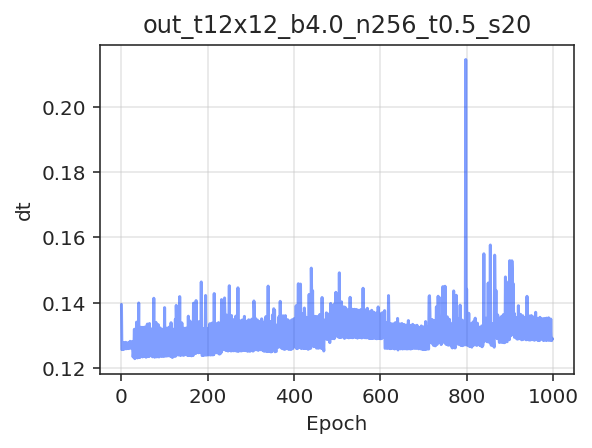

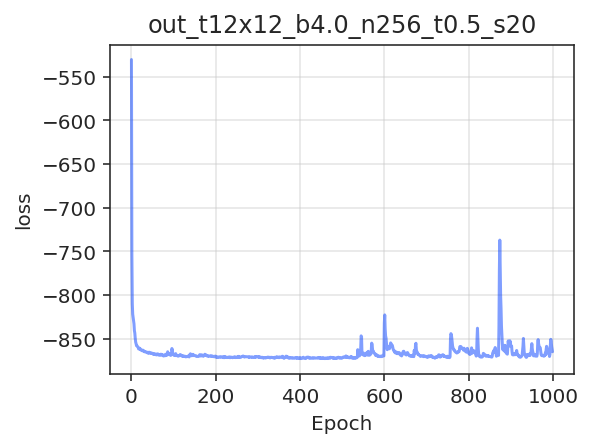

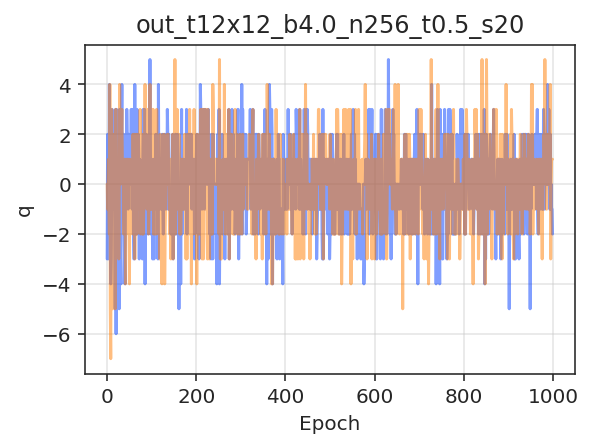

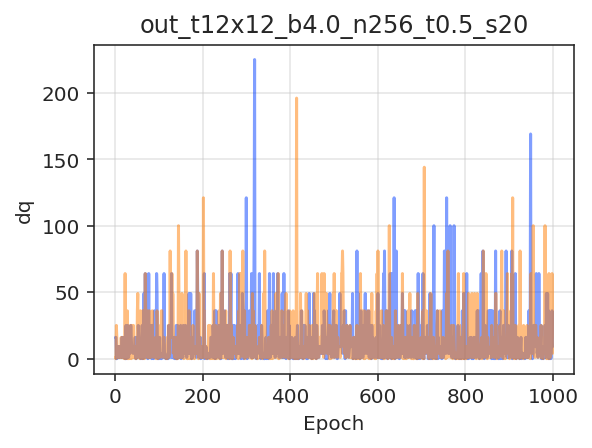

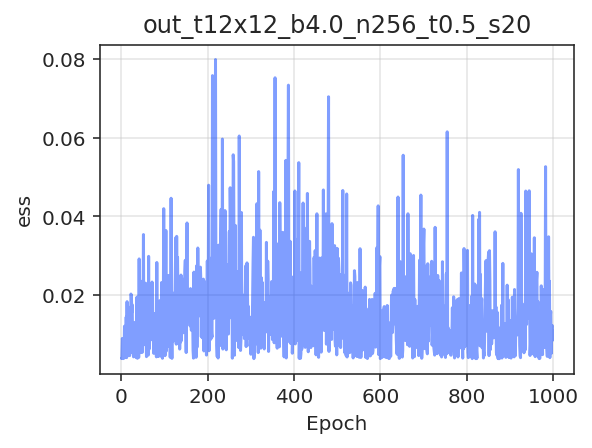

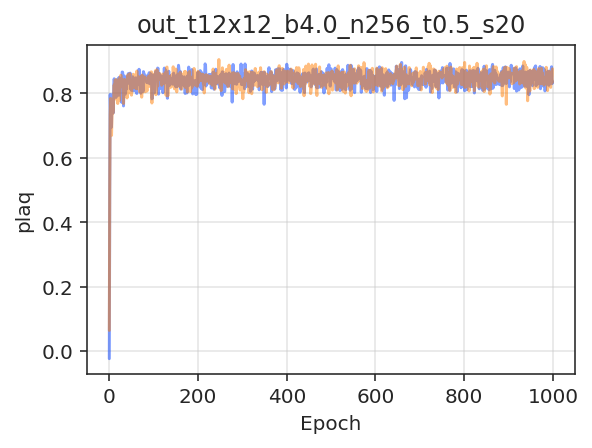

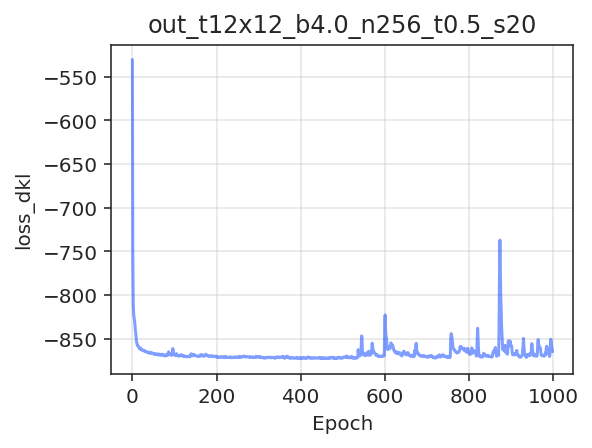

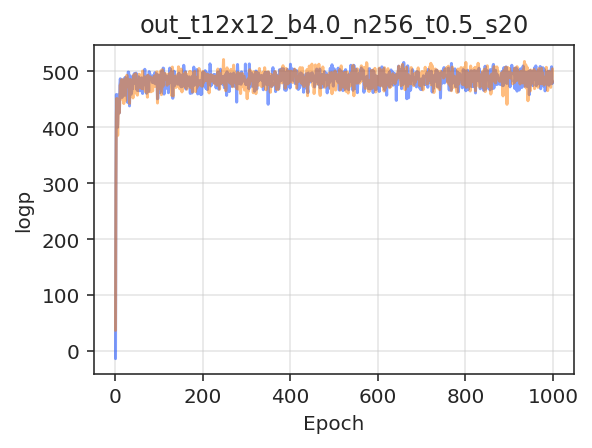

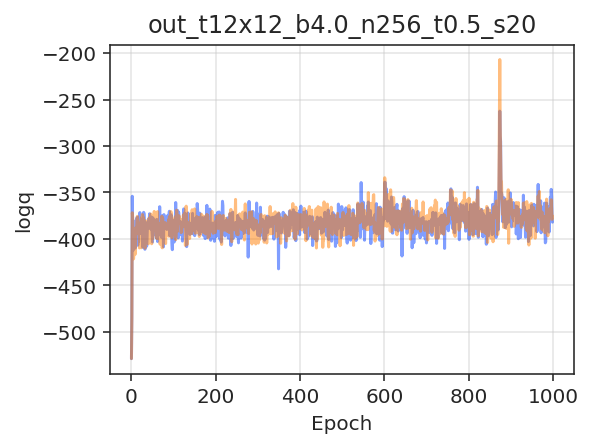

In [10]:
from fthmc.utils.plot_helpers import plot_history

tstamp = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', TSTAMP)
if os.path.isdir(pdir):
    pdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', tstamp)
    
mdir = os.path.join(METRICS_DIR, 'training', 'pre_flow_model', TSTAMP)
if os.path.isdir(mdir):
    mdir = os.path.join(METRICS_DIR, 'training', 'pre_flow_model', tstamp)

io.check_else_make_dir(pdir)
io.check_else_make_dir(mdir)

plot_history(history=train_outputs['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir, alpha=0.5)

mfile = os.path.join(mdir, 'train_metrics.z')
io.save_history(train_outputs['history'], mfile, name='train_metrics')

[19:05:19]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n
            256_t0.5_s20/plots/inference/pre_flow_model/2021-05-25-1650

[19:05:20]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n
            256_t0.5_s20/metrics/inference/pre_flow_model/2021-05-25-1650

[19:05:20]  Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_
            n256_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/ess_190520.pdf

[19:05:20]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n25
            6_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/ess_190520.pdf

[19:05:20]  Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_
            n256_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/q_190520.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n25
            6_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/q_190520.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n25
            6_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/dqsq.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n25
            6_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/dkl.pdf

[19:05:20]  Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_
            n256_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/logq_190520.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n25
            6_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/logq_190520.pdf

[19:05:20]  Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_
            n256_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/logp_190520.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n25
            6_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/logp_190520.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0_n25
            6_t0.5_s20/plots/training/pre_flow_model/2021-05-25-1650/accepted.pdf

[19:05:20]  Saving inference_metrics to /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x1
            2_b4.0_n256_t0.5_s20/metrics/inference/pre_flow_model/2021-05-25-1650/inference_m
            etrics.z.

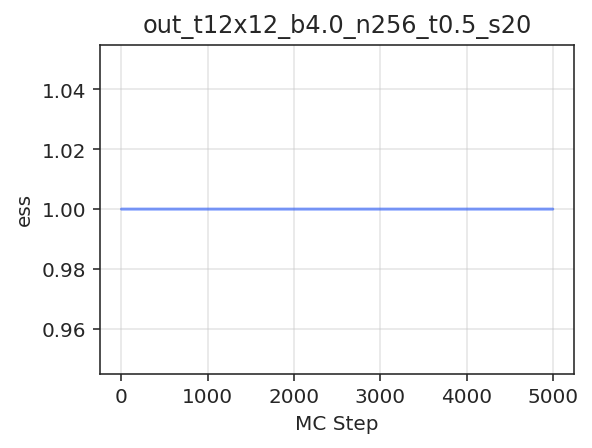

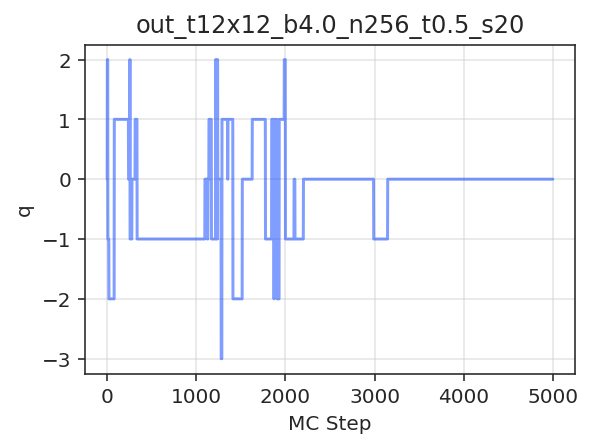

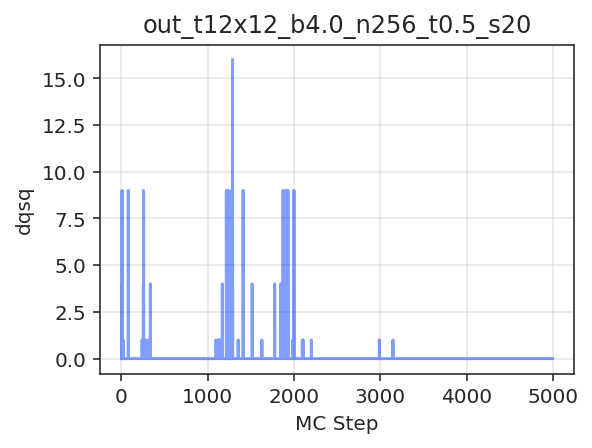

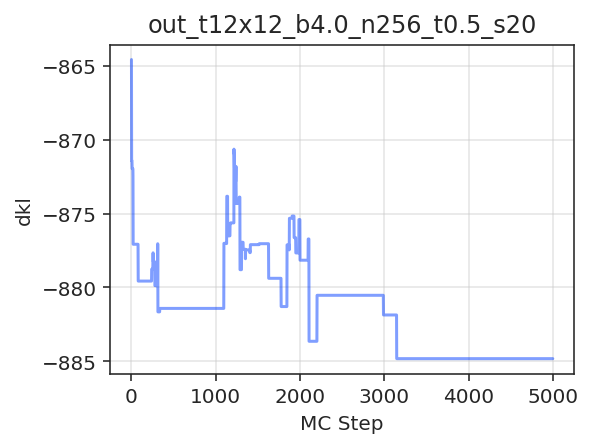

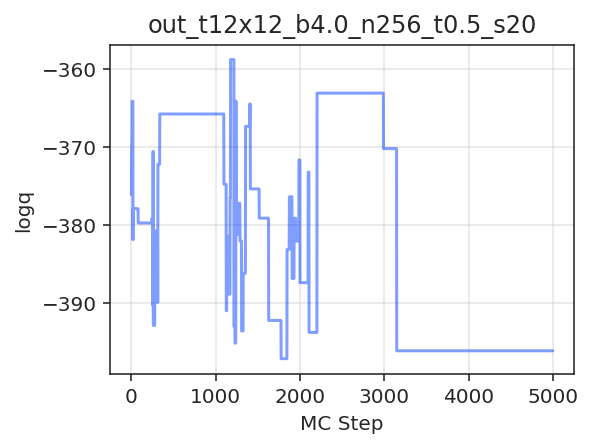

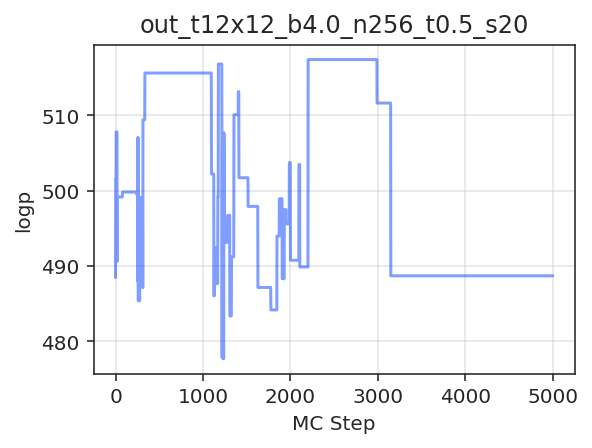

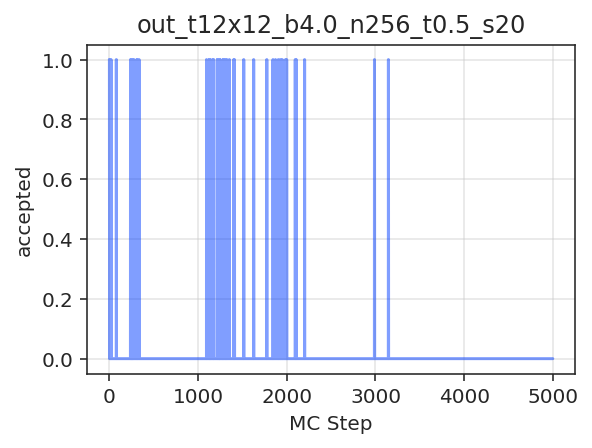

In [11]:
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed


history = make_mcmc_ensemble(model=train_outputs['model'],
                             action_fn=train_outputs['action'],
                             batch_size=train_config.batch_size,
                             num_samples=5000)

pdir = os.path.join(PLOTS_DIR, 'inference', 'pre_flow_model', TSTAMP)
if os.path.isdir(pdir):
    pdir = os.path.join(PLOTS_DIR, 'inference', 'pre_flow_model', tstamp)
    
mdir = os.path.join(METRICS_DIR, 'inference', 'pre_flow_model', TSTAMP)
if os.path.isdir(mdir):
    mdir = os.path.join(METRICS_DIR, 'inference', 'pre_flow_model', tstamp)
    
io.check_else_make_dir(pdir)
io.check_else_make_dir(mdir)

plot_history(history=history,
             param=param, skip=['epoch', 'x'],
             num_chains=2, therm_frac=0.0,#, thin=10,
             xlabel='MC Step', outdir=outdir, alpha=0.5)

mfile = os.path.join(mdir, 'inference_metrics.z')

io.save_history(history, mfile, name='inference_metrics')

In [10]:
np.mean(history['accepted'])

0.005

In [14]:
from fthmc.utils.layers import make_net_from_layers, get_nets

param16 = {
    'L': 16,
    'tau': 0.5,
    'nrun': 5,
    'beta': 4.0,
    'nstep': 20,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
}

param16 = Param(**param16)
logger.log(repr(param16))

flow16 = make_net_from_layers(lattice_shape=tuple(param16.lat),
                              nets=get_nets(pre_flow_model['layers']))

[16:15:30]  Param:                                                                                                                                                                                                                                              
            ----------------                                                                                                                                                                                                                                    
            beta=4.0                                                                                                                                                                                                                                            
            L=16                                                                                                                                                                                                                                                
            tau=0.5                                                                                                                                                                                                                                             
            nstep=20                                                                                                                                                                                                                                            
            ntraj=256                                                                                                                                                                                                                                           
            nrun=5                                                                                                                                                                                                                                              
            nprint=50                                                                                                                                                                                                                                           
            seed=1331                                                                                                                                                                                                                                           
            randinit=False                                                                                                                                                                                                                                      
            nth=2                                                                                                                                                                                                                                               
            nth_interop=2                                                                                                                                                                                                                                       
            lat=[16, 16]                                                                                                                                                                                                                                        
            nd=2                                                                                                                                                                                                                                                
            shape=[2, 16, 16]                                                                                                                    

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform

prior16 = MultivariateUniform(torch.zeros((2, *param16.lat)),
                              2. * PI * torch.ones(tuple(param16.lat)))

model16 = {'layers': flow16, 'prior': prior16}

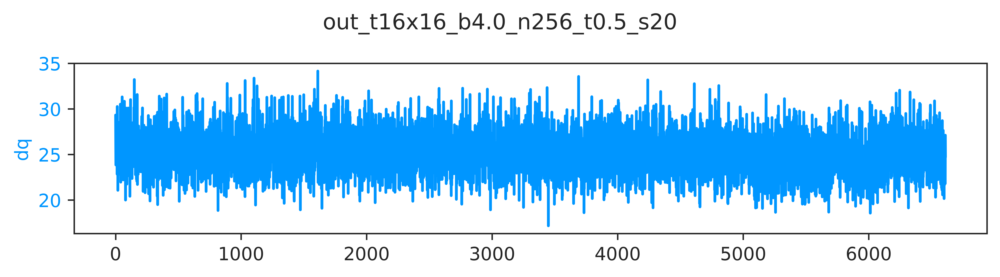

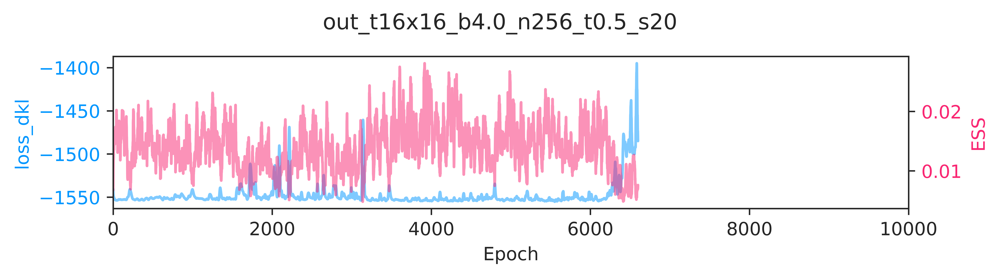

[16:15:52]  ---------------------------------------                                                                                                                                                                                                             
            ERA=0, last took: 0 min 0 s                                                                                                                                                                                                                         
            ---------------------------------------

[16:15:59]  epoch=47.000 step=0.000 dt=0.129 loss=-1553.45 dq=25.3227 ess=0.0144519 plaq=0.850755 loss_dkl=-1553.45 logp=871.173 logq=-682.272

[16:16:07]  epoch=97.000 step=0.000 dt=0.144 loss=-1552.14 dq=27.4523 ess=0.0106386 plaq=0.849109 loss_dkl=-1552.14 logp=869.487 logq=-682.652

[16:16:09]  ---------------------------------------                                                                                                                                                                                                             
            ERA=1, last took: 0 min 16.43 s                                                                                                                                                                                                                     
            ---------------------------------------

[16:16:15]  epoch=47.000 step=47.000 dt=0.126 loss=-1552.68 dq=28.7578 ess=0.0112219 plaq=0.853388 loss_dkl=-1552.68 logp=873.869 logq=-678.814

[16:16:23]  epoch=97.000 step=97.000 dt=0.127 loss=-1549.91 dq=25.6875 ess=0.0110754 plaq=0.854765 loss_dkl=-1549.91 logp=875.28 logq=-674.629

[16:16:25]  ---------------------------------------                                                                                                                                                                                                             
            ERA=2, last took: 0 min 16.19 s                                                                                                                                                                                                                     
            ---------------------------------------

[16:16:31]  epoch=47.000 step=94.000 dt=0.126 loss=-1550.72 dq=26.3805 ess=0.0129748 plaq=0.849886 loss_dkl=-1550.72 logp=870.284 logq=-680.432

[16:16:39]  epoch=97.000 step=194.000 dt=0.126 loss=-1552.59 dq=25.9828 ess=0.0140135 plaq=0.852248 loss_dkl=-1552.59 logp=872.702 logq=-679.883

[16:16:41]  ---------------------------------------                                                                                                                                                                                                             
            ERA=3, last took: 0 min 16.17 s                                                                                                                                                                                                                     
            ---------------------------------------

[16:16:47]  epoch=47.000 step=141.000 dt=0.129 loss=-1553.17 dq=28.207 ess=0.0133711 plaq=0.851992 loss_dkl=-1553.17 logp=872.44 logq=-680.725

[16:16:56]  epoch=97.000 step=291.000 dt=0.126 loss=-1553.58 dq=24.2758 ess=0.0106292 plaq=0.855668 loss_dkl=-1553.58 logp=876.204 logq=-677.371

[16:16:57]  ---------------------------------------                                                                                                                                                                                                             
            ERA=4, last took: 0 min 16.41 s                                                                                                                                                                                                                     
            ---------------------------------------

[16:17:04]  epoch=47.000 step=188.000 dt=0.127 loss=-1552.76 dq=26.4 ess=0.0186119 plaq=0.855904 loss_dkl=-1552.76 logp=876.446 logq=-676.315

[16:17:12]  epoch=97.000 step=388.000 dt=0.128 loss=-1551.75 dq=26.3531 ess=0.0178895 plaq=0.851576 loss_dkl=-1551.75 logp=872.014 logq=-679.736

[16:17:14]  ---------------------------------------                                                                                                                                                                                                             
            ERA=5, last took: 0 min 16.28 s                                                                                                                                                                                                                     
            ---------------------------------------

[16:17:20]  epoch=47.000 step=235.000 dt=0.129 loss=-1550.33 dq=25.093 ess=0.0123393 plaq=0.852681 loss_dkl=-1550.33 logp=873.145 logq=-677.188

[16:17:28]  epoch=97.000 step=485.000 dt=0.128 loss=-1549.28 dq=25.5961 ess=0.00868283 plaq=0.854343 loss_dkl=-1549.28 logp=874.847 logq=-674.434

[16:17:30]  ---------------------------------------                                                                                                                                                                                                             
            ERA=6, last took: 0 min 16.39 s                                                                                                                                                                                                                     
            ---------------------------------------

[16:17:36]  epoch=47.000 step=282.000 dt=0.128 loss=-1549.38 dq=26.3117 ess=0.014337 plaq=0.851629 loss_dkl=-1549.38 logp=872.068 logq=-677.315

[16:17:45]  epoch=97.000 step=582.000 dt=0.129 loss=-1551.53 dq=25.8242 ess=0.0147563 plaq=0.853268 loss_dkl=-1551.53 logp=873.747 logq=-677.781

[16:17:47]  ---------------------------------------                                                                                                                                                                                                             
            ERA=7, last took: 0 min 16.8 s                                                                                                                                                                                                                      
            ---------------------------------------

[16:17:53]  epoch=47.000 step=329.000 dt=0.129 loss=-1551.09 dq=24.7453 ess=0.0274764 plaq=0.854493 loss_dkl=-1551.09 logp=875.001 logq=-676.094

[16:18:02]  epoch=97.000 step=679.000 dt=0.128 loss=-1548.47 dq=24.7586 ess=0.00893317 plaq=0.853526 loss_dkl=-1548.47 logp=874.01 logq=-674.459

[16:18:03]  ---------------------------------------                                                                                                                                                                                                             
            ERA=8, last took: 0 min 16.5 s                                                                                                                                                                                                                      
            ---------------------------------------

[16:18:10]  epoch=47.000 step=376.000 dt=0.129 loss=-1550.66 dq=24.218 ess=0.00852619 plaq=0.854614 loss_dkl=-1550.66 logp=875.125 logq=-675.539

[16:18:18]  epoch=97.000 step=776.000 dt=0.128 loss=-1550.14 dq=25.718 ess=0.0179506 plaq=0.850956 loss_dkl=-1550.14 logp=871.379 logq=-678.76

[16:18:20]  ---------------------------------------                                                                                                                                                                                                             
            ERA=9, last took: 0 min 16.48 s                                                                                                                                                                                                                     
            ---------------------------------------

[16:18:26]  epoch=47.000 step=423.000 dt=0.128 loss=-1551.4 dq=24.3508 ess=0.0162313 plaq=0.857383 loss_dkl=-1551.4 logp=877.961 logq=-673.435

[16:18:34]  epoch=97.000 step=873.000 dt=0.128 loss=-1542.12 dq=24.7164 ess=0.00758245 plaq=0.856867 loss_dkl=-1542.12 logp=877.431 logq=-664.69

[16:18:36]  ---------------------------------------                                                                                                                                                                                                             
            ERA=10, last took: 0 min 16.42 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:18:43]  epoch=47.000 step=470.000 dt=0.128 loss=-1550.88 dq=25.9773 ess=0.00995573 plaq=0.853536 loss_dkl=-1550.88 logp=874.02 logq=-676.857

[16:18:51]  epoch=97.000 step=970.000 dt=0.128 loss=-1551.57 dq=26.2344 ess=0.0161134 plaq=0.852919 loss_dkl=-1551.57 logp=873.389 logq=-678.177

[16:18:53]  ---------------------------------------                                                                                                                                                                                                             
            ERA=11, last took: 0 min 16.45 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:18:59]  epoch=47.000 step=517.000 dt=0.128 loss=-1552.7 dq=26.9891 ess=0.0235645 plaq=0.854364 loss_dkl=-1552.7 logp=874.869 logq=-677.833

[16:19:08]  epoch=97.000 step=1067.000 dt=0.130 loss=-1552.83 dq=24.3953 ess=0.015482 plaq=0.852777 loss_dkl=-1552.83 logp=873.243 logq=-679.582

[16:19:09]  ---------------------------------------                                                                                                                                                                                                             
            ERA=12, last took: 0 min 16.76 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:19:16]  epoch=47.000 step=564.000 dt=0.141 loss=-1551.22 dq=25.7445 ess=0.0194841 plaq=0.854451 loss_dkl=-1551.22 logp=874.958 logq=-676.263

[16:19:25]  epoch=97.000 step=1164.000 dt=0.137 loss=-1552.82 dq=24.868 ess=0.0193186 plaq=0.85279 loss_dkl=-1552.82 logp=873.257 logq=-679.561

[16:19:26]  ---------------------------------------                                                                                                                                                                                                             
            ERA=13, last took: 0 min 16.95 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:19:33]  epoch=47.000 step=611.000 dt=0.131 loss=-1541.09 dq=24.3391 ess=0.0131585 plaq=0.853934 loss_dkl=-1541.09 logp=874.428 logq=-666.667

[16:19:41]  epoch=97.000 step=1261.000 dt=0.126 loss=-1549.64 dq=26.0844 ess=0.0149213 plaq=0.852332 loss_dkl=-1549.64 logp=872.788 logq=-676.852

[16:19:43]  ---------------------------------------                                                                                                                                                                                                             
            ERA=14, last took: 0 min 16.82 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:19:50]  epoch=47.000 step=658.000 dt=0.127 loss=-1551.72 dq=26.1031 ess=0.0114639 plaq=0.851613 loss_dkl=-1551.72 logp=872.052 logq=-679.664

[16:19:58]  epoch=97.000 step=1358.000 dt=0.129 loss=-1551.85 dq=27.9891 ess=0.0131395 plaq=0.85533 loss_dkl=-1551.85 logp=875.858 logq=-675.99

[16:20:00]  ---------------------------------------                                                                                                                                                                                                             
            ERA=15, last took: 0 min 16.59 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:20:06]  epoch=47.000 step=705.000 dt=0.127 loss=-1552.59 dq=26.8234 ess=0.018415 plaq=0.851279 loss_dkl=-1552.59 logp=871.71 logq=-680.877

[16:20:15]  epoch=97.000 step=1455.000 dt=0.127 loss=-1538.88 dq=27.375 ess=0.00593136 plaq=0.850423 loss_dkl=-1538.88 logp=870.833 logq=-668.051

[16:20:16]  ---------------------------------------                                                                                                                                                                                                             
            ERA=16, last took: 0 min 16.62 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:20:23]  epoch=47.000 step=752.000 dt=0.131 loss=-1544.6 dq=26.3211 ess=0.0106585 plaq=0.856522 loss_dkl=-1544.6 logp=877.079 logq=-667.517

[16:20:31]  epoch=97.000 step=1552.000 dt=0.129 loss=-1552.51 dq=23.4375 ess=0.0142998 plaq=0.853199 loss_dkl=-1552.51 logp=873.676 logq=-678.833

[16:20:33]  ---------------------------------------                                                                                                                                                                                                             
            ERA=17, last took: 0 min 16.75 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:20:40]  epoch=47.000 step=799.000 dt=0.126 loss=-1535.18 dq=26.0383 ess=0.00520922 plaq=0.850832 loss_dkl=-1535.18 logp=871.252 logq=-663.924

[16:20:48]  epoch=97.000 step=1649.000 dt=0.130 loss=-1527.23 dq=25.2594 ess=0.0105932 plaq=0.855285 loss_dkl=-1527.23 logp=875.812 logq=-651.419

[16:20:50]  ---------------------------------------                                                                                                                                                                                                             
            ERA=18, last took: 0 min 16.84 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:20:56]  epoch=47.000 step=846.000 dt=0.129 loss=-1550.55 dq=26.7687 ess=0.0211977 plaq=0.852971 loss_dkl=-1550.55 logp=873.443 logq=-677.109

[16:21:05]  epoch=97.000 step=1746.000 dt=0.128 loss=-1548.16 dq=24.3828 ess=0.0177373 plaq=0.854221 loss_dkl=-1548.16 logp=874.722 logq=-673.439

[16:21:07]  ---------------------------------------                                                                                                                                                                                                             
            ERA=19, last took: 0 min 16.72 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:21:13]  epoch=47.000 step=893.000 dt=0.129 loss=-1547.86 dq=25.282 ess=0.00891624 plaq=0.856461 loss_dkl=-1547.86 logp=877.016 logq=-670.844

[16:21:22]  epoch=97.000 step=1843.000 dt=0.135 loss=-1545.67 dq=25.7523 ess=0.0110269 plaq=0.854734 loss_dkl=-1545.67 logp=875.247 logq=-670.427

[16:21:24]  ---------------------------------------                                                                                                                                                                                                             
            ERA=20, last took: 0 min 16.9 s                                                                                                                                                                                                                     
            ---------------------------------------

[16:21:30]  epoch=47.000 step=940.000 dt=0.129 loss=-1508.68 dq=25.0461 ess=0.00917944 plaq=0.855091 loss_dkl=-1508.68 logp=875.613 logq=-633.071

[16:21:39]  epoch=97.000 step=1940.000 dt=0.137 loss=-1478.63 dq=24.7234 ess=0.00608388 plaq=0.851547 loss_dkl=-1478.63 logp=871.984 logq=-606.649

[16:21:41]  ---------------------------------------                                                                                                                                                                                                             
            ERA=21, last took: 0 min 17 s                                                                                                                                                                                                                       
            ---------------------------------------

[16:21:47]  epoch=47.000 step=987.000 dt=0.128 loss=-1548.81 dq=25.9688 ess=0.00860783 plaq=0.85423 loss_dkl=-1548.81 logp=874.731 logq=-674.078

[16:21:56]  epoch=97.000 step=2037.000 dt=0.131 loss=-1549.48 dq=25.3242 ess=0.00875649 plaq=0.854634 loss_dkl=-1549.48 logp=875.145 logq=-674.335

[16:21:58]  ---------------------------------------                                                                                                                                                                                                             
            ERA=22, last took: 0 min 17.08 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:22:04]  epoch=47.000 step=1034.000 dt=0.134 loss=-1546.99 dq=26.6086 ess=0.0130185 plaq=0.854178 loss_dkl=-1546.99 logp=874.679 logq=-672.308

[16:22:13]  epoch=97.000 step=2134.000 dt=0.129 loss=-1551.14 dq=25.9672 ess=0.0131107 plaq=0.854184 loss_dkl=-1551.14 logp=874.684 logq=-676.458

[16:22:15]  ---------------------------------------                                                                                                                                                                                                             
            ERA=23, last took: 0 min 16.91 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:22:21]  epoch=47.000 step=1081.000 dt=0.128 loss=-1553.39 dq=24.6656 ess=0.00639764 plaq=0.853342 loss_dkl=-1553.39 logp=873.823 logq=-679.569

[16:22:29]  epoch=97.000 step=2231.000 dt=0.128 loss=-1552.4 dq=25.0273 ess=0.0217459 plaq=0.854593 loss_dkl=-1552.4 logp=875.103 logq=-677.296

[16:22:31]  ---------------------------------------                                                                                                                                                                                                             
            ERA=24, last took: 0 min 16.74 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:22:38]  epoch=47.000 step=1128.000 dt=0.130 loss=-1551.04 dq=23.6977 ess=0.010744 plaq=0.853431 loss_dkl=-1551.04 logp=873.913 logq=-677.122

[16:22:46]  epoch=97.000 step=2328.000 dt=0.130 loss=-1550.21 dq=26.0914 ess=0.0155447 plaq=0.853586 loss_dkl=-1550.21 logp=874.072 logq=-676.141

[16:22:48]  ---------------------------------------                                                                                                                                                                                                             
            ERA=25, last took: 0 min 16.93 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:22:55]  epoch=47.000 step=1175.000 dt=0.130 loss=-1552.93 dq=23.0352 ess=0.0198535 plaq=0.852987 loss_dkl=-1552.93 logp=873.459 logq=-679.466

[16:23:03]  epoch=97.000 step=2425.000 dt=0.129 loss=-1553.16 dq=26.093 ess=0.0169634 plaq=0.853563 loss_dkl=-1553.16 logp=874.048 logq=-679.108

[16:23:05]  ---------------------------------------                                                                                                                                                                                                             
            ERA=26, last took: 0 min 16.92 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:23:12]  epoch=47.000 step=1222.000 dt=0.130 loss=-1530.95 dq=26.1875 ess=0.00742847 plaq=0.854402 loss_dkl=-1530.95 logp=874.907 logq=-656.042

[16:23:20]  epoch=97.000 step=2522.000 dt=0.129 loss=-1552.14 dq=24.9969 ess=0.0232462 plaq=0.854356 loss_dkl=-1552.14 logp=874.861 logq=-677.279

[16:23:22]  ---------------------------------------                                                                                                                                                                                                             
            ERA=27, last took: 0 min 16.91 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:23:29]  epoch=47.000 step=1269.000 dt=0.128 loss=-1549.51 dq=24.375 ess=0.00892912 plaq=0.85183 loss_dkl=-1549.51 logp=872.274 logq=-677.232

[16:23:37]  epoch=97.000 step=2619.000 dt=0.128 loss=-1539.92 dq=24.0289 ess=0.00906847 plaq=0.854453 loss_dkl=-1539.92 logp=874.96 logq=-664.964

[16:23:39]  ---------------------------------------                                                                                                                                                                                                             
            ERA=28, last took: 0 min 17.24 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:23:46]  epoch=47.000 step=1316.000 dt=0.129 loss=-1551.45 dq=25.5438 ess=0.00875742 plaq=0.852981 loss_dkl=-1551.45 logp=873.452 logq=-678.002

[16:23:54]  epoch=97.000 step=2716.000 dt=0.128 loss=-1551.08 dq=26.3516 ess=0.00850264 plaq=0.853671 loss_dkl=-1551.08 logp=874.159 logq=-676.917

[16:23:56]  ---------------------------------------                                                                                                                                                                                                             
            ERA=29, last took: 0 min 16.99 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:24:03]  epoch=47.000 step=1363.000 dt=0.129 loss=-1552.28 dq=24.5766 ess=0.0145383 plaq=0.855801 loss_dkl=-1552.28 logp=876.34 logq=-675.943

[16:24:12]  epoch=97.000 step=2813.000 dt=0.131 loss=-1538.86 dq=25.5438 ess=0.00810698 plaq=0.854087 loss_dkl=-1538.86 logp=874.585 logq=-664.277

[16:24:14]  ---------------------------------------                                                                                                                                                                                                             
            ERA=30, last took: 0 min 17.25 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:24:20]  epoch=47.000 step=1410.000 dt=0.129 loss=-1552.66 dq=26.2711 ess=0.0222391 plaq=0.852529 loss_dkl=-1552.66 logp=872.99 logq=-679.673

[16:24:29]  epoch=97.000 step=2910.000 dt=0.130 loss=-1549.31 dq=24.8859 ess=0.0124184 plaq=0.856611 loss_dkl=-1549.31 logp=877.169 logq=-672.139

[16:24:31]  ---------------------------------------                                                                                                                                                                                                             
            ERA=31, last took: 0 min 17.02 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:24:37]  epoch=47.000 step=1457.000 dt=0.128 loss=-1452.93 dq=24.2891 ess=0.00451329 plaq=0.854492 loss_dkl=-1452.93 logp=875 logq=-577.925

[16:24:46]  epoch=97.000 step=3007.000 dt=0.128 loss=-1551.73 dq=25.2336 ess=0.0139816 plaq=0.85158 loss_dkl=-1551.73 logp=872.018 logq=-679.711

[16:24:47]  ---------------------------------------                                                                                                                                                                                                             
            ERA=32, last took: 0 min 16.93 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:24:54]  epoch=47.000 step=1504.000 dt=0.134 loss=-1554.17 dq=25.0672 ess=0.0139159 plaq=0.855155 loss_dkl=-1554.17 logp=875.679 logq=-678.493

[16:25:03]  epoch=97.000 step=3104.000 dt=0.128 loss=-1553.41 dq=25.1141 ess=0.0158181 plaq=0.85479 loss_dkl=-1553.41 logp=875.305 logq=-678.107

[16:25:04]  ---------------------------------------                                                                                                                                                                                                             
            ERA=33, last took: 0 min 16.98 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:25:11]  epoch=47.000 step=1551.000 dt=0.131 loss=-1553.65 dq=24.8859 ess=0.0192593 plaq=0.856207 loss_dkl=-1553.65 logp=876.756 logq=-676.892

[16:25:19]  epoch=97.000 step=3201.000 dt=0.129 loss=-1552.41 dq=24.9344 ess=0.012213 plaq=0.856092 loss_dkl=-1552.41 logp=876.638 logq=-675.774

[16:25:21]  ---------------------------------------                                                                                                                                                                                                             
            ERA=34, last took: 0 min 17 s                                                                                                                                                                                                                       
            ---------------------------------------

[16:25:28]  epoch=47.000 step=1598.000 dt=0.128 loss=-1553.45 dq=24.1219 ess=0.016021 plaq=0.853056 loss_dkl=-1553.45 logp=873.529 logq=-679.916

[16:25:36]  epoch=97.000 step=3298.000 dt=0.130 loss=-1548.6 dq=23.457 ess=0.00959212 plaq=0.853308 loss_dkl=-1548.6 logp=873.787 logq=-674.814

[16:25:38]  ---------------------------------------                                                                                                                                                                                                             
            ERA=35, last took: 0 min 16.91 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:25:45]  epoch=47.000 step=1645.000 dt=0.129 loss=-1553.28 dq=25.0227 ess=0.0167027 plaq=0.852658 loss_dkl=-1553.28 logp=873.122 logq=-680.161

[16:25:53]  epoch=97.000 step=3395.000 dt=0.129 loss=-1552.98 dq=26.2922 ess=0.00674024 plaq=0.855433 loss_dkl=-1552.98 logp=875.963 logq=-677.018

[16:25:55]  ---------------------------------------                                                                                                                                                                                                             
            ERA=36, last took: 0 min 16.86 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:26:02]  epoch=47.000 step=1692.000 dt=0.128 loss=-1553.3 dq=24.0789 ess=0.0166075 plaq=0.853232 loss_dkl=-1553.3 logp=873.709 logq=-679.587

[16:26:10]  epoch=97.000 step=3492.000 dt=0.128 loss=-1550.42 dq=24.2461 ess=0.0168296 plaq=0.854506 loss_dkl=-1550.42 logp=875.014 logq=-675.407

[16:26:12]  ---------------------------------------                                                                                                                                                                                                             
            ERA=37, last took: 0 min 16.84 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:26:19]  epoch=47.000 step=1739.000 dt=0.129 loss=-1554.72 dq=25.2734 ess=0.0163358 plaq=0.854616 loss_dkl=-1554.72 logp=875.126 logq=-679.595

[16:26:27]  epoch=97.000 step=3589.000 dt=0.130 loss=-1553.19 dq=24.4258 ess=0.0131739 plaq=0.853536 loss_dkl=-1553.19 logp=874.021 logq=-679.172

[16:26:29]  ---------------------------------------                                                                                                                                                                                                             
            ERA=38, last took: 0 min 17.19 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:26:36]  epoch=47.000 step=1786.000 dt=0.129 loss=-1550.2 dq=25.8961 ess=0.0138976 plaq=0.854905 loss_dkl=-1550.2 logp=875.422 logq=-674.777

[16:26:44]  epoch=97.000 step=3686.000 dt=0.131 loss=-1554.61 dq=23.7719 ess=0.00981131 plaq=0.853333 loss_dkl=-1554.61 logp=873.813 logq=-680.795

[16:26:46]  ---------------------------------------                                                                                                                                                                                                             
            ERA=39, last took: 0 min 17.1 s                                                                                                                                                                                                                     
            ---------------------------------------

[16:26:53]  epoch=47.000 step=1833.000 dt=0.130 loss=-1551.81 dq=23.343 ess=0.0142342 plaq=0.851391 loss_dkl=-1551.81 logp=871.825 logq=-679.985

[16:27:02]  epoch=97.000 step=3783.000 dt=0.130 loss=-1553.2 dq=24.45 ess=0.0145256 plaq=0.853913 loss_dkl=-1553.2 logp=874.407 logq=-678.792

[16:27:03]  ---------------------------------------                                                                                                                                                                                                             
            ERA=40, last took: 0 min 17.09 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:27:10]  epoch=47.000 step=1880.000 dt=0.131 loss=-1550.47 dq=24.9414 ess=0.0127554 plaq=0.84838 loss_dkl=-1550.47 logp=868.741 logq=-681.724

[16:27:19]  epoch=97.000 step=3880.000 dt=0.130 loss=-1553.96 dq=26.1688 ess=0.0193707 plaq=0.85537 loss_dkl=-1553.96 logp=875.899 logq=-678.06

[16:27:20]  ---------------------------------------                                                                                                                                                                                                             
            ERA=41, last took: 0 min 16.97 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:27:27]  epoch=47.000 step=1927.000 dt=0.131 loss=-1551.46 dq=24.8305 ess=0.014637 plaq=0.853583 loss_dkl=-1551.46 logp=874.069 logq=-677.391

[16:27:36]  epoch=97.000 step=3977.000 dt=0.130 loss=-1549.22 dq=23.6641 ess=0.0137664 plaq=0.855459 loss_dkl=-1549.22 logp=875.99 logq=-673.226

[16:27:37]  ---------------------------------------                                                                                                                                                                                                             
            ERA=42, last took: 0 min 17.1 s                                                                                                                                                                                                                     
            ---------------------------------------

[16:27:44]  epoch=47.000 step=1974.000 dt=0.129 loss=-1554.49 dq=25.3445 ess=0.0312373 plaq=0.854622 loss_dkl=-1554.49 logp=875.133 logq=-679.358

[16:27:53]  epoch=97.000 step=4074.000 dt=0.133 loss=-1549.48 dq=24.7141 ess=0.00782094 plaq=0.855415 loss_dkl=-1549.48 logp=875.945 logq=-673.536

[16:27:55]  ---------------------------------------                                                                                                                                                                                                             
            ERA=43, last took: 0 min 17.09 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:28:01]  epoch=47.000 step=2021.000 dt=0.130 loss=-1554.12 dq=25.7477 ess=0.0244526 plaq=0.855102 loss_dkl=-1554.12 logp=875.625 logq=-678.494

[16:28:10]  epoch=97.000 step=4171.000 dt=0.132 loss=-1554.19 dq=24.6016 ess=0.0182354 plaq=0.855456 loss_dkl=-1554.19 logp=875.987 logq=-678.203

[16:28:12]  ---------------------------------------                                                                                                                                                                                                             
            ERA=44, last took: 0 min 17.09 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:28:19]  epoch=47.000 step=2068.000 dt=0.131 loss=-1552.47 dq=25.1664 ess=0.0139944 plaq=0.85614 loss_dkl=-1552.47 logp=876.688 logq=-675.786

[16:28:27]  epoch=97.000 step=4268.000 dt=0.134 loss=-1551.98 dq=25.257 ess=0.0181754 plaq=0.854868 loss_dkl=-1551.98 logp=875.385 logq=-676.593

[16:28:29]  ---------------------------------------                                                                                                                                                                                                             
            ERA=45, last took: 0 min 17.49 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:28:36]  epoch=47.000 step=2115.000 dt=0.131 loss=-1551.6 dq=23.0938 ess=0.0132889 plaq=0.855433 loss_dkl=-1551.6 logp=875.963 logq=-675.635

[16:28:44]  epoch=97.000 step=4365.000 dt=0.133 loss=-1546.88 dq=25.3875 ess=0.0132773 plaq=0.856501 loss_dkl=-1546.88 logp=877.057 logq=-669.82

[16:28:46]  ---------------------------------------                                                                                                                                                                                                             
            ERA=46, last took: 0 min 17.18 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:28:53]  epoch=47.000 step=2162.000 dt=0.131 loss=-1551.91 dq=23.5375 ess=0.0148058 plaq=0.853512 loss_dkl=-1551.91 logp=873.996 logq=-677.911

[16:29:01]  epoch=97.000 step=4462.000 dt=0.130 loss=-1549.76 dq=24.4289 ess=0.0161551 plaq=0.855087 loss_dkl=-1549.76 logp=875.609 logq=-674.151

[16:29:03]  ---------------------------------------                                                                                                                                                                                                             
            ERA=47, last took: 0 min 17.07 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:29:10]  epoch=47.000 step=2209.000 dt=0.131 loss=-1551.83 dq=27.7734 ess=0.00910446 plaq=0.854585 loss_dkl=-1551.83 logp=875.096 logq=-676.735

[16:29:19]  epoch=97.000 step=4559.000 dt=0.131 loss=-1545.25 dq=26.2227 ess=0.0104873 plaq=0.847292 loss_dkl=-1545.25 logp=867.627 logq=-677.627

[16:29:21]  ---------------------------------------                                                                                                                                                                                                             
            ERA=48, last took: 0 min 17.17 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:29:27]  epoch=47.000 step=2256.000 dt=0.129 loss=-1552.7 dq=24.3789 ess=0.0207844 plaq=0.852025 loss_dkl=-1552.7 logp=872.474 logq=-680.23

[16:29:36]  epoch=97.000 step=4656.000 dt=0.129 loss=-1551.53 dq=24.7313 ess=0.0112031 plaq=0.855151 loss_dkl=-1551.53 logp=875.675 logq=-675.858

[16:29:38]  ---------------------------------------                                                                                                                                                                                                             
            ERA=49, last took: 0 min 17.03 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:29:44]  epoch=47.000 step=2303.000 dt=0.132 loss=-1552.22 dq=25.9789 ess=0.0165359 plaq=0.853206 loss_dkl=-1552.22 logp=873.683 logq=-678.533

[16:29:53]  epoch=97.000 step=4753.000 dt=0.129 loss=-1553.79 dq=26.3102 ess=0.0296624 plaq=0.853936 loss_dkl=-1553.79 logp=874.43 logq=-679.356

[16:29:55]  ---------------------------------------                                                                                                                                                                                                             
            ERA=50, last took: 0 min 17.19 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:30:02]  epoch=47.000 step=2350.000 dt=0.131 loss=-1553.45 dq=23.3617 ess=0.0189956 plaq=0.85533 loss_dkl=-1553.45 logp=875.857 logq=-677.592

[16:30:11]  epoch=97.000 step=4850.000 dt=0.129 loss=-1549.3 dq=23.0289 ess=0.0101822 plaq=0.856785 loss_dkl=-1549.3 logp=877.347 logq=-671.949

[16:30:13]  ---------------------------------------                                                                                                                                                                                                             
            ERA=51, last took: 0 min 17.83 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:30:19]  epoch=47.000 step=2397.000 dt=0.129 loss=-1552.55 dq=24.3703 ess=0.00970234 plaq=0.856556 loss_dkl=-1552.55 logp=877.113 logq=-675.442

[16:30:28]  epoch=97.000 step=4947.000 dt=0.130 loss=-1547.8 dq=25.0547 ess=0.0107102 plaq=0.85535 loss_dkl=-1547.8 logp=875.878 logq=-671.922

[16:30:30]  ---------------------------------------                                                                                                                                                                                                             
            ERA=52, last took: 0 min 17.26 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:30:37]  epoch=47.000 step=2444.000 dt=0.131 loss=-1553.24 dq=22.9664 ess=0.0175386 plaq=0.855505 loss_dkl=-1553.24 logp=876.037 logq=-677.207

[16:30:45]  epoch=97.000 step=5044.000 dt=0.131 loss=-1553.49 dq=25.3359 ess=0.0152776 plaq=0.854983 loss_dkl=-1553.49 logp=875.503 logq=-677.985

[16:30:47]  ---------------------------------------                                                                                                                                                                                                             
            ERA=53, last took: 0 min 17.35 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:30:54]  epoch=47.000 step=2491.000 dt=0.130 loss=-1551.63 dq=23.2078 ess=0.0217571 plaq=0.853771 loss_dkl=-1551.63 logp=874.261 logq=-677.371

[16:31:02]  epoch=97.000 step=5141.000 dt=0.130 loss=-1552.01 dq=25.2477 ess=0.00777679 plaq=0.85448 loss_dkl=-1552.01 logp=874.987 logq=-677.018

[16:31:04]  ---------------------------------------                                                                                                                                                                                                             
            ERA=54, last took: 0 min 17.19 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:31:11]  epoch=47.000 step=2538.000 dt=0.130 loss=-1554.37 dq=24.8219 ess=0.0295587 plaq=0.854507 loss_dkl=-1554.37 logp=875.016 logq=-679.358

[16:31:20]  epoch=97.000 step=5238.000 dt=0.129 loss=-1552.68 dq=22.5812 ess=0.0162614 plaq=0.855838 loss_dkl=-1552.68 logp=876.378 logq=-676.298

[16:31:22]  ---------------------------------------                                                                                                                                                                                                             
            ERA=55, last took: 0 min 17.24 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:31:28]  epoch=47.000 step=2585.000 dt=0.130 loss=-1553.07 dq=23.9453 ess=0.0246336 plaq=0.855327 loss_dkl=-1553.07 logp=875.854 logq=-677.211

[16:31:37]  epoch=97.000 step=5335.000 dt=0.131 loss=-1553.28 dq=25.1281 ess=0.0137511 plaq=0.854674 loss_dkl=-1553.28 logp=875.186 logq=-678.098

[16:31:39]  ---------------------------------------                                                                                                                                                                                                             
            ERA=56, last took: 0 min 17.34 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:31:46]  epoch=47.000 step=2632.000 dt=0.130 loss=-1553.16 dq=24.4742 ess=0.0208193 plaq=0.854558 loss_dkl=-1553.16 logp=875.068 logq=-678.095

[16:31:54]  epoch=97.000 step=5432.000 dt=0.131 loss=-1554.21 dq=24.2078 ess=0.0222256 plaq=0.855132 loss_dkl=-1554.21 logp=875.656 logq=-678.553

[16:31:56]  ---------------------------------------                                                                                                                                                                                                             
            ERA=57, last took: 0 min 17.37 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:32:03]  epoch=47.000 step=2679.000 dt=0.131 loss=-1551.26 dq=26.0195 ess=0.0147966 plaq=0.853961 loss_dkl=-1551.26 logp=874.456 logq=-676.802

[16:32:12]  epoch=97.000 step=5529.000 dt=0.133 loss=-1551.85 dq=25.0141 ess=0.0107676 plaq=0.855215 loss_dkl=-1551.85 logp=875.74 logq=-676.105

[16:32:14]  ---------------------------------------                                                                                                                                                                                                             
            ERA=58, last took: 0 min 17.53 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:32:21]  epoch=47.000 step=2726.000 dt=0.130 loss=-1550.38 dq=24.2828 ess=0.0107024 plaq=0.85345 loss_dkl=-1550.38 logp=873.933 logq=-676.446

[16:32:29]  epoch=97.000 step=5626.000 dt=0.130 loss=-1552.4 dq=22.6633 ess=0.0137653 plaq=0.854995 loss_dkl=-1552.4 logp=875.515 logq=-676.881

[16:32:31]  ---------------------------------------                                                                                                                                                                                                             
            ERA=59, last took: 0 min 17.35 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:32:38]  epoch=47.000 step=2773.000 dt=0.130 loss=-1554.21 dq=24.4891 ess=0.0171305 plaq=0.854768 loss_dkl=-1554.21 logp=875.282 logq=-678.929

[16:32:47]  epoch=97.000 step=5723.000 dt=0.130 loss=-1549.39 dq=24.2883 ess=0.014815 plaq=0.855783 loss_dkl=-1549.39 logp=876.322 logq=-673.068

[16:32:49]  ---------------------------------------                                                                                                                                                                                                             
            ERA=60, last took: 0 min 17.31 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:32:55]  epoch=47.000 step=2820.000 dt=0.130 loss=-1553.87 dq=25.5164 ess=0.0260072 plaq=0.856466 loss_dkl=-1553.87 logp=877.021 logq=-676.845

[16:33:04]  epoch=97.000 step=5820.000 dt=0.130 loss=-1553.74 dq=26.057 ess=0.0161153 plaq=0.853285 loss_dkl=-1553.74 logp=873.764 logq=-679.974

[16:33:06]  ---------------------------------------                                                                                                                                                                                                             
            ERA=61, last took: 0 min 17.35 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:33:13]  epoch=47.000 step=2867.000 dt=0.133 loss=-1553 dq=25.1422 ess=0.00510245 plaq=0.854651 loss_dkl=-1553 logp=875.163 logq=-677.832

[16:33:22]  epoch=97.000 step=5917.000 dt=0.129 loss=-1552.44 dq=24.5383 ess=0.0123971 plaq=0.85255 loss_dkl=-1552.44 logp=873.011 logq=-679.43

[16:33:24]  ---------------------------------------                                                                                                                                                                                                             
            ERA=62, last took: 0 min 17.85 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:33:31]  epoch=47.000 step=2914.000 dt=0.130 loss=-1535.87 dq=26.8234 ess=0.0131498 plaq=0.852585 loss_dkl=-1535.87 logp=873.047 logq=-662.822

[16:33:39]  epoch=97.000 step=6014.000 dt=0.132 loss=-1548.53 dq=25.2344 ess=0.0212023 plaq=0.854321 loss_dkl=-1548.53 logp=874.825 logq=-673.703

[16:33:41]  ---------------------------------------                                                                                                                                                                                                             
            ERA=63, last took: 0 min 17.56 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:33:48]  epoch=47.000 step=2961.000 dt=0.129 loss=-1545.43 dq=26.1234 ess=0.00899837 plaq=0.856621 loss_dkl=-1545.43 logp=877.18 logq=-668.246

[16:33:57]  epoch=97.000 step=6111.000 dt=0.129 loss=-1519.92 dq=27.1047 ess=0.00484648 plaq=0.855225 loss_dkl=-1519.92 logp=875.75 logq=-644.174

[16:33:59]  ---------------------------------------                                                                                                                                                                                                             
            ERA=64, last took: 0 min 17.4 s                                                                                                                                                                                                                     
            ---------------------------------------

[16:34:05]  epoch=47.000 step=3008.000 dt=0.129 loss=-1488.97 dq=26.0352 ess=0.00574986 plaq=0.85364 loss_dkl=-1488.97 logp=874.128 logq=-614.845

[16:34:14]  epoch=97.000 step=6208.000 dt=0.130 loss=-1486.9 dq=26.4195 ess=0.00869592 plaq=0.85459 loss_dkl=-1486.9 logp=875.1 logq=-611.801

[16:34:16]  ---------------------------------------                                                                                                                                                                                                             
            ERA=65, last took: 0 min 17.4 s                                                                                                                                                                                                                     
            ---------------------------------------

[16:34:23]  epoch=47.000 step=3055.000 dt=0.133 loss=-1494.35 dq=25.4391 ess=0.01285 plaq=0.856732 loss_dkl=-1494.35 logp=877.293 logq=-617.053

[16:34:32]  epoch=97.000 step=6305.000 dt=0.129 loss=-1455.67 dq=24.2984 ess=0.00793821 plaq=0.858164 loss_dkl=-1455.67 logp=878.759 logq=-576.913

[16:34:34]  ---------------------------------------                                                                                                                                                                                                             
            ERA=66, last took: 0 min 17.69 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:34:41]  epoch=47.000 step=3102.000 dt=0.130 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:34:50]  epoch=97.000 step=6402.000 dt=0.131 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:34:52]  ---------------------------------------                                                                                                                                                                                                             
            ERA=67, last took: 0 min 17.99 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:34:59]  epoch=47.000 step=3149.000 dt=0.136 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:35:07]  epoch=97.000 step=6499.000 dt=0.132 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:35:09]  ---------------------------------------                                                                                                                                                                                                             
            ERA=68, last took: 0 min 17.56 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:35:16]  epoch=47.000 step=3196.000 dt=0.131 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:35:25]  epoch=97.000 step=6596.000 dt=0.130 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:35:27]  ---------------------------------------                                                                                                                                                                                                             
            ERA=69, last took: 0 min 17.49 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:35:34]  epoch=47.000 step=3243.000 dt=0.130 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:35:42]  epoch=97.000 step=6693.000 dt=0.131 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:35:45]  ---------------------------------------                                                                                                                                                                                                             
            ERA=70, last took: 0 min 17.73 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:35:51]  epoch=47.000 step=3290.000 dt=0.130 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:36:00]  epoch=97.000 step=6790.000 dt=0.131 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:36:02]  ---------------------------------------                                                                                                                                                                                                             
            ERA=71, last took: 0 min 17.65 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:36:09]  epoch=47.000 step=3337.000 dt=0.129 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:36:18]  epoch=97.000 step=6887.000 dt=0.131 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:36:20]  ---------------------------------------                                                                                                                                                                                                             
            ERA=72, last took: 0 min 17.6 s                                                                                                                                                                                                                     
            ---------------------------------------

[16:36:27]  epoch=47.000 step=3384.000 dt=0.130 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:36:35]  epoch=97.000 step=6984.000 dt=0.131 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:36:37]  ---------------------------------------                                                                                                                                                                                                             
            ERA=73, last took: 0 min 17.58 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:36:44]  epoch=47.000 step=3431.000 dt=0.134 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:36:53]  epoch=97.000 step=7081.000 dt=0.134 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:36:55]  ---------------------------------------                                                                                                                                                                                                             
            ERA=74, last took: 0 min 17.71 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:37:02]  epoch=47.000 step=3478.000 dt=0.131 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:37:11]  epoch=97.000 step=7178.000 dt=0.131 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:37:13]  ---------------------------------------                                                                                                                                                                                                             
            ERA=75, last took: 0 min 17.53 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:37:19]  epoch=47.000 step=3525.000 dt=0.131 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:37:28]  epoch=97.000 step=7275.000 dt=0.130 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:37:30]  ---------------------------------------                                                                                                                                                                                                             
            ERA=76, last took: 0 min 17.53 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:37:37]  epoch=47.000 step=3572.000 dt=0.133 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:37:46]  epoch=97.000 step=7372.000 dt=0.135 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:37:48]  ---------------------------------------                                                                                                                                                                                                             
            ERA=77, last took: 0 min 17.82 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:37:55]  epoch=47.000 step=3619.000 dt=0.133 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:38:04]  epoch=97.000 step=7469.000 dt=0.133 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:38:06]  ---------------------------------------                                                                                                                                                                                                             
            ERA=78, last took: 0 min 17.83 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:38:13]  epoch=47.000 step=3666.000 dt=0.134 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:38:22]  epoch=97.000 step=7566.000 dt=0.134 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:38:24]  ---------------------------------------                                                                                                                                                                                                             
            ERA=79, last took: 0 min 17.98 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:38:31]  epoch=47.000 step=3713.000 dt=0.134 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:38:40]  epoch=97.000 step=7663.000 dt=0.133 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:38:42]  ---------------------------------------                                                                                                                                                                                                             
            ERA=80, last took: 0 min 17.9 s                                                                                                                                                                                                                     
            ---------------------------------------

[16:38:49]  epoch=47.000 step=3760.000 dt=0.134 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:38:58]  epoch=97.000 step=7760.000 dt=0.134 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:39:00]  ---------------------------------------                                                                                                                                                                                                             
            ERA=81, last took: 0 min 17.98 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:39:07]  epoch=47.000 step=3807.000 dt=0.134 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:39:15]  epoch=97.000 step=7857.000 dt=0.136 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:39:18]  ---------------------------------------                                                                                                                                                                                                             
            ERA=82, last took: 0 min 17.87 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:39:24]  epoch=47.000 step=3854.000 dt=0.134 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:39:33]  epoch=97.000 step=7954.000 dt=0.133 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:39:35]  ---------------------------------------                                                                                                                                                                                                             
            ERA=83, last took: 0 min 17.84 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:39:42]  epoch=47.000 step=3901.000 dt=0.133 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:39:51]  epoch=97.000 step=8051.000 dt=0.135 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:39:53]  ---------------------------------------                                                                                                                                                                                                             
            ERA=84, last took: 0 min 17.88 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:40:00]  epoch=47.000 step=3948.000 dt=0.146 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:40:09]  epoch=97.000 step=8148.000 dt=0.132 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:40:12]  ---------------------------------------                                                                                                                                                                                                             
            ERA=85, last took: 0 min 18.29 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:40:18]  epoch=47.000 step=3995.000 dt=0.132 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:40:27]  epoch=97.000 step=8245.000 dt=0.135 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:40:29]  ---------------------------------------                                                                                                                                                                                                             
            ERA=86, last took: 0 min 17.86 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:40:36]  epoch=47.000 step=4042.000 dt=0.134 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:40:45]  epoch=97.000 step=8342.000 dt=0.134 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:40:47]  ---------------------------------------                                                                                                                                                                                                             
            ERA=87, last took: 0 min 17.88 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:40:54]  epoch=47.000 step=4089.000 dt=0.133 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:41:03]  epoch=97.000 step=8439.000 dt=0.135 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:41:05]  ---------------------------------------                                                                                                                                                                                                             
            ERA=88, last took: 0 min 17.84 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:41:12]  epoch=47.000 step=4136.000 dt=0.134 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:41:21]  epoch=97.000 step=8536.000 dt=0.145 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:41:23]  ---------------------------------------                                                                                                                                                                                                             
            ERA=89, last took: 0 min 18.07 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:41:30]  epoch=47.000 step=4183.000 dt=0.136 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:41:39]  epoch=97.000 step=8633.000 dt=0.130 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:41:41]  ---------------------------------------                                                                                                                                                                                                             
            ERA=90, last took: 0 min 17.88 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:41:48]  epoch=47.000 step=4230.000 dt=0.130 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:41:57]  epoch=97.000 step=8730.000 dt=0.137 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:41:59]  ---------------------------------------                                                                                                                                                                                                             
            ERA=91, last took: 0 min 17.66 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:42:06]  epoch=47.000 step=4277.000 dt=0.130 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:42:14]  epoch=97.000 step=8827.000 dt=0.131 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:42:17]  ---------------------------------------                                                                                                                                                                                                             
            ERA=92, last took: 0 min 17.77 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:42:23]  epoch=47.000 step=4324.000 dt=0.131 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:42:32]  epoch=97.000 step=8924.000 dt=0.131 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:42:34]  ---------------------------------------                                                                                                                                                                                                             
            ERA=93, last took: 0 min 17.57 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:42:41]  epoch=47.000 step=4371.000 dt=0.131 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:42:50]  epoch=97.000 step=9021.000 dt=0.131 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:42:52]  ---------------------------------------                                                                                                                                                                                                             
            ERA=94, last took: 0 min 17.53 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:42:58]  epoch=47.000 step=4418.000 dt=0.130 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:43:07]  epoch=97.000 step=9118.000 dt=0.134 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:43:09]  ---------------------------------------                                                                                                                                                                                                             
            ERA=95, last took: 0 min 17.63 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:43:16]  epoch=47.000 step=4465.000 dt=0.130 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:43:25]  epoch=97.000 step=9215.000 dt=0.131 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:43:27]  ---------------------------------------                                                                                                                                                                                                             
            ERA=96, last took: 0 min 17.54 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:43:33]  epoch=47.000 step=4512.000 dt=0.132 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:43:42]  epoch=97.000 step=9312.000 dt=0.130 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:43:44]  ---------------------------------------                                                                                                                                                                                                             
            ERA=97, last took: 0 min 17.6 s                                                                                                                                                                                                                     
            ---------------------------------------

[16:43:51]  epoch=47.000 step=4559.000 dt=0.131 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:44:00]  epoch=97.000 step=9409.000 dt=0.131 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:44:02]  ---------------------------------------                                                                                                                                                                                                             
            ERA=98, last took: 0 min 17.56 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:44:09]  epoch=47.000 step=4606.000 dt=0.131 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:44:18]  epoch=97.000 step=9506.000 dt=0.133 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:44:20]  ---------------------------------------                                                                                                                                                                                                             
            ERA=99, last took: 0 min 17.95 s                                                                                                                                                                                                                    
            ---------------------------------------

[16:44:27]  epoch=47.000 step=4653.000 dt=0.133 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:44:35]  epoch=97.000 step=9603.000 dt=0.130 loss=nan dq=nan ess=nan plaq=nan loss_dkl=nan logp=nan logq=nan

[16:44:38]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b4.0
            _n256_t1.0_s20/models/pre_flow_model/2021-05-25-1532/pre_flow_model.tar

NameError: name 'save_live_plots' is not defined

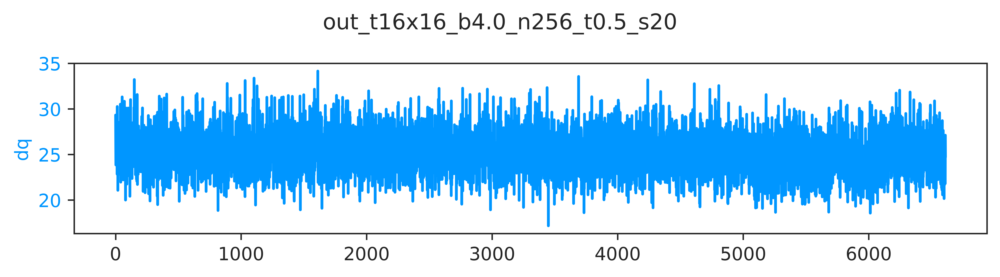

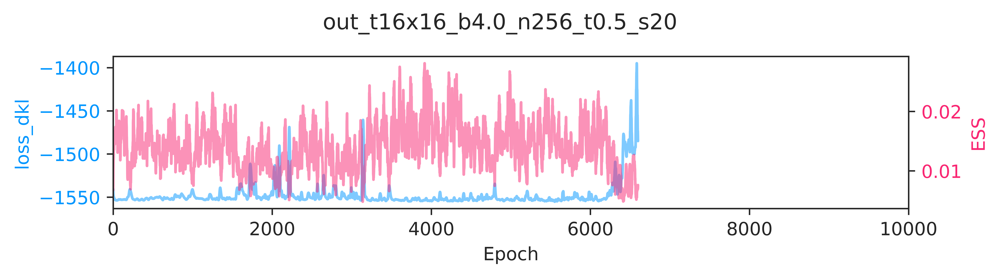

In [15]:
train_config16 = TrainConfig(**{
    'n_era': 100,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [16, 16],
    'kernel_size': 5,
    'batch_size': 256,
    'print_freq': 50,
    'plot_freq': 50,
})

train_outputs = train(param16,
                      train_config16,
                      model=model16,
                      pre_model=None,
                      logger=logger,
                      figsize=(7.5, 2))

pre_flow_plots = train_outputs['plots']
pre_flow_history = train_outputs['history']
flow_act = train_outputs['action']

pre_flow_model = train_outputs['model']
pre_flow_optimizer = train_outputs['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step = train_config.n_era * train_config.n_epoch

outfile = os.path.join(MODEL_DIR, 'pre_flow_model', TSTAMP, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step,
    outfile=outfile,
    model=train_outputs['model']['layers'],
    optimizer=pre_flow_optimizer,
    history=train_outputs['history'],
    overwrite=True,
)

plots = train_outputs['plots']
outdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', TSTAMP)

save_live_plots(plots, outdir)

In [37]:
DAYSTR = io.get_timestamp('%Y-%m-%d')
NOW = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR = os.path.join(LOGS_DIR,
                         param16.uniquestr())
METRICS_DIR = os.path.join(PARAM_DIR, 'metrics')
MODEL_DIR = os.path.join(PARAM_DIR, 'models')
PLOTS_DIR = os.path.join(PARAM_DIR, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR)
io.check_else_make_dir(MODEL_DIR)
io.check_else_make_dir(METRICS_DIR)
io.check_else_make_dir(PLOTS_DIR)

In [39]:
logger.log(PARAM_DIR)

[06:08:54]  /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10

[06:11:08]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/plots/training/pre_flow_model/2021-05-25-0608/dt.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/plots/training/pre_flow_model/2021-05-25-0608/loss.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/plots/training/pre_flow_model/2021-05-25-0608/q.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/plots/training/pre_flow_model/2021-05-25-0608/dq.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/plots/training/pre_flow_model/2021-05-25-0608/ess.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/plots/training/pre_flow_model/2021-05-25-0608/action.pdf

[06:11:09]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/plots/training/pre_flow_model/2021-05-25-0608/loss_dkl.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/plots/training/pre_flow_model/2021-05-25-0608/logp.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/plots/training/pre_flow_model/2021-05-25-0608/logq.pdf

[06:11:09]  Existing file found!                                                                                                                                                                                                                                
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/metrics/training/pre_flow_model/2021-05-25-0608/train_metrics_2021-05-25-061109.z

[06:11:09]  Saving train_metrics to /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/metrics/training/pre_flow_model/2021-05-25-0608/train_metrics_2021-05-25-061109.z.

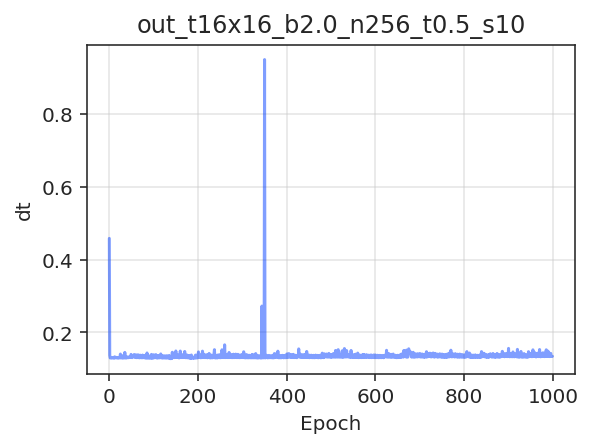

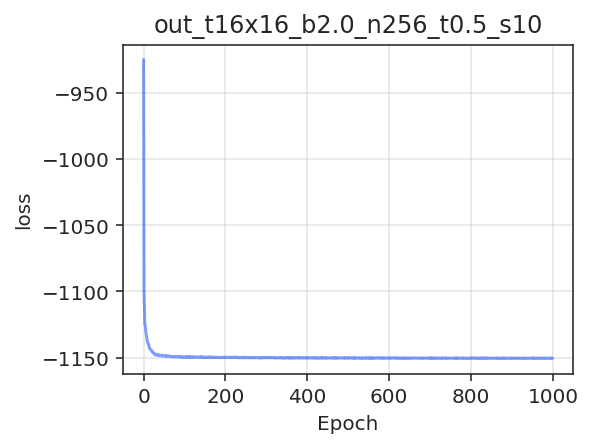

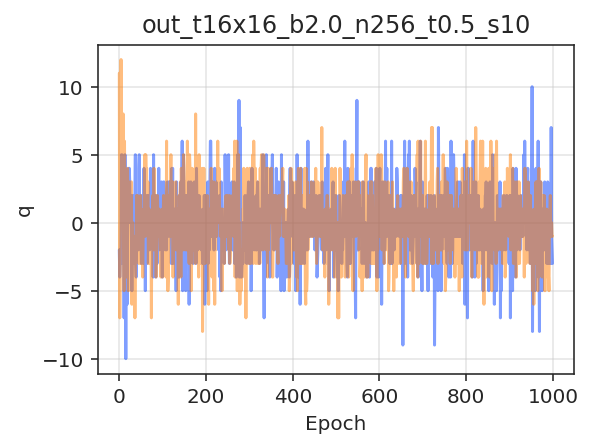

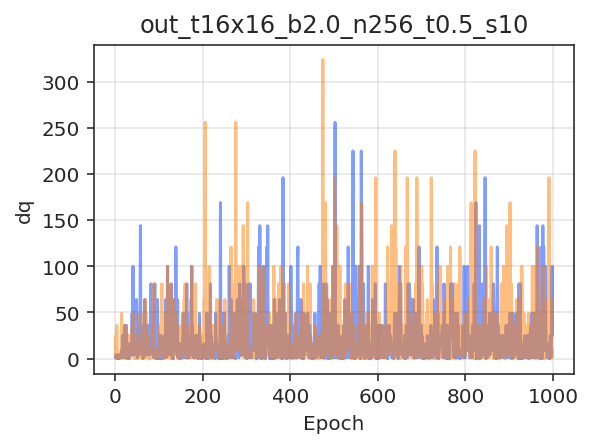

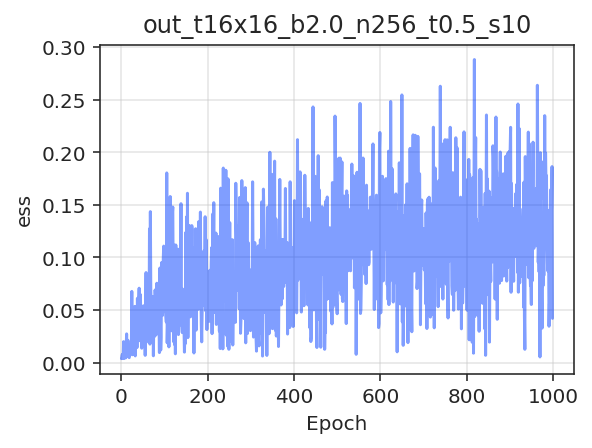

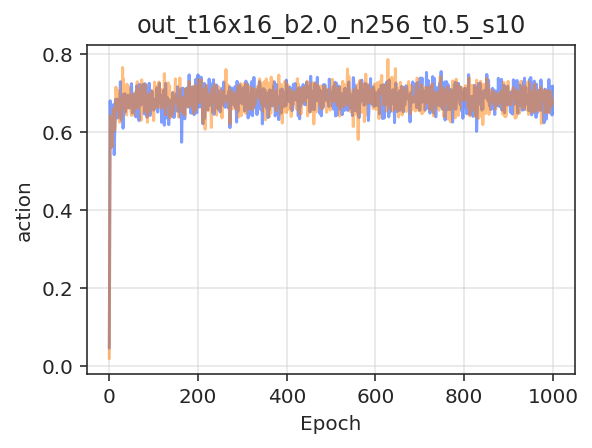

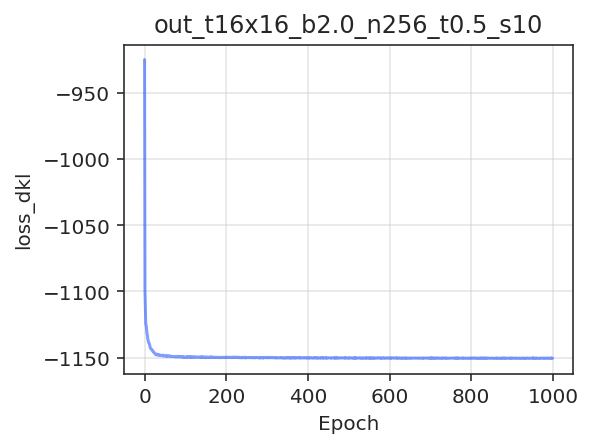

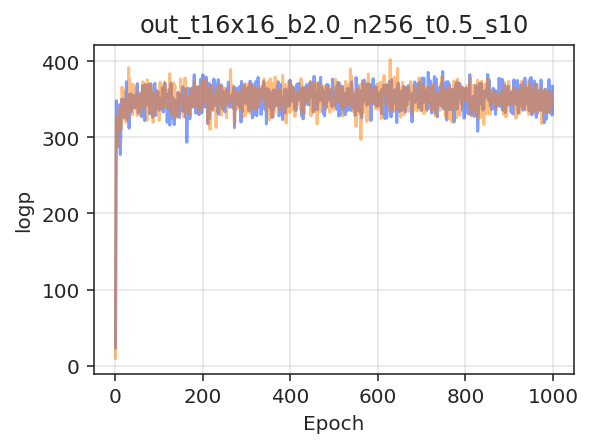

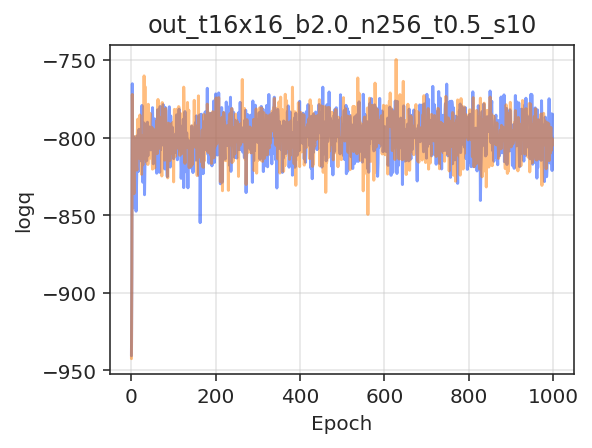

In [41]:
from fthmc.utils.plot_helpers import plot_history

outdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', TSTAMP)
io.check_else_make_dir(outdir)

plot_history(param=param16,
             history=train_outputs['history'],
             skip=['epoch'],
             thin=10,
             num_chains=2,
             therm_frac=0.0,
             xlabel='Epoch',
             outdir=outdir,
             alpha=0.5)

outdir = os.path.join(METRICS_DIR, 'training', 'pre_flow_model', TSTAMP)
outfile = os.path.join(outdir, 'train_metrics.z')
io.save_history(train_outputs['history'], outfile, name='train_metrics')

[06:12:47]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-0608

[06:12:47]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-0608/ess.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-0608/q.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-0608/dqsq.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-0608/dkl.pdf

[06:12:48]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-0608/logq.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-0608/logp.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-0608/accepted.pdf

[06:12:48]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/metrics/inference/pre_flow_model/2021-05-25-0608

[06:12:48]  Saving inference_metrics to /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n256_t0.5_s10/metrics/inference/pre_flow_model/2021-05-25-0608/inference_metrics.z.

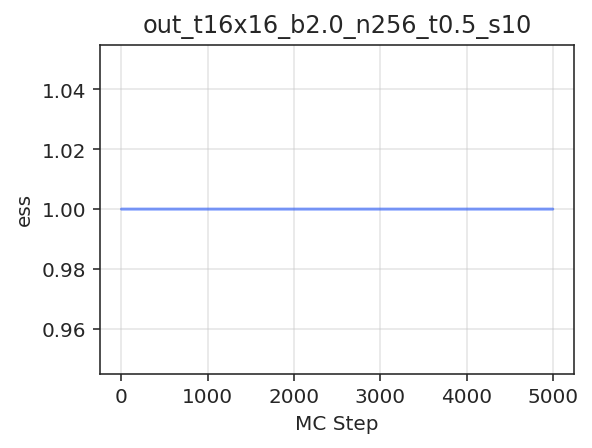

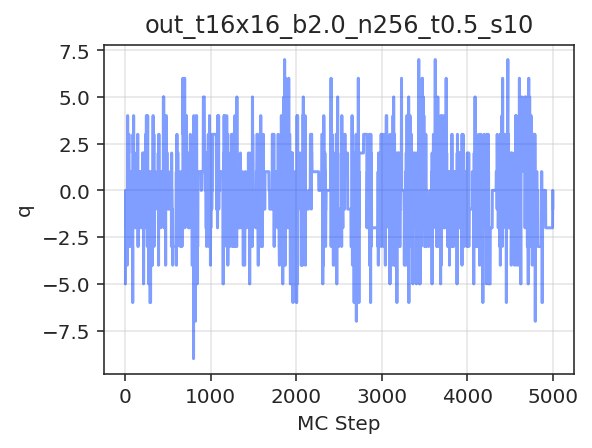

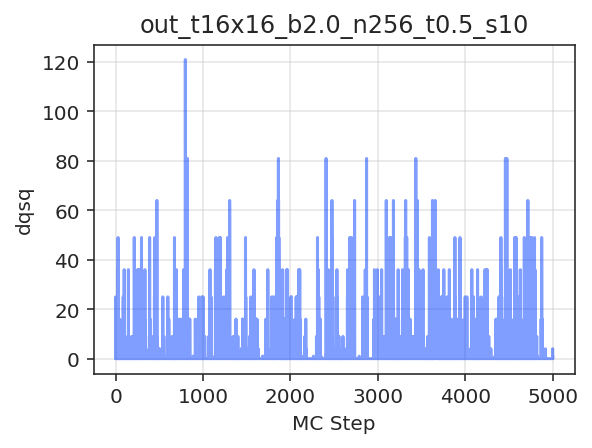

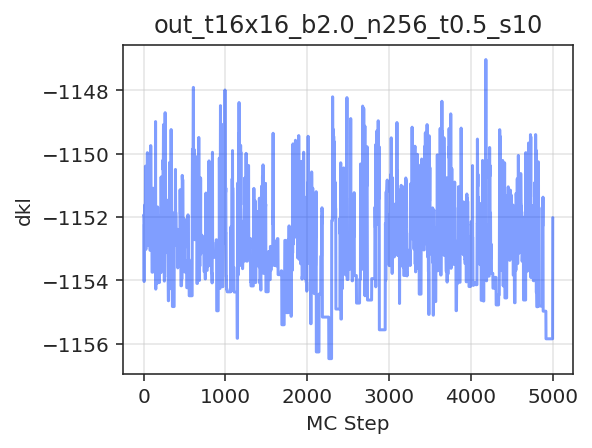

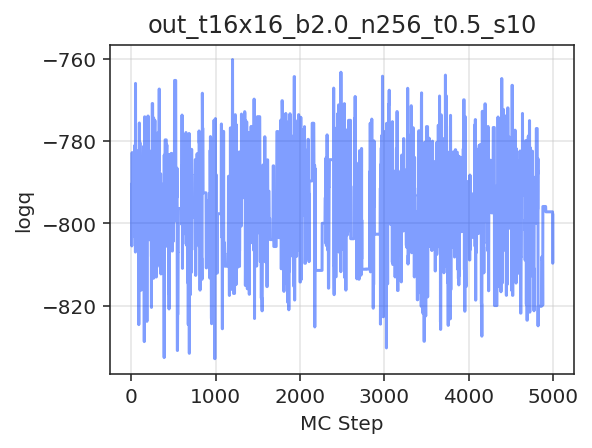

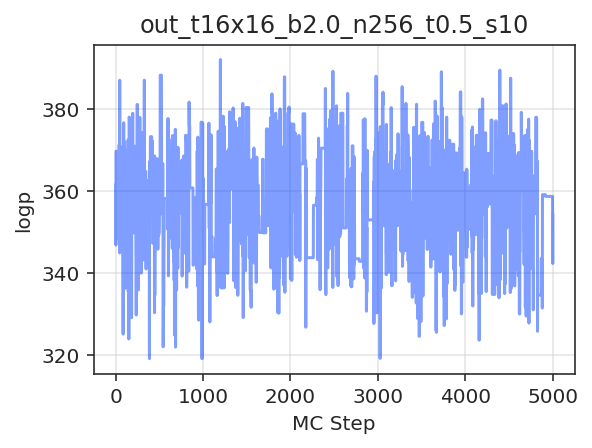

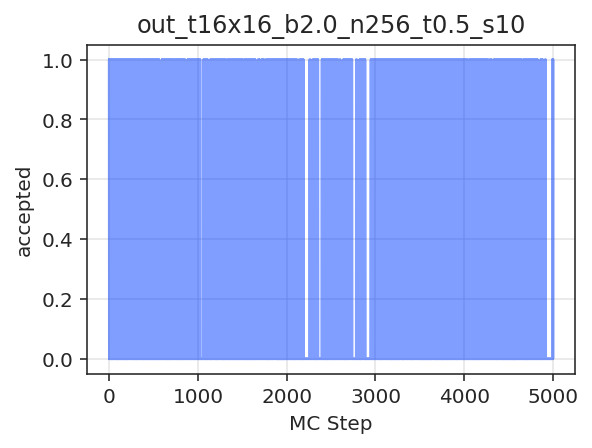

In [42]:
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed


history = make_mcmc_ensemble(model=train_outputs['model'],
                             action_fn=train_outputs['action'],
                             batch_size=train_config.batch_size,
                             num_samples=5000)

outdir = os.path.join(PLOTS_DIR, 'inference', 'pre_flow_model', TSTAMP)
io.check_else_make_dir(outdir)

plot_history(history=history,
             param=param16,
             skip=['epoch', 'x'],
             num_chains=2, therm_frac=0.0,#, thin=10,
             xlabel='MC Step', outdir=outdir, alpha=0.5)

outdir = os.path.join(METRICS_DIR, 'inference', 'pre_flow_model', TSTAMP)
outfile = os.path.join(outdir, 'inference_metrics.z')

io.save_history(history, outfile, name='inference_metrics')

In [45]:
from fthmc.utils.samplers import generate_ensemble

outputs = generate_ensemble(pre_flow_model, flow_act, logger=logger)
u1_ens = outputs['ensemble']

pre_flow = pre_flow_model['layers']

[13:35:27]  accept_rate=0.2587890625

            top_susceptibility=0.24997 +/- 0.18258

In [46]:
train_force = False
flow_model = None

if train_force:
    flow_model, flow_act = flow_train(param, with_force=True, pre_model=pre_flow_model)
else:
    flow_model = pre_flow_model
    
u1_ens = generate_ensemble(flow_model, flow_act, logger=logger)
flow = flow_model['layers']
flow.eval()

[13:40:49]  accept_rate=0.1953125

            top_susceptibility=-0.01120 +/- 0.13702

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(12, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(12, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(12, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(12, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (2): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCoup

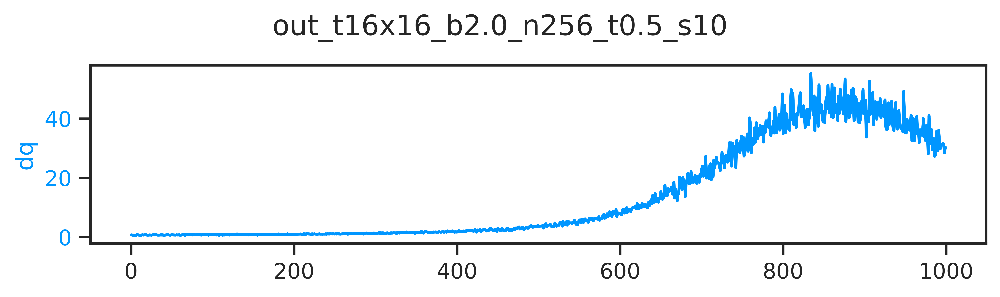

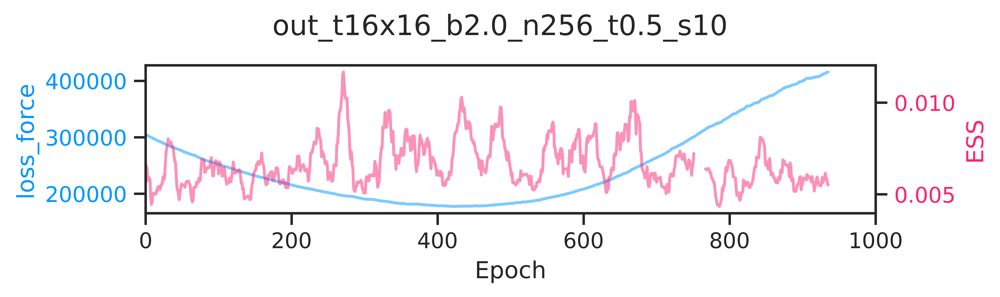

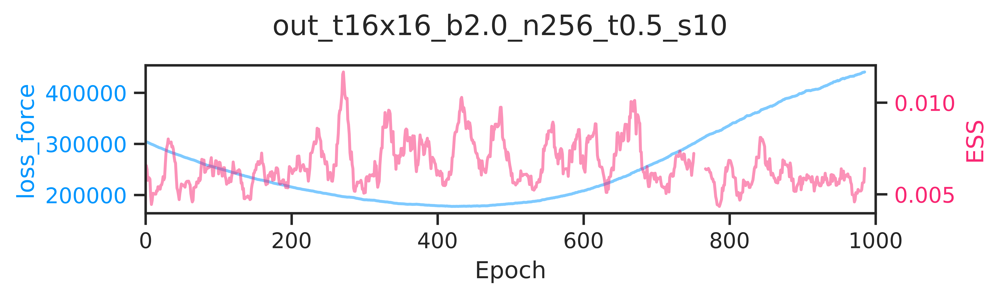

[13:47:50]  ---------------------------------------                                                                                                                                                                                                             
            ERA=0, last took: 0 min 0 s                                                                                                                                                                                                                         
            ---------------------------------------

[13:48:27]  epoch=47.000 dt=0.712 loss=280910 dq=0.690625 ess=0.00570135 action=0.688934 loss_dkl=0.000 logp=352.734 logq=-918.989 loss_force=280909.706 force_size=280910 force_norm=530.009

[13:49:05]  epoch=97.000 dt=0.711 loss=256103 dq=0.780469 ess=0.00654332 action=0.688862 loss_dkl=0.000 logp=352.697 logq=-911.332 loss_force=256103.344 force_size=256103 force_norm=506.061

[13:49:07]  ---------------------------------------                                                                                                                                                                                                             
            ERA=1, last took: 1 min 16.73 s                                                                                                                                                                                                                     
            ---------------------------------------

[13:49:43]  epoch=47.000 dt=0.714 loss=235969 dq=0.802344 ess=0.00507816 action=0.689923 loss_dkl=0.000 logp=353.241 logq=-904.171 loss_force=235968.797 force_size=235969 force_norm=485.761

[13:50:22]  epoch=97.000 dt=0.714 loss=219121 dq=0.878906 ess=0.00476414 action=0.687971 loss_dkl=0.000 logp=352.241 logq=-897.569 loss_force=219121.044 force_size=219121 force_norm=468.1

[13:50:24]  ---------------------------------------                                                                                                                                                                                                             
            ERA=2, last took: 1 min 16.72 s                                                                                                                                                                                                                     
            ---------------------------------------

[13:51:00]  epoch=47.000 dt=0.712 loss=203935 dq=1.04609 ess=0.00812634 action=0.689366 loss_dkl=0.000 logp=352.956 logq=-891.06 loss_force=203935.441 force_size=203935 force_norm=451.59

[13:51:39]  epoch=97.000 dt=0.721 loss=193849 dq=1.20938 ess=0.00649059 action=0.68918 loss_dkl=0.000 logp=352.86 logq=-885.123 loss_force=193849.409 force_size=193849 force_norm=440.282

[13:51:41]  ---------------------------------------                                                                                                                                                                                                             
            ERA=3, last took: 1 min 17.22 s                                                                                                                                                                                                                     
            ---------------------------------------

[13:52:17]  epoch=47.000 dt=0.718 loss=183980 dq=1.45156 ess=0.00729142 action=0.689494 loss_dkl=0.000 logp=353.021 logq=-879.519 loss_force=183979.594 force_size=183980 force_norm=428.927

[13:52:56]  epoch=97.000 dt=0.710 loss=179846 dq=1.70234 ess=0.00746093 action=0.689194 loss_dkl=0.000 logp=352.867 logq=-874.735 loss_force=179846.197 force_size=179846 force_norm=424.081

[13:52:58]  ---------------------------------------                                                                                                                                                                                                             
            ERA=4, last took: 1 min 17.28 s                                                                                                                                                                                                                     
            ---------------------------------------

[13:53:35]  epoch=47.000 dt=0.717 loss=177782 dq=2.25391 ess=0.00962319 action=0.688825 loss_dkl=0.000 logp=352.678 logq=-870.593 loss_force=177781.806 force_size=177782 force_norm=421.637

[13:54:13]  epoch=97.000 dt=0.718 loss=181198 dq=3.65156 ess=0.0085619 action=0.688725 loss_dkl=0.000 logp=352.627 logq=-867.534 loss_force=181198.094 force_size=181198 force_norm=425.672

[13:54:16]  ---------------------------------------                                                                                                                                                                                                             
            ERA=5, last took: 1 min 17.37 s                                                                                                                                                                                                                     
            ---------------------------------------

[13:54:53]  epoch=47.000 dt=0.737 loss=188266 dq=4.68047 ess=0.00550737 action=0.689315 loss_dkl=0.000 logp=352.929 logq=-865.704 loss_force=188266.156 force_size=188266 force_norm=433.894

[13:55:34]  epoch=97.000 dt=0.722 loss=204428 dq=8.00859 ess=0.0113645 action=0.688993 loss_dkl=0.000 logp=352.765 logq=-865.455 loss_force=204428.256 force_size=204428 force_norm=452.133

[13:55:37]  ---------------------------------------                                                                                                                                                                                                             
            ERA=6, last took: 1 min 20.85 s                                                                                                                                                                                                                     
            ---------------------------------------

[13:56:13]  epoch=47.000 dt=0.720 loss=227316 dq=12.5656 ess=0.00842534 action=0.689088 loss_dkl=0.000 logp=352.813 logq=-867.284 loss_force=227315.856 force_size=227316 force_norm=476.768

[13:56:52]  epoch=97.000 dt=0.726 loss=258198 dq=20.1414 ess=0.00654964 action=0.688053 loss_dkl=0.000 logp=352.283 logq=-870.802 loss_force=258198.366 force_size=258198 force_norm=508.129

[13:56:54]  ---------------------------------------                                                                                                                                                                                                             
            ERA=7, last took: 1 min 17.55 s                                                                                                                                                                                                                     
            ---------------------------------------

[13:57:31]  epoch=47.000 dt=0.720 loss=294153 dq=31.1125 ess=0.0074592 action=0.688836 loss_dkl=0.000 logp=352.684 logq=-875.47 loss_force=294152.812 force_size=294153 force_norm=542.354

[13:58:09]  epoch=97.000 dt=0.724 loss=327481 dq=40.3047 ess=0.00456664 action=0.68861 loss_dkl=0.000 logp=352.568 logq=-880.671 loss_force=327481.375 force_size=327481 force_norm=572.253

[13:58:12]  ---------------------------------------                                                                                                                                                                                                             
            ERA=8, last took: 1 min 17.51 s                                                                                                                                                                                                                     
            ---------------------------------------

[13:58:48]  epoch=47.000 dt=0.731 loss=364753 dq=41.8266 ess=0.00999907 action=0.688398 loss_dkl=0.000 logp=352.46 logq=-885.987 loss_force=364753.081 force_size=364753 force_norm=603.932

[13:59:27]  epoch=97.000 dt=0.721 loss=393769 dq=44.4375 ess=0.00674112 action=0.689494 loss_dkl=0.000 logp=353.021 logq=-890.008 loss_force=393768.744 force_size=393769 force_norm=627.502

[13:59:30]  ---------------------------------------                                                                                                                                                                                                             
            ERA=9, last took: 1 min 17.83 s                                                                                                                                                                                                                     
            ---------------------------------------

[14:00:06]  epoch=47.000 dt=0.725 loss=418102 dq=38.9742 ess=0.00544465 action=0.689071 loss_dkl=0.000 logp=352.804 logq=-893.661 loss_force=418102.306 force_size=418102 force_norm=646.579

[14:00:45]  epoch=97.000 dt=0.721 loss=445200 dq=30.5672 ess=0.0076074 action=0.688469 loss_dkl=0.000 logp=352.496 logq=-896.834 loss_force=445200.438 force_size=445200 force_norm=667.226

KeyError: 'optimzier_force'

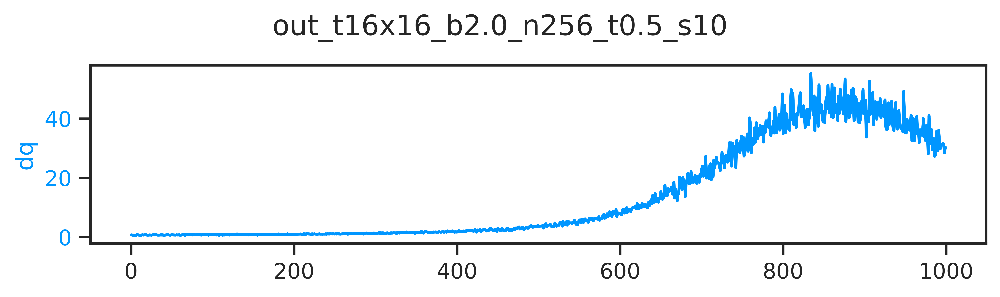

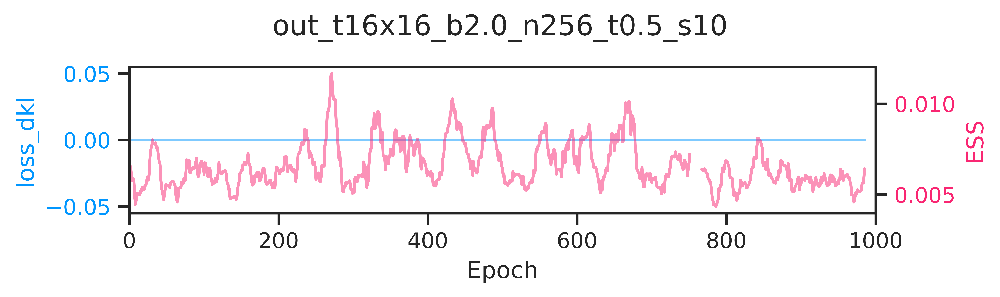

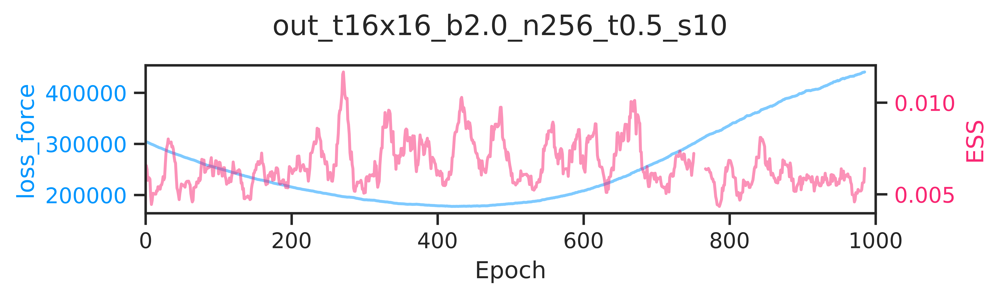

In [50]:
import seaborn as sns

from dataclasses import asdict
from copy import deepcopy
from math import pi as PI
import fthmc.utils.qed_helpers as qed
from fthmc.train import get_model

TWO_PI = 2 * PI
# from train import train

sns.set_context('notebook')
sns.set_palette('bright')

train_cfg_force = asdict(train_config16)
train_cfg_force['with_force'] = True

tconfig_force = TrainConfig(**train_cfg_force)
tconfig_force.n_era = 10
tconfig_force.n_epoch = 100

model_force = get_model(param16, tconfig_force)
                              

outputs_force = train(param16, tconfig_force,
                      model=model_force,
                      pre_model=pre_flow_model,
                      figsize=(7., 2.),
                      use_alt=False,
                      force_factor=1.,
                      dkl_factor=1.)#, logger=logger)

flow_model_force_plots = outputs_force['plots']
flow_model_force = outputs_force['model']
flow_model_force_history = outputs_force['history']
flow_action_force = outputs_force['action']
flow_model_force_optimizer = outputs_force['optimizer_force']


# Save model, optimizer, and history to checkpoint
step = tconfig_force.n_era * tconfig_force.n_epoch

outfile = os.path.join(MODEL_DIR, 'flow_model_force', TSTAMP, 'flow_model_force.tar')
io.save_checkpoint(
    epoch=step,
    outfile=outfile,
    model=outputs_force['model']['layers'],
    optimizer=outputs_force['optimzier_force'],
    history=outputs_force['history'],
    overwrite=True,
)

outdir = os.path.join(PLOTS_DIR, 'training', 'flow_model_force', TSTAMP)

save_live_plots(outputs_force['plots'], outdir)

In [52]:
def test_force(
    param: Param,
    model: dict,
    x: torch.Tensor = None,
    pre_model: dict = None
):
    """Test the force.
    
    If `x` is None:
      - Draw samples `xi (~ pre_prior)` from prior and pass through `pre_model` to get `x (~ pre_posterior)`.
     
    Pass `x` backwards through the `model` to get `xi (~ prior)`.
    
    Calculate `force(xi)` and `norm(force(xi))`.
    """
    if x is None:
        if pre_model is None:
            raise ValueError(f'Either `x` or `pre_model` must be specified.')
            
        # Draw samples `xi` from prior
        pre_xi = pre_model['prior'].sample_n(1)
        
        # Pass `xi` through layers in `pre_model`
        x = qed.ft_flow(pre_model['layers'], pre_xi)
        
    # Pass `x` backwards through layers in `model`
    xi = qed.ft_flow_inv(model['layers'], x)
    # Calculate force
    force = qed.ft_force(param, model['layers'], xi)
    force_norm = torch.linalg.norm(force)
    return force_norm

TORCH DEVICE: cuda


In [53]:
from fthmc.train import run as hmc_run
fields, metrics = hmc_run(param16, logger=logger, keep_fields=True)

#metrics_dir = os.path.join(OUTDIR, 'metrics', 'hmc')
#metrics_file = os.path.join(metrics_dir, 'metrics.z')
#io.savez(metrics, metrics_file)

[14:03:25]  Param:                                                                                                                                                                                                                                              
            ----------------                                                                                                                                                                                                                                    
            beta=2.0                                                                                                                                                                                                                                            
            L=16                                                                                                                                                                                                                                                
            tau=0.5                                                                                                                                                                                                                                             
            nstep=10                                                                                                                                                                                                                                            
            ntraj=256                                                                                                                                                                                                                                           
            nrun=5                                                                                                                                                                                                                                              
            nprint=50                                                                                                                                                                                                                                           
            seed=1331                                                                                                                                                                                                                                           
            randinit=True                                                                                                                                                                                                                                       
            nth=2                                                                                                                                                                                                                                               
            nth_interop=2                                                                                                                                                                                                                                       
            lat=[16, 16]                                                                                                                                                                                                                                        
            nd=2                                                                                                                                                                                                                                                
            shape=[2, 16, 16]                                                                                                                    

            action=-0.010 plaq=0.000 charge=-5.000

            dt=0.006 traj=2 accept=False dH=0.440 expdH=0.644 dq=0.000

[14:03:26]  dt=0.006 traj=7 accept=True dH=0.065 expdH=0.937 dq=25.000

            dt=0.006 traj=12 accept=True dH=0.016 expdH=0.984 dq=0.000

            dt=0.006 traj=17 accept=True dH=-0.046 expdH=1.047 dq=16.000

            dt=0.006 traj=22 accept=True dH=-0.021 expdH=1.021 dq=4.000

            dt=0.006 traj=27 accept=True dH=-0.046 expdH=1.047 dq=1.000

            dt=0.006 traj=32 accept=True dH=-0.035 expdH=1.036 dq=1.000

            dt=0.006 traj=37 accept=True dH=0.031 expdH=0.969 dq=4.000

            dt=0.006 traj=42 accept=True dH=0.027 expdH=0.974 dq=1.000

            dt=0.006 traj=47 accept=False dH=0.082 expdH=0.921 dq=0.000

            dt=0.006 traj=52 accept=True dH=0.035 expdH=0.966 dq=1.000

            dt=0.006 traj=57 accept=True dH=-0.044 expdH=1.045 dq=0.000

            dt=0.006 traj=62 accept=True dH=-0.012 expdH=1.012 dq=1.000

            dt=0.006 traj=67 accept=True dH=0.103 expdH=0.902 dq=1.000

            dt=0.006 traj=72 accept=True dH=-0.109 expdH=1.116 dq=1.000

            dt=0.006 traj=77 accept=True dH=-0.023 expdH=1.023 dq=1.000

            dt=0.006 traj=82 accept=True dH=-0.031 expdH=1.031 dq=1.000

            dt=0.006 traj=87 accept=True dH=-0.018 expdH=1.018 dq=0.000

            dt=0.006 traj=92 accept=True dH=0.064 expdH=0.938 dq=1.000

            dt=0.006 traj=97 accept=True dH=-0.035 expdH=1.036 dq=4.000

            dt=0.006 traj=102 accept=True dH=-0.117 expdH=1.125 dq=4.000

            dt=0.006 traj=107 accept=True dH=-0.006 expdH=1.006 dq=1.000

            dt=0.006 traj=112 accept=True dH=0.017 expdH=0.983 dq=1.000

            dt=0.006 traj=117 accept=True dH=0.053 expdH=0.949 dq=0.000

            dt=0.006 traj=122 accept=True dH=0.038 expdH=0.963 dq=0.000

            dt=0.006 traj=127 accept=True dH=-0.008 expdH=1.008 dq=4.000

            dt=0.006 traj=132 accept=True dH=-0.053 expdH=1.055 dq=0.000

            dt=0.006 traj=137 accept=True dH=0.016 expdH=0.984 dq=4.000

[14:03:27]  dt=0.006 traj=142 accept=True dH=0.104 expdH=0.901 dq=1.000

            dt=0.006 traj=147 accept=True dH=0.086 expdH=0.917 dq=9.000

            dt=0.006 traj=152 accept=True dH=-0.053 expdH=1.054 dq=0.000

            dt=0.006 traj=157 accept=True dH=-0.070 expdH=1.072 dq=1.000

            dt=0.006 traj=162 accept=True dH=0.005 expdH=0.995 dq=1.000

            dt=0.006 traj=167 accept=True dH=0.030 expdH=0.971 dq=1.000

            dt=0.006 traj=172 accept=True dH=0.056 expdH=0.945 dq=1.000

            dt=0.006 traj=177 accept=True dH=-0.008 expdH=1.008 dq=0.000

            dt=0.006 traj=182 accept=True dH=-0.035 expdH=1.036 dq=1.000

            dt=0.006 traj=187 accept=True dH=-0.021 expdH=1.021 dq=9.000

            dt=0.006 traj=192 accept=True dH=-0.062 expdH=1.064 dq=1.000

            dt=0.006 traj=197 accept=True dH=-0.047 expdH=1.048 dq=1.000

            dt=0.006 traj=202 accept=True dH=-0.074 expdH=1.077 dq=1.000

            dt=0.006 traj=207 accept=True dH=-0.095 expdH=1.100 dq=1.000

            dt=0.006 traj=212 accept=True dH=0.008 expdH=0.992 dq=0.000

            dt=0.006 traj=217 accept=True dH=0.063 expdH=0.939 dq=0.000

            dt=0.006 traj=222 accept=True dH=-0.029 expdH=1.030 dq=4.000

            dt=0.006 traj=227 accept=True dH=0.069 expdH=0.933 dq=1.000

            dt=0.006 traj=232 accept=True dH=0.100 expdH=0.905 dq=0.000

            dt=0.006 traj=237 accept=True dH=0.028 expdH=0.973 dq=9.000

            dt=0.006 traj=242 accept=True dH=-0.039 expdH=1.040 dq=1.000

            dt=0.006 traj=247 accept=True dH=-0.039 expdH=1.040 dq=4.000

            dt=0.006 traj=252 accept=True dH=-0.018 expdH=1.019 dq=0.000

            dt=0.006 traj=258 accept=True dH=0.126 expdH=0.882 dq=1.000

            dt=0.006 traj=263 accept=True dH=-0.006 expdH=1.006 dq=1.000

            dt=0.006 traj=268 accept=True dH=0.019 expdH=0.982 dq=4.000

            dt=0.006 traj=273 accept=True dH=0.011 expdH=0.989 dq=1.000

            dt=0.006 traj=278 accept=True dH=0.048 expdH=0.953 dq=9.000

[14:03:28]  dt=0.006 traj=283 accept=True dH=0.018 expdH=0.982 dq=0.000

            dt=0.006 traj=288 accept=True dH=0.069 expdH=0.934 dq=4.000

            dt=0.006 traj=293 accept=True dH=0.017 expdH=0.983 dq=1.000

            dt=0.006 traj=298 accept=True dH=-0.032 expdH=1.033 dq=1.000

            dt=0.006 traj=303 accept=True dH=-0.011 expdH=1.012 dq=1.000

            dt=0.006 traj=308 accept=True dH=-0.021 expdH=1.021 dq=1.000

            dt=0.006 traj=313 accept=True dH=-0.003 expdH=1.003 dq=0.000

            dt=0.006 traj=318 accept=True dH=-0.059 expdH=1.060 dq=4.000

            dt=0.006 traj=323 accept=True dH=-0.035 expdH=1.035 dq=4.000

            dt=0.006 traj=328 accept=True dH=-0.106 expdH=1.112 dq=1.000

            dt=0.006 traj=333 accept=True dH=0.026 expdH=0.974 dq=1.000

            dt=0.006 traj=338 accept=True dH=-0.052 expdH=1.053 dq=0.000

            dt=0.006 traj=343 accept=True dH=0.015 expdH=0.985 dq=0.000

            dt=0.006 traj=348 accept=True dH=0.017 expdH=0.984 dq=4.000

            dt=0.006 traj=353 accept=True dH=-0.009 expdH=1.009 dq=1.000

            dt=0.006 traj=358 accept=True dH=-0.109 expdH=1.116 dq=1.000

            dt=0.006 traj=363 accept=True dH=-0.100 expdH=1.106 dq=1.000

            dt=0.006 traj=368 accept=True dH=0.049 expdH=0.952 dq=1.000

            dt=0.006 traj=373 accept=True dH=0.031 expdH=0.970 dq=1.000

            dt=0.006 traj=378 accept=True dH=0.002 expdH=0.998 dq=1.000

            dt=0.006 traj=383 accept=True dH=0.054 expdH=0.947 dq=0.000

            dt=0.006 traj=388 accept=True dH=0.055 expdH=0.946 dq=0.000

            dt=0.006 traj=393 accept=True dH=0.003 expdH=0.997 dq=4.000

            dt=0.006 traj=398 accept=True dH=-0.047 expdH=1.048 dq=0.000

            dt=0.006 traj=403 accept=True dH=0.028 expdH=0.973 dq=0.000

            dt=0.006 traj=408 accept=True dH=0.068 expdH=0.934 dq=1.000

            dt=0.006 traj=413 accept=True dH=0.094 expdH=0.910 dq=0.000

[14:03:29]  dt=0.006 traj=418 accept=True dH=-0.004 expdH=1.004 dq=1.000

            dt=0.006 traj=423 accept=True dH=0.063 expdH=0.939 dq=4.000

            dt=0.006 traj=428 accept=True dH=0.123 expdH=0.884 dq=0.000

            dt=0.006 traj=433 accept=True dH=0.085 expdH=0.918 dq=9.000

            dt=0.006 traj=438 accept=True dH=0.035 expdH=0.965 dq=1.000

            dt=0.006 traj=443 accept=False dH=0.094 expdH=0.910 dq=0.000

            dt=0.006 traj=448 accept=True dH=-0.005 expdH=1.005 dq=0.000

            dt=0.006 traj=453 accept=True dH=-0.018 expdH=1.019 dq=1.000

            dt=0.006 traj=458 accept=True dH=0.023 expdH=0.977 dq=0.000

            dt=0.006 traj=463 accept=True dH=-0.018 expdH=1.018 dq=0.000

            dt=0.006 traj=468 accept=True dH=0.025 expdH=0.976 dq=1.000

            dt=0.006 traj=473 accept=True dH=-0.121 expdH=1.128 dq=16.000

            dt=0.006 traj=478 accept=True dH=0.041 expdH=0.960 dq=4.000

            dt=0.006 traj=483 accept=True dH=-0.001 expdH=1.001 dq=1.000

            dt=0.006 traj=488 accept=True dH=0.040 expdH=0.961 dq=0.000

            dt=0.006 traj=493 accept=True dH=0.022 expdH=0.978 dq=0.000

            dt=0.006 traj=498 accept=True dH=-0.055 expdH=1.057 dq=4.000

            dt=0.006 traj=503 accept=True dH=0.054 expdH=0.948 dq=0.000

            dt=0.006 traj=508 accept=True dH=0.033 expdH=0.968 dq=16.000

            dt=0.006 traj=514 accept=True dH=-0.057 expdH=1.059 dq=1.000

            dt=0.006 traj=519 accept=True dH=-0.138 expdH=1.148 dq=1.000

            dt=0.006 traj=524 accept=True dH=-0.018 expdH=1.018 dq=1.000

            dt=0.006 traj=529 accept=True dH=0.032 expdH=0.968 dq=0.000

            dt=0.006 traj=534 accept=True dH=-0.114 expdH=1.121 dq=0.000

            dt=0.006 traj=539 accept=True dH=0.020 expdH=0.980 dq=0.000

            dt=0.006 traj=544 accept=True dH=-0.041 expdH=1.042 dq=0.000

            dt=0.006 traj=549 accept=True dH=0.089 expdH=0.914 dq=0.000

            dt=0.006 traj=554 accept=True dH=0.036 expdH=0.965 dq=0.000

[14:03:30]  dt=0.006 traj=559 accept=True dH=-0.095 expdH=1.100 dq=0.000

            dt=0.006 traj=564 accept=True dH=-0.079 expdH=1.082 dq=1.000

            dt=0.006 traj=569 accept=True dH=-0.125 expdH=1.133 dq=1.000

            dt=0.006 traj=574 accept=True dH=0.005 expdH=0.995 dq=0.000

            dt=0.006 traj=579 accept=True dH=0.011 expdH=0.989 dq=1.000

            dt=0.006 traj=584 accept=True dH=-0.085 expdH=1.089 dq=1.000

            dt=0.006 traj=589 accept=True dH=0.044 expdH=0.957 dq=1.000

            dt=0.006 traj=594 accept=True dH=-0.037 expdH=1.038 dq=4.000

            dt=0.006 traj=599 accept=False dH=0.055 expdH=0.946 dq=0.000

            dt=0.006 traj=604 accept=True dH=-0.025 expdH=1.026 dq=0.000

            dt=0.006 traj=609 accept=True dH=-0.004 expdH=1.004 dq=0.000

            dt=0.006 traj=614 accept=True dH=0.031 expdH=0.969 dq=4.000

            dt=0.006 traj=619 accept=True dH=-0.023 expdH=1.023 dq=4.000

            dt=0.006 traj=624 accept=True dH=0.064 expdH=0.938 dq=9.000

            dt=0.006 traj=629 accept=True dH=-0.024 expdH=1.025 dq=4.000

            dt=0.006 traj=634 accept=True dH=-0.036 expdH=1.036 dq=1.000

            dt=0.006 traj=639 accept=True dH=-0.030 expdH=1.030 dq=1.000

            dt=0.006 traj=644 accept=True dH=-0.029 expdH=1.029 dq=1.000

            dt=0.006 traj=649 accept=True dH=0.011 expdH=0.989 dq=1.000

            dt=0.006 traj=654 accept=True dH=-0.048 expdH=1.049 dq=4.000

            dt=0.006 traj=659 accept=True dH=-0.094 expdH=1.099 dq=0.000

            dt=0.006 traj=664 accept=True dH=-0.063 expdH=1.065 dq=0.000

            dt=0.008 traj=669 accept=True dH=0.022 expdH=0.978 dq=9.000

            dt=0.006 traj=674 accept=True dH=0.101 expdH=0.904 dq=1.000

            dt=0.006 traj=679 accept=True dH=0.017 expdH=0.983 dq=0.000

            dt=0.006 traj=684 accept=True dH=-0.011 expdH=1.011 dq=1.000

            dt=0.006 traj=689 accept=True dH=-0.028 expdH=1.028 dq=4.000

[14:03:31]  dt=0.006 traj=694 accept=True dH=-0.046 expdH=1.047 dq=0.000

            dt=0.006 traj=699 accept=True dH=-0.009 expdH=1.009 dq=4.000

            dt=0.006 traj=704 accept=True dH=0.015 expdH=0.985 dq=1.000

            dt=0.006 traj=709 accept=True dH=-0.036 expdH=1.037 dq=1.000

            dt=0.006 traj=714 accept=True dH=0.023 expdH=0.978 dq=0.000

            dt=0.008 traj=719 accept=True dH=0.044 expdH=0.957 dq=0.000

            dt=0.006 traj=724 accept=True dH=-0.089 expdH=1.093 dq=4.000

            dt=0.006 traj=729 accept=True dH=-0.045 expdH=1.046 dq=0.000

            dt=0.006 traj=734 accept=True dH=-0.063 expdH=1.066 dq=1.000

            dt=0.006 traj=739 accept=True dH=0.092 expdH=0.912 dq=1.000

            dt=0.008 traj=744 accept=True dH=-0.029 expdH=1.029 dq=0.000

            dt=0.006 traj=749 accept=True dH=-0.096 expdH=1.101 dq=0.000

            dt=0.006 traj=754 accept=True dH=0.057 expdH=0.945 dq=1.000

            dt=0.006 traj=759 accept=True dH=0.074 expdH=0.929 dq=9.000

            dt=0.006 traj=764 accept=True dH=0.011 expdH=0.989 dq=1.000

            dt=0.006 traj=770 accept=True dH=0.079 expdH=0.924 dq=0.000

            dt=0.006 traj=775 accept=True dH=0.057 expdH=0.944 dq=0.000

            dt=0.006 traj=780 accept=True dH=0.088 expdH=0.916 dq=1.000

            dt=0.006 traj=785 accept=True dH=0.007 expdH=0.993 dq=1.000

            dt=0.006 traj=790 accept=True dH=-0.002 expdH=1.002 dq=1.000

            dt=0.006 traj=795 accept=True dH=-0.111 expdH=1.117 dq=1.000

            dt=0.006 traj=800 accept=True dH=-0.144 expdH=1.154 dq=0.000

            dt=0.006 traj=805 accept=True dH=-0.086 expdH=1.090 dq=16.000

            dt=0.006 traj=810 accept=True dH=-0.003 expdH=1.003 dq=0.000

            dt=0.006 traj=815 accept=True dH=0.014 expdH=0.986 dq=1.000

            dt=0.006 traj=820 accept=True dH=0.106 expdH=0.899 dq=4.000

            dt=0.006 traj=825 accept=True dH=0.173 expdH=0.841 dq=4.000

            dt=0.006 traj=830 accept=True dH=0.034 expdH=0.966 dq=4.000

[14:03:32]  dt=0.006 traj=835 accept=True dH=0.067 expdH=0.935 dq=1.000

            dt=0.006 traj=840 accept=True dH=0.030 expdH=0.971 dq=4.000

            dt=0.006 traj=845 accept=False dH=0.023 expdH=0.977 dq=0.000

            dt=0.006 traj=850 accept=True dH=-0.089 expdH=1.093 dq=9.000

            dt=0.006 traj=855 accept=True dH=-0.043 expdH=1.044 dq=1.000

            dt=0.006 traj=860 accept=True dH=-0.062 expdH=1.064 dq=0.000

            dt=0.006 traj=865 accept=True dH=-0.018 expdH=1.018 dq=4.000

            dt=0.006 traj=870 accept=True dH=0.015 expdH=0.985 dq=0.000

            dt=0.006 traj=875 accept=True dH=-0.139 expdH=1.149 dq=1.000

            dt=0.006 traj=880 accept=True dH=-0.065 expdH=1.067 dq=1.000

            dt=0.006 traj=885 accept=True dH=-0.032 expdH=1.033 dq=1.000

            dt=0.006 traj=890 accept=True dH=-0.017 expdH=1.017 dq=4.000

            dt=0.006 traj=895 accept=True dH=0.026 expdH=0.975 dq=4.000

            dt=0.006 traj=900 accept=True dH=0.048 expdH=0.953 dq=1.000

            dt=0.006 traj=905 accept=True dH=-0.019 expdH=1.019 dq=1.000

            dt=0.006 traj=910 accept=True dH=-0.015 expdH=1.015 dq=4.000

            dt=0.006 traj=915 accept=True dH=-0.078 expdH=1.081 dq=9.000

            dt=0.006 traj=920 accept=True dH=0.001 expdH=0.999 dq=1.000

            dt=0.006 traj=925 accept=True dH=0.059 expdH=0.942 dq=1.000

            dt=0.006 traj=930 accept=True dH=-0.040 expdH=1.041 dq=0.000

            dt=0.006 traj=935 accept=True dH=-0.063 expdH=1.065 dq=1.000

            dt=0.006 traj=940 accept=True dH=0.008 expdH=0.992 dq=1.000

            dt=0.006 traj=945 accept=True dH=-0.062 expdH=1.064 dq=1.000

            dt=0.006 traj=950 accept=True dH=0.117 expdH=0.890 dq=1.000

            dt=0.006 traj=955 accept=True dH=-0.004 expdH=1.004 dq=9.000

            dt=0.006 traj=960 accept=True dH=-0.061 expdH=1.063 dq=1.000

            dt=0.006 traj=965 accept=True dH=0.107 expdH=0.899 dq=0.000

[14:03:33]  dt=0.006 traj=970 accept=True dH=0.109 expdH=0.897 dq=0.000

            dt=0.006 traj=975 accept=True dH=0.075 expdH=0.927 dq=1.000

            dt=0.006 traj=980 accept=True dH=0.082 expdH=0.921 dq=0.000

            dt=0.006 traj=985 accept=True dH=0.001 expdH=0.999 dq=1.000

            dt=0.006 traj=990 accept=True dH=-0.020 expdH=1.020 dq=4.000

            dt=0.006 traj=995 accept=True dH=0.052 expdH=0.949 dq=9.000

            dt=0.006 traj=1000 accept=True dH=-0.054 expdH=1.055 dq=0.000

            dt=0.006 traj=1005 accept=True dH=0.050 expdH=0.951 dq=4.000

            dt=0.006 traj=1010 accept=True dH=-0.049 expdH=1.051 dq=1.000

            dt=0.006 traj=1015 accept=True dH=0.060 expdH=0.942 dq=9.000

            dt=0.006 traj=1020 accept=True dH=0.017 expdH=0.983 dq=0.000

            dt=0.006 traj=1026 accept=True dH=-0.001 expdH=1.001 dq=1.000

            dt=0.006 traj=1031 accept=True dH=0.004 expdH=0.996 dq=1.000

            dt=0.006 traj=1036 accept=True dH=-0.084 expdH=1.088 dq=4.000

            dt=0.006 traj=1041 accept=True dH=-0.027 expdH=1.027 dq=1.000

            dt=0.006 traj=1046 accept=True dH=0.071 expdH=0.932 dq=4.000

            dt=0.006 traj=1051 accept=True dH=-0.026 expdH=1.026 dq=0.000

            dt=0.006 traj=1056 accept=True dH=0.004 expdH=0.996 dq=4.000

            dt=0.006 traj=1061 accept=True dH=-0.032 expdH=1.033 dq=0.000

            dt=0.006 traj=1066 accept=True dH=-0.016 expdH=1.016 dq=0.000

            dt=0.006 traj=1071 accept=True dH=-0.036 expdH=1.037 dq=4.000

            dt=0.006 traj=1076 accept=True dH=0.016 expdH=0.984 dq=1.000

            dt=0.006 traj=1081 accept=True dH=0.026 expdH=0.974 dq=0.000

            dt=0.006 traj=1086 accept=True dH=0.060 expdH=0.942 dq=0.000

            dt=0.006 traj=1091 accept=True dH=-0.009 expdH=1.009 dq=0.000

            dt=0.006 traj=1096 accept=True dH=0.033 expdH=0.968 dq=0.000

            dt=0.006 traj=1101 accept=True dH=0.020 expdH=0.980 dq=0.000

            dt=0.006 traj=1106 accept=True dH=-0.073 expdH=1.076 dq=4.000

[14:03:34]  dt=0.006 traj=1111 accept=True dH=0.063 expdH=0.939 dq=1.000

            dt=0.006 traj=1116 accept=True dH=-0.045 expdH=1.046 dq=1.000

            dt=0.006 traj=1121 accept=True dH=0.029 expdH=0.971 dq=1.000

            dt=0.006 traj=1126 accept=True dH=-0.009 expdH=1.009 dq=0.000

            dt=0.006 traj=1131 accept=False dH=0.103 expdH=0.902 dq=0.000

            dt=0.006 traj=1136 accept=True dH=0.060 expdH=0.941 dq=0.000

            dt=0.006 traj=1141 accept=True dH=-0.011 expdH=1.011 dq=0.000

            dt=0.006 traj=1146 accept=True dH=-0.025 expdH=1.025 dq=1.000

            dt=0.006 traj=1151 accept=True dH=0.065 expdH=0.937 dq=1.000

            dt=0.006 traj=1156 accept=True dH=-0.077 expdH=1.080 dq=4.000

            dt=0.006 traj=1161 accept=True dH=-0.003 expdH=1.003 dq=9.000

            dt=0.006 traj=1166 accept=True dH=-0.019 expdH=1.019 dq=9.000

            dt=0.006 traj=1171 accept=True dH=-0.037 expdH=1.038 dq=1.000

            dt=0.006 traj=1176 accept=True dH=0.001 expdH=0.999 dq=1.000

            dt=0.006 traj=1181 accept=True dH=-0.077 expdH=1.081 dq=0.000

            dt=0.006 traj=1186 accept=True dH=0.025 expdH=0.976 dq=1.000

            dt=0.006 traj=1191 accept=True dH=0.011 expdH=0.989 dq=9.000

            dt=0.006 traj=1196 accept=True dH=0.006 expdH=0.994 dq=4.000

            dt=0.006 traj=1201 accept=True dH=0.024 expdH=0.976 dq=4.000

            dt=0.006 traj=1206 accept=True dH=-0.071 expdH=1.073 dq=1.000

            dt=0.006 traj=1211 accept=True dH=-0.029 expdH=1.030 dq=1.000

            dt=0.006 traj=1216 accept=True dH=-0.049 expdH=1.051 dq=1.000

            dt=0.006 traj=1221 accept=True dH=-0.061 expdH=1.063 dq=1.000

            dt=0.006 traj=1226 accept=False dH=0.113 expdH=0.893 dq=0.000

            dt=0.006 traj=1231 accept=True dH=0.117 expdH=0.890 dq=1.000

            dt=0.006 traj=1236 accept=True dH=-0.095 expdH=1.100 dq=4.000

            dt=0.006 traj=1241 accept=True dH=0.042 expdH=0.959 dq=0.000

            dt=0.006 traj=1246 accept=True dH=-0.036 expdH=1.037 dq=1.000

[14:03:35]  dt=0.006 traj=1251 accept=True dH=0.040 expdH=0.961 dq=0.000

            dt=0.006 traj=1256 accept=False dH=0.042 expdH=0.959 dq=0.000

            dt=0.006 traj=1261 accept=True dH=-0.061 expdH=1.063 dq=1.000

            dt=0.006 traj=1266 accept=True dH=-0.001 expdH=1.001 dq=1.000

            dt=0.006 traj=1271 accept=True dH=0.058 expdH=0.944 dq=1.000

            dt=0.006 traj=1276 accept=True dH=0.005 expdH=0.995 dq=0.000

            Run times: [0.005877, 1.887315, 0.00585, 1.848469, 0.005753, 1.859831, 0.00581, 1.854375, 0.005814, 1.831922]

            Per trajectory: [2.3e-05, 0.007372, 2.3e-05, 0.007221, 2.2e-05, 0.007265, 2.3e-05, 0.007244, 2.3e-05, 0.007156]

In [54]:
#field_arr = torch.stack(tuple(fields.values()), dim=0)
len(fields)
#
field_arr = np.array([qed.grab(torch.stack(i)) for i in fields])
field_arr.shape
#logger.log(field_arr.shape)

5

(5, 256, 2, 16, 16)

In [55]:
for field in field_arr:
    force_tf = test_force(param16, flow_model_force, pre_model=pre_flow_model)
    logger.log(f'ft_flow(players, pxi), (pxi ~ pre_prior): {force_tf:.5g}') 
    
    x = torch.from_numpy(field[-1]).squeeze()[None, :]
    if torch.cuda.is_available():
        x = x.cuda()
    
    #x_ = field_arr.squeeze()[None, :]
    force_ = test_force(param16, flow_model_force, x=x, pre_model=pre_flow_model)
    logger.log(f'ft_flow(layers, field_arr), (pxi ~ pre_prior): {force_:.5g}')

[14:04:06]  ft_flow(players, pxi), (pxi ~ pre_prior): 39.319

[14:04:07]  ft_flow(layers, field_arr), (pxi ~ pre_prior): 47.624

            ft_flow(players, pxi), (pxi ~ pre_prior): 36.847

[14:04:08]  ft_flow(layers, field_arr), (pxi ~ pre_prior): 37.881

            ft_flow(players, pxi), (pxi ~ pre_prior): 45.533

            ft_flow(layers, field_arr), (pxi ~ pre_prior): 36.829

[14:04:09]  ft_flow(players, pxi), (pxi ~ pre_prior): 40.777

            ft_flow(layers, field_arr), (pxi ~ pre_prior): 39.993

[14:04:10]  ft_flow(players, pxi), (pxi ~ pre_prior): 39.146

            ft_flow(layers, field_arr), (pxi ~ pre_prior): 40.296

In [56]:
# field_arr generated from generic HMC run
for idx, fields in enumerate(field_arr):
    # x generated from HMC
    x = torch.from_numpy(fields)
    if torch.cuda.is_available():
        x = x.cuda()
        
    # flow HMC samples backwards through `flow_model_force` and calculate force
    force1 = test_force(param, flow_model_force, x=x)
    
    # sample x ~ pre_flow_model_prior, flow through `pre_flow_model` to get xi 
    # flow xi backwards through `flow_model_force` and calculate force
    force2 = test_force(param, flow_model_force, pre_model=pre_flow_model)
    
    logger.log(f'run={idx}\n'
               f'  (xi ~ HMC): force_xi={force1:.5g}\n'
               f"  (xi ~ pre_flow_model_prior): force_xi_pre={force2:.5g}")

[14:04:20]  run=0                                                                                                                                                                                                                                               
              (xi ~ HMC): force_xi=682.87                                                                                                                                                                                                                       
              (xi ~ pre_flow_model_prior): force_xi_pre=43.506

[14:04:21]  run=1                                                                                                                                                                                                                                               
              (xi ~ HMC): force_xi=663.13                                                                                                                                                                                                                       
              (xi ~ pre_flow_model_prior): force_xi_pre=37.95

[14:04:22]  run=2                                                                                                                                                                                                                                               
              (xi ~ HMC): force_xi=671.16                                                                                                                                                                                                                       
              (xi ~ pre_flow_model_prior): force_xi_pre=39.265

[14:04:23]  run=3                                                                                                                                                                                                                                               
              (xi ~ HMC): force_xi=661.54                                                                                                                                                                                                                       
              (xi ~ pre_flow_model_prior): force_xi_pre=41.879

[14:04:24]  run=4                                                                                                                                                                                                                                               
              (xi ~ HMC): force_xi=671.06                                                                                                                                                                                                                       
              (xi ~ pre_flow_model_prior): force_xi_pre=42.284

In [57]:
#field_run = torch.stack(tuple(fields.values()), dim=0)
##flows = flow

#x0 = field_arr[0][None, :]
#x = field_arr[0][None, :]

# select last trajectory from last run
x = torch.from_numpy(field_arr[-1][-1][None, :]).cuda()
x0 = torch.from_numpy(field_arr[-1][-1][None, :]).cuda()

if torch.cuda.is_available():
    x = x.cuda()

plaq0 = qed.action(param16, x) / (-param16.beta * param16.volume)
logger.log(f'plaq(field_arr[0])={plaq0:.8g}')

#logger\.log(f'plaq(field_run[0]) {qed.action(param, x) / (-param.beta*param.volume)}')
# field.requires_grad_(True)
#x = field_run[0][None, :]
logJ = 0.0
for layer in reversed(flow_model_force['layers']):
    x, lJ = layer.reverse(x)
    logJ += lJ

# x is the prior distribution now
    
x.requires_grad_(True)
    
y = x
logJy = 0.0
for layer in flow_model_force['layers']:
    y, lJ = layer.forward(y)
    logJy += lJ
    
s = qed.action(param16, y[0][None, :]) - logJy

logger.log(f'sum(logJ): {qed.grab(logJ.sum())}')
logger.log(f'sum(logJy): {qed.grab(logJy.sum())}')
#print(logJ,logJy)


# print("eff_action", s + 136.3786)

logger.log(f'original_action: {qed.action(param16, y[0][None, :]) + 91}')
#print("original_action", qed.action(param, y[0][None, :]) + 91)

logger.log(f'eff_action: {s + 56}')
#print("eff_action", {s + 56)

s.backward()

f = x.grad

x.requires_grad_(False)

logger.log(f'plaq(x) {qed.action(param16, x[0][None, :]) / (-param16.beta*param16.volume)} '
           f'logJ {qed.grab(logJ)}  force.norm {torch.linalg.norm(f)}')
logger.log(f'plaq(y) {qed.action(param16, y[0][None, :]) / (-param16.beta*param16.volume)}')
logger.log(f'plaq(x) {qed.action(param16, x0) / (-param16.beta*param16.volume)}  '
           f'force.norm {torch.linalg.norm(qed.force(param16, x0))}')

[14:06:02]  plaq(field_arr[0])=0.67688489

tensor([[[[6.1964, 2.6502, 1.1641, 3.6411, 3.1557, 0.3509, 0.4302, 0.9024,
           1.5708, 4.9880, 2.5763, 0.2560, 2.7726, 0.1264, 3.1037, 5.8475],
          [4.8977, 4.0654, 1.4303, 1.6185, 4.0999, 4.6794, 2.1185, 5.8067,
           1.1013, 3.5306, 1.0902, 5.0557, 4.8209, 0.2230, 0.8437, 5.6993],
          [0.3644, 5.4399, 4.0339, 3.7903, 2.9120, 4.7864, 3.5720, 1.6335,
           4.7023, 2.4229, 2.7825, 6.1007, 2.4841, 1.9336, 3.7935, 4.1095],
          [0.9972, 0.7358, 1.5171, 1.3917, 4.6144, 1.0016, 3.4001, 2.7973,
           3.2953, 0.7039, 0.5409, 2.8146, 5.8345, 2.2934, 5.4010, 0.1946],
          [2.3732, 2.1986, 1.8766, 4.9610, 0.3354, 2.1794, 1.9589, 5.9506,
           4.0421, 2.4027, 4.9524, 2.1296, 4.7249, 5.4562, 3.8391, 3.4707],
          [0.0534, 4.9130, 5.2448, 1.2868, 4.6769, 6.0324, 5.3804, 2.0176,
           2.9932, 3.4101, 4.7178, 2.7589, 3.0543, 2.9472, 2.6824, 3.1612],
          [1.4452, 1.8162, 1.7304, 3.2165, 2.5948, 2.3213, 1.6836, 6.1212,
           4.4499, 

            sum(logJ): 48.03312683105469

            sum(logJy): -48.03306579589844

            original_action: -255.56497192382812

            eff_action: tensor([-242.5319], grad_fn=<AddBackward0>)

tensor([[[[6.1964, 2.6502, 1.1641, 3.6411, 3.1557, 0.3509, 0.4302, 0.9024,
           1.5708, 4.9880, 2.5763, 0.2560, 2.7726, 0.1264, 3.1037, 5.8475],
          [4.8977, 4.0654, 1.4303, 1.6185, 4.0999, 4.6794, 2.1185, 5.8067,
           1.1013, 3.5306, 1.0902, 5.0557, 4.8209, 0.2230, 0.8437, 5.6993],
          [0.3644, 5.4399, 4.0339, 3.7903, 2.9120, 4.7864, 3.5720, 1.6335,
           4.7023, 2.4229, 2.7825, 6.1007, 2.4841, 1.9336, 3.7935, 4.1095],
          [0.9972, 0.7358, 1.5171, 1.3917, 4.6144, 1.0016, 3.4001, 2.7973,
           3.2953, 0.7039, 0.5409, 2.8146, 5.8345, 2.2934, 5.4010, 0.1946],
          [2.3732, 2.1986, 1.8766, 4.9610, 0.3354, 2.1794, 1.9589, 5.9506,
           4.0421, 2.4027, 4.9524, 2.1296, 4.7249, 5.4562, 3.8391, 3.4707],
          [0.0534, 4.9130, 5.2448, 1.2868, 4.6769, 6.0324, 5.3804, 2.0176,
           2.9932, 3.4101, 4.7178, 2.7589, 3.0543, 2.9472, 2.6824, 3.1612],
          [1.4452, 1.8162, 1.7304, 3.2165, 2.5948, 2.3213, 1.6836, 6.1212,
           4.4499, 

            plaq(x) -0.010348577052354813 logJ [48.033127]  force.norm 40.29621505737305

            plaq(y) 0.6768847107887268

            plaq(x) 0.6768848896026611  force.norm 38.85986328125

In [58]:
logger.log(x.shape)

field_tensor = torch.from_numpy(field_arr).cuda()

x = qed.ft_flow_inv(flow, field_tensor[-1])
# x = field_run
#for layer in reversed(flows):
#    x, lJ = layer.reverse(x)
ff = qed.ft_force(param16, flow, x)
logger.log(torch.linalg.norm(ff))
fff = qed.ft_force(param16, flow, x)
logger.log(torch.linalg.norm(fff))

[14:06:13]  torch.Size([1, 2, 16, 16])

            tensor(1149.6445)

[14:06:14]  tensor(1149.6449)

In [59]:
x = qed.ft_flow_inv(flow, field_tensor[-1])
logger.log(qed.grab(qed.ft_action(param, flow, x)))

[14:06:17]  [-213.39851 -211.62587 -211.27452 -213.16982 -210.1105  -211.66083                                                                                                                                                                                  
             -215.12192 -211.84068 -211.86406 -211.99805 -213.61786 -211.0791                                                                                                                                                                                   
             -210.17462 -211.17595 -208.6156  -210.20139 -208.40991 -208.63417                                                                                                                                                                                  
             -211.40352 -208.18384 -210.80591 -211.96547 -212.62305 -212.45058                                                                                                                                                                                  
             -212.84543 -210.90617 -208.76819 -208.65077 -212.0779  -208.68723                                                                                                                                                                                  
             -211.10349 -211.15894 -215.01196 -214.04028 -213.57558 -209.23228                                                                                                                                                                                  
             -211.28702 -211.28702 -214.02396 -214.15018 -211.14684 -211.18134                                                                                                                                                                                  
             -208.79654 -212.80952 -208.96262 -210.52005 -211.57101 -212.05666                                                                                                                                                                                  
             -216.1482  -211.70638 -211.45848 -212.93973 -214.40305 -211.23552                                                                                                                                                                                  
             -210.85307 -212.34512 -212.22736 -210.15941 -211.70198 -212.19475                                                                                                                                                                                  
             -209.32402 -214.40483 -211.62292 -210.78322 -213.76984 -210.33267                                                                                                                                                                                  
             -211.29164 -209.15    -211.62411 -210.88718 -212.5998  -212.9144                                                                                                                                                                                   
             -213.94139 -213.16345 -215.39047 -212.80943 -212.64743 -211.0014                                                                                                                                                                                   
             -212.1376  -214.62054 -213.7439  -210.4507  -210.14597 -213.43277                                                                                                                                                                                  
             -213.57166 -212.5948  -214.49382 -211.93193 -212.64905 -213.33337                                                                                                                                                                                  
             -211.77542 -212.08731 -214.1048  -211.25845 -212.55583 -212.85928                                                                   